In [213]:
import numpy as np
from itertools import compress
import random
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
plt.rcParams['figure.figsize'] = (10, 10)
import tikzplotlib
float_formatter = "{:.3e}".format
np.set_printoptions(formatter={'float_kind':float_formatter})

In [214]:
!pip install tikzplotlib

In [217]:
def not_all_fixed(x):
    for i in x:
        if i not in [-1,1]:
            return True
    return False

def choose_pivot(x,mode='random'):
    if mode=='max':
        for i in range(len(x),0,-1):
            print(i)
            print(x)
            if not x[i] in [-1,1]:
                return i
        return -1
    if mode=='random':
        alive=list(compress(range(len(x)), np.abs(x)!=1))
        try:
            return random.choice(alive)
        except IndexError:
            print('Every element is fixed')
            return -1
    
def next_direction(p,v,x):
    u=np.zeros(len(v))
    u[p]=1
    B=np.transpose(np.vstack(tuple([e for e in v])))
    alive_and_not_pivot=[not e in [-1,1]  for e in x]
    alive_and_not_pivot[p]=False
    alive_and_not_pivot=np.asarray(alive_and_not_pivot)
    B_t=B[:,alive_and_not_pivot]
    #print(f'B_t: {B_t}')
    #print(f'B_t^T*B_t: {np.matmul(np.transpose(B_t),B_t)}')
    print(f'det: {np.linalg.det(np.matmul(np.transpose(B_t),B_t))}')
    u1=-np.matmul(np.matmul(inv(np.matmul(np.transpose(B_t),B_t)),np.transpose(B_t)),v[p])
    #print(f'u:{u}')
    #print(f'u1:{u1}')
    u[alive_and_not_pivot]=u1
    #print(f'u:{u}')
    return u

def next_factor(x,u):
    non_zero=np.abs(u)>1e-15
    x_=x[non_zero]
    deltas=np.concatenate(((np.ones(len(x_))-x_)/u[non_zero],(-np.ones(len(x_))-x_)/u[non_zero]),axis=0)
    #print(deltas)
    d_p=min(deltas[deltas>0])
    d_m=max(deltas[deltas<0])
    r=random.random()
    if r>d_p/(d_p-d_m):
        return d_p,d_m
    return d_m,d_p
    

def gram_schmidt_walk(v,x):
    p=choose_pivot(x)
    i=1
    while not_all_fixed(x) and p!=-1:
        u=next_direction(p,v,x)
        d1,d2=next_factor(x,u)
        plot_situation(v,p,x,u,[d1,d2],i)
        x+=d1*u
        print(f'x:{x}')
        if x[p] in [-1,1]:
            p=choose_pivot(x)
        i+=1
    return x

def sample_from_sphere(n):
    thetas=np.random.uniform(0,2*np.pi,n)
    return [np.array([np.sin(t),np.cos(t)]) for t in thetas]

def sample_from_ball(n):
    r = np.random.uniform(0,1,n)**0.5
    theta = np.random.uniform(0,2*np.pi,n)
    x = r*np.cos(theta)
    y = r*np.sin(theta)
    return [np.array([x[i],y[i]]) for i in range(n)]

def inv(m):
    a,_ = m.shape
    i = np.eye(a, a)
    return np.linalg.lstsq(m, i)[0]

def plot_situation(v,p,x,u,deltas,i):
    #plot vectors, combination where it is now, two potential updates,show x and deltas and u
    plt.plot([e[0] for e in v],[e[1] for e in v],'o',label='Input vector')
    B=np.transpose(np.vstack(tuple([e for e in v])))
    plt.plot(np.matmul(B,x)[0],np.matmul(B,x)[1],'X',label='Current relaxation',markersize=15)
    x_1=x+deltas[0]*u
    x_2=x+deltas[1]*u
    xs=[x_1,x_2]
    print(f'xs: {xs}')
    print(f'sum:{[np.matmul(B,x) for x in xs]}')
    plt.plot([np.matmul(B,x)[0] for x in xs],[np.matmul(B,x)[1] for x in xs],'H',label='Potential updated relaxation')
    plt.figtext(0.1,0.05, f"x: {x}, u:{u}, deltas: {deltas}")
    plt.legend(bbox_to_anchor=(1.8, 1))
    tikzplotlib.save(f"gswalk{i}.tex")
    plt.show()

v:[array([0.35975451, 0.65414965]), array([0.1373104 , 0.15691582]), array([ 0.40438959, -0.5041543 ]), array([-0.09089268,  0.74919509]), array([-0.04301657, -0.13625462]), array([0.73335542, 0.00146046]), array([-0.36825348,  0.36352575]), array([-0.40359846,  0.8424766 ]), array([ 0.02054073, -0.9092332 ]), array([0.86097358, 0.36139335]), array([-0.00736852, -0.40658823]), array([ 0.46532353, -0.61292019]), array([ 0.52033215, -0.17630455]), array([ 0.28822254, -0.57872629]), array([0.27581661, 0.3279491 ]), array([ 0.45520463, -0.55844243]), array([-0.46577149,  0.4491335 ]), array([-0.3896979 , -0.30890072]), array([-0.57385626,  0.6016595 ]), array([0.40038705, 0.49257999]), array([0.57412174, 0.8018788 ]), array([-0.11606285,  0.12380112]), array([0.10123668, 0.12884618]), array([0.85165495, 0.04119014]), array([-0.34375736,  0.46911103]), array([-0.20107402,  0.39016738]), array([ 0.58370543, -0.5477405 ]), array([-0.47741815, -0.40321313]), array([ 0.65331308, -0.34254003]), 

C:\Users\Ga Bo\Anaconda3\lib\site-packages\ipykernel_launcher.py:79: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.



x:[-0.07594258  0.01911653  0.04120818 -1.          0.00335373 -0.03433814
  1.          0.04170911 -0.1526488  -0.08878014 -0.04840535 -0.04326089
  0.04179995  1.          1.         -0.11420921 -1.         -0.11039251
 -0.06641141  1.          1.          0.03586109 -1.         -1.
  1.         -0.01264525  1.          0.01386697 -1.         -0.1114509
 -0.0567781   0.00105119 -0.21596693  0.1877444  -1.          0.05004162
  1.          0.06044586 -0.05375463 -0.09011353  0.12680908  0.02062993
 -1.         -0.03835619  0.04255565  0.21646585  1.         -1.
  1.         -0.05104595  0.07644548  1.          0.15198239 -1.
  0.08607019  0.14935203 -0.03182262  0.10935642 -0.08225523  0.11465753
  1.         -0.00546872 -1.          0.04566235 -0.01683261  0.04467348
  1.          0.06799351 -0.14663509 -1.         -0.11147979 -1.
 -0.03866118  1.          0.0316355  -1.          1.         -0.0729297
 -0.11391151  0.16682004  0.03747318 -1.         -0.01506764  1.
  0.03606064 -0.0

  2.71781662e-02 -5.67053354e-03 -2.59735208e-02 -5.40527359e-02]
det: 0.0
x:[ 1.76660678e-03 -1.07153385e-03  5.96233353e-02  1.58942638e-03
  4.79355712e-03 -1.00000000e+00 -5.61835279e-03 -9.84630284e-03
 -5.91277929e-03  2.18585298e-02  8.77127779e-03 -1.00000000e+00
  4.86871248e-02  2.01097809e-02  3.04041178e-02  3.10559983e-02
 -3.28075744e-02 -1.97181977e-02 -2.96788625e-02  3.53523897e-02
  1.68630422e-02 -8.81312670e-03  8.74926710e-03  6.95481928e-02
 -4.30462138e-02  8.77276229e-05  4.01815382e-02 -3.60871806e-02
  4.34200280e-02  2.29603869e-02  1.76633204e-02 -3.97091695e-03
  3.81030139e-02  6.56460241e-02  1.00000000e+00 -9.72663432e-03
  4.53454465e-02 -5.05956853e-02  2.85112603e-03 -5.81602595e-02
 -3.22443121e-02  5.46624805e-02 -4.37946739e-02 -3.62407023e-02
  3.14986464e-02 -2.00403459e-02  7.54893880e-03  1.58131800e-02
  6.43587770e-02  3.10901573e-02  3.19055098e-02 -4.21332336e-02
 -6.62599747e-02 -1.26456102e-03 -2.82613640e-02  2.91665609e-02
  1.89863077e

det: 0.0
x:[-0.2570971   1.          0.14713     1.          0.06113505 -1.
  1.         -0.26642534 -1.          0.00727223 -0.09603163 -1.
 -1.          1.          0.09248511 -1.         -0.26377909  1.
  1.          0.04531876 -0.03048644 -0.0793523   1.          0.23342008
 -1.         -1.          0.24961493  1.         -1.          0.2018306
 -1.         -1.          0.36331211  0.32138657  1.         -0.14795119
  0.23562205 -0.08789679  0.22648666 -0.22219254 -0.42747943  0.12585315
 -0.21612172 -1.         -1.         -0.22636108 -0.0104635   1.
  1.          1.          0.17669372 -0.17717029 -0.17011029 -0.04555685
 -0.17745102 -1.          1.          1.          1.          1.
 -0.02057372  0.11545374  0.22510158  0.1162428  -0.14242517  1.
 -0.25151483  0.19062408  1.         -0.16199836 -1.         -0.04054515
 -1.         -0.04595601 -1.          0.12493376  1.         -0.12369895
 -1.         -1.          1.         -0.0886435   1.          0.22311184
 -0.15965296  0.

x:[-2.75944602e-02 -1.09685337e-02 -7.47556917e-02 -5.37558893e-03
  1.50731228e-02 -2.14106134e-02  1.79196077e-02  6.19532217e-02
  5.55846788e-02 -2.75286086e-02  5.30858397e-03 -5.14135475e-02
 -3.23308587e-02 -1.00000000e+00 -3.40367232e-02 -1.31837892e-02
 -1.83856139e-02  4.67059038e-04  3.20588628e-03  1.00000000e+00
 -5.63481467e-02  1.37309672e-02 -5.14219554e-03 -1.27492220e-01
 -1.00000000e+00  6.00256411e-03 -4.77776301e-02  6.58259232e-02
 -2.64433678e-02 -8.73591613e-02  2.73530683e-02 -4.62709849e-03
 -6.54005802e-02 -6.12259970e-02  2.82459268e-02 -4.07701825e-03
  1.00000000e+00 -1.00000000e+00 -4.51568328e-03  3.35764241e-02
  3.39489445e-02 -7.54057610e-02  3.57959179e-02  3.32568876e-02
 -5.03315323e-02  1.17961922e-02  3.55738956e-04 -2.72535350e-02
 -1.02794363e-01 -3.95143953e-03  8.21599169e-03  8.20170089e-02
  2.66238281e-02  1.07932667e-02  9.19744357e-02  3.71402263e-02
 -6.18195372e-03  1.75162385e-02 -3.62508439e-02 -4.06046708e-02
 -1.76851643e-02 -2.672

x:[-1.         -0.18037044 -0.11420762  1.         -1.          1.
  1.          0.50179143  1.          1.         -1.          1.
  1.         -1.          0.01255079 -0.37191541  0.23043531  0.05809927
 -1.          1.          1.          0.07847656  0.00495642  1.
 -1.          1.         -1.         -0.05035317 -0.03917228  1.
  1.          1.         -0.5756892  -1.         -1.         -1.
  1.         -1.         -1.          1.         -1.         -0.32586527
  0.45786807  1.          0.16207133  0.45490815 -0.18784062 -1.
 -0.16016308 -0.39606884 -0.31441079  0.39335244  1.         -1.
  0.52139434  1.         -0.16408231  1.         -0.05049595 -1.
  0.13847958  1.         -0.10901361  0.22771818  1.          1.
  0.43551097 -1.         -0.28137292  0.34188897  0.02182973  0.08797548
 -0.14612558 -0.1016444  -1.         -0.22280156 -1.          0.01600551
  1.         -0.05162381 -1.         -1.          0.00966096  1.
 -1.         -0.087714    1.          1.          0.3683

det: 0.0
x:[ 0.01774377 -0.07966947 -0.08561338  0.07929809 -1.         -0.13264955
  0.0348146   0.16917971 -0.07245548  1.         -0.03163315 -0.10728027
 -0.1035727  -0.1178487  -0.01515551 -1.          0.1179896  -0.01661158
  0.16495282 -0.16836459  0.05555356 -1.         -0.00149369 -1.
  0.09903327  0.05186823 -0.11810614 -0.03311389  1.         -0.08750481
 -0.05331839  0.02696452 -0.1451805  -0.01483263  1.          0.09086179
 -0.09364375  0.04832493  1.          0.01078127  0.08373674 -0.17123682
  0.09295089 -0.05846517  0.06630363  0.1052582   0.02339404  0.00284011
 -0.1493857   1.         -0.03513562  0.12765733 -0.01342713  0.00796863
  0.13775228  1.         -0.04378294 -1.         -0.02456922 -0.01135156
  0.02530245 -0.02227514  0.00425189  0.09233687  0.2160475   0.00722724
  0.10804757 -0.02756869 -0.04877599  0.07495665  0.04112339 -0.00628965
 -0.10556488 -0.06293735  0.01283617 -0.07040309 -0.06743392 -1.
  0.00123539  0.08442528 -0.02431622  0.02548001 -0.0223

x:[ 1.         -1.          0.01595199  1.         -1.         -0.12649586
 -0.10676474 -1.         -1.          1.         -1.          0.10872251
 -1.         -1.         -1.         -1.          0.23853872 -0.08496585
  1.         -0.29762256 -1.         -1.         -0.00994668 -1.
  0.09522138 -1.         -1.         -1.          1.         -1.
  1.          1.         -0.20442847  1.          1.          1.
  0.00192006 -1.          1.          0.3308508   0.2941631  -1.
  1.          0.12191238  1.         -1.          0.05035456 -0.01586773
  1.          1.          0.00410918  1.          1.          0.02893961
  0.27319445  1.         -1.         -1.          1.         -0.0733736
  1.          0.04632212 -0.11442308 -0.09344355  1.         -1.
  1.          0.03581033  1.         -0.13673826  0.15379803 -0.06052415
 -0.19279295  1.          1.          0.05580364 -0.17307719 -1.
  0.15967639 -0.06336213  1.          0.06010985  0.23939628  0.0440739
 -1.         -1.          

x:[ 1.00000000e+00 -2.03377862e-03  9.37154795e-02 -8.48532790e-02
  3.95351005e-04  6.08837838e-02  1.00000000e+00 -1.35976068e-01
  1.57144045e-01 -2.68824362e-02  3.32487009e-02  1.36873347e-01
  1.00000000e+00  1.80480139e-01 -2.43912436e-02 -1.00000000e+00
  1.00000000e+00  1.03691496e-02 -1.21865743e-01  2.92242376e-02
 -3.04985044e-02 -2.37168386e-02  1.00000000e+00  4.47647089e-02
 -3.83403449e-02 -1.00000000e+00  2.23874381e-01  5.66525414e-02
  3.39549575e-02 -1.00000000e+00  1.01665995e-01  1.09520050e-01
  1.03967933e-01 -8.14682167e-03  3.13790807e-02 -8.75836757e-02
 -1.00000000e+00 -3.64989427e-02  7.15336837e-02 -1.75240147e-02
 -3.20347044e-02  1.13014166e-01 -8.10653863e-02  6.50881352e-02
 -9.57885280e-02 -1.70368053e-01  1.82395812e-02 -3.63399598e-02
  2.49732906e-01  6.68039981e-02  8.50413648e-03  1.00000000e+00
  1.00000000e+00 -5.44672107e-02 -1.02195679e-01  4.93493664e-02
  5.22639618e-02 -3.18344820e-02  4.14801091e-02 -5.06451079e-02
 -5.81857911e-02  5.705

  1.00000000e+00 -1.00000000e+00  2.22458400e-01  1.91949042e-01]
det: 0.0
x:[ 1.         -1.          1.          0.12103644  0.08661544 -0.30534013
  1.          1.         -1.          1.         -1.          1.
  1.          1.          1.         -1.          1.          0.10092188
 -1.          1.         -0.18832308 -1.          1.         -1.
  1.         -1.         -0.21100418  1.         -0.24739494 -1.
  1.         -0.09321888  1.         -1.         -1.         -1.
 -1.         -1.          1.          1.         -1.         -1.
 -1.          0.17230654 -0.36250103 -1.         -1.         -0.08548485
 -1.         -0.49658454 -0.41434611  1.          1.         -1.
 -1.         -0.01341662 -1.          0.13360751 -0.27400105 -1.
 -1.         -1.         -0.2276852  -1.          1.         -1.
 -1.          1.          1.         -1.          1.         -1.
 -1.         -1.          1.         -1.          1.          0.15828956
  1.          1.         -1.          1.      

det: -0.0
x:[ 1.41899128e-02 -1.00000000e+00  1.09071315e-01 -1.00000000e+00
  4.50796838e-03 -5.15693354e-02 -9.04419213e-02 -1.92123185e-02
  1.00000000e+00 -1.39383988e-01  1.00000000e+00 -5.69542136e-02
 -1.00000000e+00 -2.36411939e-02 -7.40374341e-02 -4.39567650e-02
  1.00000000e+00  1.16298308e-02  1.00000000e+00  1.00000000e+00
 -1.00000000e+00 -1.13155990e-02  8.38358666e-03  1.69014194e-03
  2.15805068e-02  1.00000000e+00  1.00000000e+00  1.48334017e-01
  6.49991161e-02 -4.69398375e-02 -3.82057716e-02 -1.52895278e-01
  1.00000000e+00  8.92207519e-02 -4.78789352e-02 -1.00000000e+00
 -8.51008926e-02  1.39658144e-02 -1.00000000e+00  3.60851012e-02
  1.23591028e-01 -7.57490841e-03  3.23669274e-03 -1.00000000e+00
 -3.01804154e-03  7.04539743e-04  2.78614823e-02 -1.00000000e+00
  4.27934898e-02 -2.81531727e-02  1.55725550e-02  1.00000000e+00
 -7.38388243e-02 -3.18596003e-02  3.45642041e-02  4.06002564e-02
 -2.45465064e-02  1.60895288e-01  1.34554314e-01  1.97362565e-01
  6.81591867e

det: -2.9976216228330055e-66
x:[ 1.         -1.         -1.         -1.          1.         -1.
 -1.         -1.          1.          1.          1.         -1.
 -1.         -1.         -1.          1.          1.          1.
  1.          1.         -1.          1.          1.         -1.
 -0.96592426  1.          1.         -1.         -1.         -1.
 -1.         -0.8122878   1.         -1.          1.         -1.
 -1.          1.         -1.         -0.4439885   1.          1.
  1.         -1.         -1.          1.          1.         -1.
  1.          1.          1.          1.          1.          1.
  1.          1.         -1.          1.          1.         -1.
 -1.          0.26134701 -1.          1.         -1.         -1.
 -1.         -1.          1.          1.         -1.          1.
 -1.         -1.         -1.         -1.          1.         -1.
 -1.         -1.         -1.         -1.         -1.          1.
 -1.          1.         -1.         -1.         -1.       

x:[-0.13279259  0.15714703  0.02786062 -1.         -1.          1.
  0.08742009  0.11701896 -0.39856145  0.17123924  1.          1.
 -0.10693132 -0.1510162  -1.          0.00338839  0.05309943 -0.0952972
  0.314274    1.          0.30410282  0.04958     0.05561506 -1.
 -1.         -1.         -0.13124464 -0.082818   -1.          0.05451143
 -0.17637153  1.         -0.15725896  0.13247585  1.          1.
 -0.22144542 -1.         -0.15955509  1.         -1.         -0.06381527
 -0.02573259  1.          0.26979432  0.14769936  1.          0.05329753
 -0.17629603 -0.28251309  1.         -1.          0.19102767  0.04644552
  0.15686274 -0.15096472  1.         -1.          0.08800289 -1.
  1.         -0.17617788 -0.10462611  0.23949569  0.26724418 -0.12697218
  0.07297993  0.05896065 -0.21656479  1.         -0.022002    0.03164563
 -0.15253449 -0.14806092 -1.          1.         -1.          0.06794268
 -1.          0.12282143  1.          0.23120534  1.         -0.00934986
 -0.02740199 -1. 

 -5.14387569e-02  9.12930658e-03  1.71186235e-01  1.76118414e-01]
det: -0.0
x:[ 1.94345146e-03  5.36914525e-02 -1.44522823e-01  5.45131786e-03
 -3.07586814e-02 -9.33440812e-02  1.05946247e-01 -1.00000000e+00
 -1.63135749e-01  6.21612943e-02 -7.02357385e-02 -8.20834554e-02
 -1.07183352e-01 -5.06524832e-02  2.39394567e-02 -1.15454182e-01
  9.11842199e-02 -7.57189660e-02 -1.00000000e+00 -2.83813124e-02
  1.37950365e-01  2.12836682e-02  9.70005290e-03 -1.27153918e-01
 -1.00000000e+00  6.65910934e-02 -1.43786696e-01  4.96853993e-02
 -1.26038169e-01 -8.12510216e-02 -5.36948829e-02 -2.19068776e-01
 -1.87114391e-01 -1.60598771e-01  9.71965135e-02  1.08037996e-01
 -1.51889015e-01  1.28902902e-03 -2.01165118e-02  4.27484712e-03
 -1.00000000e+00 -1.90501232e-01  8.32316552e-02  3.65010324e-02
  6.24738897e-02  2.35175512e-01  1.00000000e+00  7.78864958e-03
 -1.17167433e-01 -2.11522306e-01  1.00000000e+00  1.79637481e-01
  1.47054754e-01  4.60832426e-02  3.37129293e-02 -1.04568021e-01
 -6.61450698

det: 0.0
x:[ 1.          0.08067466 -1.         -0.05090156  1.         -0.18780926
  1.         -1.          0.12706401 -0.03366364 -0.05717255 -0.05714188
 -0.00138755  1.         -0.0837447  -0.22494038 -1.          1.
 -1.          0.23711345  1.         -1.         -0.01916736 -0.02935432
 -1.         -1.         -0.1803411  -1.         -0.24035599 -1.
 -1.          1.         -1.         -0.23400553  0.17836658 -0.07279256
 -0.2223731  -0.07283519 -0.05886353  1.         -1.         -0.08619708
 -0.01941592 -1.          1.          1.          1.          0.01937477
 -0.36953783  1.          1.          1.          1.         -0.091502
 -0.1946725  -1.         -0.24157338 -0.13488159  0.0108253   1.
  0.03389395  1.          1.          1.          0.16565247 -0.03662934
 -1.          1.         -1.         -0.07766111 -1.          0.05823882
  1.         -1.         -1.         -0.03820749 -0.36070945 -0.13131638
 -1.          0.27880092 -0.0409303  -1.          0.23061731  1.
 

det: -0.0
x:[-1.50335125e-01 -9.38205967e-02  1.08435348e-01 -1.07823211e-01
  2.37178750e-02 -3.22467185e-02 -1.48100270e-01 -1.80258262e-01
  1.32802923e-01 -1.75997346e-01  6.87789729e-03  8.79477424e-02
 -5.75475915e-02 -1.00000000e+00 -1.52904290e-01  2.46019909e-02
 -3.89539589e-02  9.20188428e-02 -1.26431538e-01  1.00000000e+00
  1.00000000e+00 -1.00000000e+00 -2.33577150e-02 -1.86150920e-01
  1.00000000e+00  1.00000000e+00 -4.39027505e-02  9.52329964e-02
 -4.90189529e-02  3.24126248e-02  8.81438810e-02 -1.00000000e+00
  6.69574387e-02 -1.32072308e-01  1.74492697e-01 -1.04261772e-01
  5.23197559e-02  3.78272937e-02  2.79199075e-01 -1.00000000e+00
 -1.00000000e+00  5.56545858e-02  3.34868368e-02  2.14003605e-01
  1.00000000e+00  2.44861643e-02  1.38704884e-01 -1.00000000e+00
  2.16630127e-01  3.67588718e-01 -1.10651175e-01 -5.22987605e-02
  1.39883428e-01 -4.49764233e-02 -6.21237884e-02  1.00000000e+00
 -1.01585423e-02 -1.76652490e-01 -1.43548074e-01  1.00000000e+00
 -1.11035420e

det: -0.0
x:[ 1.          1.          1.         -1.         -1.         -1.
 -1.         -1.         -1.         -0.42089722  0.12839643  1.
  1.         -1.         -1.          1.          1.         -1.
 -1.          1.          1.         -1.         -0.09895673 -1.
  1.          1.         -1.         -0.01478643  0.2115334  -0.05774582
  0.41101295 -1.         -1.         -1.         -1.          1.
  1.          0.07132976  1.         -1.         -1.         -0.29861487
 -1.          1.          1.         -1.          1.         -1.
  1.         -1.         -0.00746577  1.         -1.          1.
 -0.15142273  1.          0.01917661 -1.         -0.44905681  1.
  1.          1.          1.         -1.          1.         -1.
  1.         -0.24609326 -1.         -1.          1.          1.
  0.79108336 -1.         -0.02454205 -1.          0.30564962 -1.
  1.         -1.          1.         -1.          1.          0.50863768
  1.         -0.26283541  1.          0.16242425  1.  

det: 0.0
x:[-1.00000000e+00 -1.00000000e+00 -1.39462382e-01 -1.00000000e+00
 -1.37742999e-02 -1.50578408e-01  4.12574386e-02  1.00000000e+00
 -5.69702632e-02  5.43076279e-02  2.50649631e-02 -6.57699109e-02
 -1.95838886e-01 -1.00000000e+00 -3.76144218e-02 -6.72951747e-02
  1.00000000e+00  6.09625801e-02  4.01268476e-02 -7.35590518e-02
  1.00000000e+00 -1.00000000e+00  1.00000000e+00 -5.51984311e-02
 -1.21422634e-03 -4.90433604e-02 -1.00000000e+00  4.64497104e-04
  1.00000000e+00 -1.00000000e+00 -1.17999143e-01  9.30111860e-03
 -1.75764222e-01 -1.72147944e-01  3.23254136e-02  4.08815613e-02
  7.14752955e-02 -1.00000000e+00  1.00000000e+00 -1.00000000e+00
  8.15890313e-02 -3.06000447e-02  4.34032895e-04  1.26977285e-01
 -1.00000000e+00  8.15299682e-03 -1.31749763e-02 -5.22649087e-02
 -9.81426560e-02 -1.80353403e-01 -1.23407180e-01 -1.00000000e+00
  5.54216661e-02 -1.00000000e+00 -1.05796827e-01  1.48892801e-01
 -9.95090355e-02  8.66895829e-03 -2.06650647e-02  2.89181154e-01
  2.29314933e-

 -9.46573579e-02  4.37385982e-02 -1.61622127e-02  5.72923443e-02]
det: 0.0
x:[ 9.66253642e-03 -8.13666966e-02 -3.46492799e-03  1.53997522e-01
 -1.95764712e-02 -4.19216657e-02  4.00082252e-02  1.60961660e-02
 -7.84802253e-02  5.83817608e-02 -1.24911955e-02 -5.67312304e-02
 -2.89727133e-02 -6.95051797e-02  5.88533883e-02 -1.00000000e+00
 -6.45738247e-04  2.17649756e-02 -3.98737721e-02  2.15084449e-02
  4.41234649e-02  2.45379807e-02  2.46260048e-03  1.28094564e-02
  2.35874331e-02  3.63370633e-02  1.72421573e-02  3.34461006e-02
  1.00000000e+00 -7.04162346e-03  7.63194479e-03 -1.66325675e-03
 -8.60422841e-02  5.13837528e-03  4.03039264e-02  3.27788967e-02
  7.39813396e-03 -9.24075586e-02 -1.14371496e-02 -3.00562254e-02
  1.00000000e+00  4.93882806e-02 -7.64488978e-02 -6.21286804e-02
  1.70977045e-02 -2.32725580e-01  1.43985748e-02 -3.72422010e-02
  1.00000000e+00  4.05788092e-02 -4.00828505e-02  5.63036564e-03
 -3.60101382e-03  1.06448076e-01 -1.45287725e-01  2.64159122e-02
  6.37492045e

det: 0.0
x:[-0.25510826 -0.22764829 -0.06461307  1.         -0.02224756  0.06170601
 -1.         -0.0094837  -1.         -0.1556456   0.18168078 -1.
  0.04310536  1.         -1.         -1.          0.02633743  0.0707811
  1.         -0.12170154 -0.09866439  0.07341259 -0.01702101 -0.0755535
 -1.          0.09849353  1.          0.01625565  1.         -0.05461264
  0.16519429 -1.          1.         -1.          0.09460445  1.
  0.12641129  1.          0.01830386  0.18213224  1.         -0.03520684
  0.20028127 -0.12251504  1.         -1.          1.         -1.
  1.          1.         -0.08817495  1.          0.12608984 -1.
 -0.20995359 -0.0277282   1.          0.03600666 -1.          1.
 -0.01115087 -1.          1.         -0.321264   -0.01267991  0.08975703
  1.          1.          0.26943949  1.         -0.10009223  1.
 -1.          0.15963394  0.03578033 -1.          1.          0.05122385
 -0.00879344 -0.1181063  -1.         -1.          0.19814142 -1.
  0.0554797  -0.21394605 

det: 0.0
x:[-6.96222715e-02 -1.08080327e-01  2.11694657e-02 -1.42113266e-01
  1.00000000e+00  1.00000000e+00  5.04553562e-02  5.23163414e-03
 -3.62521714e-02 -1.76896162e-01  2.33315201e-02 -1.14852012e-01
 -2.52669045e-02  3.11105281e-02 -4.03941867e-02  6.25372657e-03
  4.63648745e-02  2.77853456e-02  1.05451842e-02 -5.76347518e-02
 -9.23984767e-02  1.52760551e-02 -8.63574804e-03  1.00000000e+00
  9.05882079e-03  1.55393865e-02 -2.45402368e-02 -3.05693400e-04
 -8.71630379e-02 -2.20598774e-02 -5.31467605e-03  5.43911084e-02
 -1.03493598e-02 -1.39551121e-01  3.01730677e-02  8.28515695e-04
 -6.86971671e-03 -4.76997444e-04  1.95109961e-02  8.03513154e-02
  2.28365019e-02 -7.05565249e-02  3.51915696e-02  9.24460037e-02
  1.54879495e-02  5.55729457e-02 -9.21851665e-04 -2.02257241e-02
 -1.23676961e-01 -7.67617436e-02 -7.08502034e-02  5.44854957e-02
  3.42330953e-03 -2.05033427e-02  1.08654016e-02  1.00000000e+00
 -1.28172967e-02  2.68575365e-03 -6.04538297e-02  9.49056409e-02
 -4.34224171e-

x:[-1.          0.17171892 -0.10362594  1.          1.          1.
  1.          0.26151691 -1.          0.02628607 -0.10338272 -0.3797095
 -0.01196405 -0.00105105 -1.         -0.04912703 -1.         -0.11879967
 -1.          0.12621268 -1.         -1.         -1.          1.
  0.22274389  1.         -0.16596337 -0.18295167 -0.15330758 -0.09782425
 -0.19024174  1.          1.          0.11121837  1.          0.02153865
  0.16025951  1.          1.          1.         -0.22177022 -0.13272079
 -1.         -0.15542235  0.35575794  1.          1.          0.12293469
 -0.39200671 -0.18684162 -0.01374964 -1.          1.          1.
  0.0639573   1.         -0.05865526  1.         -1.         -0.05760593
  0.1524635  -1.          1.          0.25718895 -0.02624812  1.
  0.19144353  0.08939289 -1.          0.30344438 -0.0012661   0.04721379
 -0.16746283 -0.17488114  0.02454019 -0.03726077  1.         -0.06564121
 -0.2334313   0.202061    1.          0.27955758 -0.18897481  1.
 -0.13084747  0.0

det: -0.0
x:[ 1.44953908e-02 -2.97457324e-02 -1.32152233e-02  1.00000000e+00
  1.00000000e+00  8.68403499e-02 -5.10621304e-02 -5.46486491e-02
  2.04262970e-02  8.11046841e-02  1.00000000e+00  1.02416699e-01
  4.23532821e-02  6.41191435e-02 -2.42853811e-02  5.37129436e-02
 -2.34928271e-02 -4.11211020e-02 -3.30333750e-02 -2.46467132e-02
 -5.65566308e-02 -1.01503500e-02  4.65181777e-03  3.91826579e-02
 -4.77690769e-02 -4.11260655e-02  7.77374860e-03 -4.02501413e-03
  1.03755657e-02  1.67093690e-02  3.98646044e-04  6.54790110e-03
 -2.38737249e-02  2.86522193e-02 -4.95592690e-02 -5.58679967e-02
  5.03042872e-02 -7.50054348e-02 -1.53577465e-02 -9.68223507e-02
 -2.42940038e-02 -1.00000000e+00 -6.04386945e-02  2.56448992e-02
 -1.92111319e-02 -1.81107252e-02  5.91643710e-03 -1.19156409e-02
  9.19325084e-02  9.74561947e-02 -1.00000000e+00 -6.60660938e-02
 -5.50052378e-02 -1.77479500e-02  2.75518767e-02  1.02484717e-01
  1.45917801e-02 -4.57094338e-02  4.83205606e-03 -8.60690358e-02
 -8.78487372e

x:[ 0.16016902 -1.          1.          1.          1.          0.40271701
 -1.          0.38051517  1.          1.          1.          0.06823639
  1.         -0.26413388  0.05972365 -0.14702145  1.          0.04564118
  0.01930591  1.          0.38267199 -1.          1.         -1.
 -1.         -1.         -1.         -1.         -0.15584926  1.
 -1.          1.         -0.22540933  0.06974767  1.          0.02977198
  0.03149838  1.          1.         -1.         -0.17699702 -1.
  0.08555168  0.05539804  0.28828924  0.15694945 -0.14220339  1.
  0.00658699  1.         -1.         -0.1269191  -0.00941552  1.
  0.43772936  1.         -0.00691366  0.13659956  0.20404156  0.08646828
 -1.         -0.13823332  0.18319563  0.22239297 -1.         -0.18398506
  1.         -1.         -0.16260938 -1.          1.          1.
  1.          1.          0.00861205  0.0207025   0.07199548 -0.18546824
  1.          0.27184679  0.00820157  1.         -0.24326426 -1.
 -1.         -1.          0.1061

x:[ 0.02165934  0.09670027  0.06132662 -0.04070846 -0.00264139 -1.
 -0.01790619 -0.11944297  0.03775664  0.10942138 -0.0317129  -1.
  0.09036023  1.          0.02461528  0.0313105  -0.04898351 -1.
 -0.06014123  0.02656927 -0.09931809 -0.01307149  0.00206396  0.03423147
 -0.01598149 -0.01231756  0.02751811 -0.08366005  0.08775278  0.04935874
  0.02113206 -0.00763422  0.08026501  0.15829516  0.01295193 -0.06998179
  0.10834418 -0.06576809 -0.01798923 -0.07490712 -0.07196594  0.09786521
 -0.07843837 -0.00768483  0.11363461 -0.06660435 -0.03243295 -1.
  0.07675436  0.04122103  0.08044867 -0.08674369 -0.08746732 -0.00919476
  0.01962579  0.05855119 -1.         -0.07968667  0.10544248 -0.12709916
  0.11454809 -1.          0.04698241  0.01597013 -0.07110651  0.00685558
 -0.0190818   0.02781822 -0.03727037 -0.03090364 -0.13481101  0.03139128
 -0.00646133 -0.02056107 -1.         -1.          0.0961905  -0.08627087
  1.          0.0764512   1.         -0.07160627 -0.16249437  1.
 -0.01758587 -1.

  0.23654922  1.          1.         -1.        ]
det: -1.00572939456356e-308
x:[ 1.          1.          1.         -1.          1.         -1.
 -0.19423415 -1.         -1.          1.         -1.         -1.
  1.          1.         -1.         -1.          1.         -1.
  1.          1.         -1.         -0.06227823  1.         -1.
 -0.38792717 -0.34999108  0.66775898 -1.         -1.          0.24553242
  0.22069656  1.         -1.         -1.          1.          1.
  0.63221537  1.          1.         -1.         -0.52780704 -1.
 -1.         -0.14716815 -1.          1.          0.04859968 -1.
  1.         -1.          1.         -0.49482248  1.         -1.
  1.          1.         -1.          1.          0.36178219 -1.
  0.15145758 -1.          1.         -0.47780353 -0.67768973  1.
 -1.         -1.         -1.          1.         -0.81769994 -1.
  1.         -1.         -1.         -1.         -1.          1.
  1.         -1.          1.         -1.         -1.          1.
 -

  0.13437741  0.07617036 -1.         -0.07024274]
det: 0.0
x:[-0.27524278  0.07810351 -1.         -0.29856432  0.03125455 -0.04286597
 -0.01169884 -0.20583501  0.24635685 -0.13461362  0.07433411 -1.
  0.11980056 -1.         -1.          0.1096834  -0.18702631  0.03016854
 -0.28228722 -0.12169147 -0.14229508 -0.04345122 -0.0170892  -0.01662863
 -0.0827612  -0.15394019  0.16476903  1.          0.07691946  0.16215155
  0.03285864  0.34788833  0.30576063 -0.01521944  1.         -0.11241153
  0.20389112 -0.01496402 -1.          0.02661909  1.          0.04341489
  0.02185123  0.14479884  1.         -0.24378217  0.07681365  1.
  0.23981462  0.10710797  0.15430794 -0.20001267 -0.19097467 -0.04667649
 -0.14156232 -0.00805901  0.01138606 -0.11120801  1.         -0.03359471
  1.          0.20232327 -1.         -0.02546641 -0.33310856  0.11672481
 -0.18588365 -1.          0.1512054  -0.23369558 -0.07974964 -0.082784
 -1.          0.06313851 -0.02277316  0.10737793  0.1239636   1.
  0.01403502 -0.

  1.         -0.19086824 -1.          0.16033725]
det: 1.24846282020366e-310
x:[ 1.          1.         -1.          1.         -0.03812745 -1.
 -1.         -1.         -1.         -1.         -1.         -1.
 -0.08520083 -1.         -1.          1.         -1.         -0.18450363
 -1.          1.          1.          0.06940454  0.04411248  0.21579242
  0.30556165 -1.          1.          1.          0.04586128 -0.2694319
  1.          1.          1.         -1.          1.         -1.
  1.          1.         -1.         -0.25744985  1.          1.
 -0.1679126  -1.          1.         -1.         -0.17287465  1.
 -1.          1.          1.         -1.         -1.         -1.
 -1.         -1.         -1.         -0.33959104  1.          1.
  1.          1.         -1.          1.          0.09348037  1.
  1.         -1.          1.         -1.         -1.         -1.
 -1.         -0.2994309  -1.          1.         -0.14329224  1.
 -1.          1.          1.          0.44880576 -1. 

 -0.07945183 -0.02133968  0.22199722  0.05008863]
det: 0.0
x:[-1.00000000e+00  8.17283121e-02 -6.90216915e-02  1.00000000e+00
 -3.36958513e-02 -4.82218101e-02  9.94123051e-02  2.35689969e-01
 -3.70240125e-02  3.48325958e-02 -1.00000000e+00 -1.00000000e+00
  1.00000000e+00 -5.73476425e-02  4.73134749e-02  4.22618471e-03
 -2.50706838e-02 -1.11437771e-01  3.27752376e-02  3.90040618e-02
  2.89442606e-01  1.00000000e+00 -1.00000000e+00  5.11183654e-02
  1.00000000e+00  1.00000000e+00 -7.95481563e-02  1.00000000e+00
  5.35345170e-02 -3.77061207e-02  2.47372142e-02 -1.22018203e-01
 -1.30253428e-01  8.85265192e-02 -2.39905841e-02  1.19123499e-01
  1.00000000e+00 -1.00000000e+00 -1.08131815e-01  6.84649719e-02
 -1.11670538e-01  3.56182269e-02 -1.00000000e+00 -1.00000000e+00
  2.08738801e-01  2.28303062e-01 -2.65659521e-03 -1.00000000e+00
 -9.17765794e-02 -2.12938666e-01 -1.82160606e-02 -1.00000000e+00
 -2.81530940e-02  4.32104901e-02  1.76223127e-01 -2.19520732e-02
 -5.48208879e-02  6.51135612e

 -0.58490447  0.15479923  0.25349821  0.18045627]
det: 2.1980513405382267e-306
x:[-1.         -1.         -0.21808575  1.         -1.          1.
  0.10022538  1.         -1.          1.         -1.         -1.
  1.          1.         -0.02556551  0.00157126 -1.          1.
 -0.15971101  1.          1.          1.         -1.         -0.3806982
  1.          1.         -1.          1.          0.17351945 -0.1654452
  1.          0.14298647 -1.         -0.36204395  1.         -1.
  1.         -1.          1.          1.         -1.         -1.
 -1.         -1.          1.          1.          1.         -1.
 -1.         -0.1102754   1.         -1.          1.          1.
 -1.          1.         -1.         -1.         -1.          1.
 -1.          1.         -1.         -1.         -1.          1.
 -1.          1.          1.         -0.12446276  0.09495123  1.
 -1.         -1.         -1.          1.          1.         -1.
 -1.          1.         -1.          0.49793396  1.        

x:[ 0.03561148  0.01273718  0.07681043 -1.         -0.00281157 -1.
 -0.02841966  0.10899721 -0.04150868 -0.0211085   0.01204358  0.05833195
 -0.02175196 -0.04749585  1.          0.02917362 -1.         -0.07470319
 -0.04612515  0.03314077  1.         -0.02575209  1.          1.
  0.00561176 -0.0027179  -0.02257029  0.02710067 -1.          0.06276733
 -1.          0.05235661  0.01936284  0.00510236 -0.05671061  0.04047433
  0.01747188  0.02097789 -1.         -0.0199525   0.04640953  0.05048775
 -0.09139323  0.0147783  -0.03562496  0.06407235 -0.00537134  0.007427
  1.         -0.01202246  1.          0.07843292 -0.03428463 -0.05129744
 -0.0120859  -0.04919608  0.0330723   0.05164857  0.03649765  0.00479036
  0.04230492  0.0355751  -0.06763122  0.00219612 -0.02207649  0.11232561
  0.0223786  -1.         -0.08377238 -1.          1.          0.07025331
  0.10092728 -0.00336642  0.02471004  1.         -1.          0.01958107
 -0.0047707  -0.0902878   0.00718881  1.         -0.08337965 -0.053

x:[ 1.00000000e+00 -6.56416392e-02  1.00000000e+00 -1.00000000e+00
  1.33341284e-01 -1.00000000e+00 -1.00000000e+00  1.29709038e-01
 -1.00000000e+00  1.00000000e+00  2.81606415e-02  1.00000000e+00
 -1.00000000e+00  1.00000000e+00  1.00000000e+00  1.00000000e+00
 -1.00000000e+00  1.00000000e+00 -1.00000000e+00  1.00000000e+00
  1.00000000e+00 -1.00000000e+00  1.00000000e+00  1.00000000e+00
  1.00000000e+00  2.19017947e-01  3.07996536e-01 -1.00000000e+00
 -1.00000000e+00  3.27369214e-01 -1.00000000e+00 -1.00000000e+00
  1.00000000e+00 -1.00000000e+00 -6.50103624e-03 -1.99109394e-02
  1.00000000e+00  1.00000000e+00 -1.00000000e+00 -3.14487063e-01
 -1.00000000e+00  1.00000000e+00 -5.09841562e-01 -2.56470073e-01
  1.43059742e-04 -1.09590824e-01 -1.00000000e+00 -1.00000000e+00
  1.00000000e+00 -1.00000000e+00  1.00000000e+00  1.00000000e+00
  1.00000000e+00 -1.00000000e+00 -1.00000000e+00  1.00000000e+00
 -1.00000000e+00  1.00000000e+00  1.28607372e-01  1.00000000e+00
  1.00000000e+00  1.000

 -1.11114895e-02 -1.12420455e-04  6.75615662e-02  4.19936730e-03]
det: -0.0
x:[ 1.27777888e-01 -2.36978377e-02  3.41605922e-02  1.34132875e-01
 -1.26310557e-02  4.47907625e-02 -5.72575499e-02  1.00000000e+00
 -9.27394113e-02  5.66448769e-02 -4.22921282e-02  4.48558317e-02
  4.11569447e-04 -9.14163906e-02  4.12893213e-02  3.47808027e-02
 -1.57118077e-02 -1.08477041e-02 -1.00000000e+00  1.88776023e-02
  1.12167143e-01  8.37528730e-03  2.26182925e-02  2.02925999e-02
  1.63141396e-02  5.10651400e-03 -1.08319272e-01 -1.16793822e-02
 -6.46014184e-02 -6.70476205e-02  1.00000000e+00 -6.60827496e-02
 -4.56981810e-02 -2.11670032e-02  1.10343445e-02  1.14618005e-01
 -1.00000000e+00 -4.42666663e-02 -2.59263937e-02 -3.70401384e-02
 -5.22815621e-02 -1.36595263e-01  2.25099355e-02 -3.26433221e-02
 -1.00000000e+00 -1.00000000e+00 -2.09464635e-02  8.11625048e-04
 -2.38455240e-02 -1.00000000e+00 -4.63902919e-02  1.00000000e+00
 -3.59698962e-02  4.72142272e-02  6.20349134e-02 -2.70474977e-03
  6.38888491

x:[ 1.44880931e-01  1.00000000e+00  8.55327202e-03 -1.00000000e+00
  1.00000000e+00 -1.00000000e+00 -1.00000000e+00  1.00000000e+00
 -1.07670062e-01 -1.00000000e+00 -1.85692011e-01 -1.00000000e+00
  1.00000000e+00 -1.00000000e+00 -1.00000000e+00 -2.12894930e-01
 -9.17952852e-02 -4.53685232e-02 -1.00000000e+00  4.16666668e-02
  1.00000000e+00 -5.95541373e-04 -1.00000000e+00 -4.26190579e-02
 -1.00000000e+00 -1.00000000e+00 -1.00000000e+00 -1.00000000e+00
 -1.00000000e+00  1.29440194e-02  1.00000000e+00  1.00000000e+00
 -3.87877142e-01  1.00000000e+00  1.00000000e+00  1.00000000e+00
 -1.00000000e+00  2.17408647e-01  1.00000000e+00  6.84566295e-01
 -1.00000000e+00 -1.00000000e+00 -1.00000000e+00  1.00000000e+00
 -1.00000000e+00 -1.00000000e+00 -1.00000000e+00  1.00000000e+00
  1.00000000e+00 -1.00000000e+00  1.00000000e+00  1.00000000e+00
 -1.00000000e+00 -1.00000000e+00 -1.00000000e+00  1.00000000e+00
  1.00000000e+00 -1.00000000e+00 -1.10860237e-01 -1.00000000e+00
  1.00000000e+00  1.000

x:[ 1.00000000e+00 -1.09322427e-01  1.18958076e-01  1.00000000e+00
  2.61967705e-02  8.81703008e-02 -1.34990512e-01 -7.44275202e-02
  1.06414171e-01 -8.72757913e-02 -1.00000000e+00 -1.00000000e+00
  3.14686607e-03  8.69069018e-02  1.00000000e+00  4.57124259e-04
  1.02818612e-01  1.72517554e-01 -3.85518468e-02  1.00000000e+00
 -1.59263071e-01 -1.37953355e-02 -2.30365454e-02  1.00000000e+00
  1.00000000e+00  1.00000000e+00  1.29040883e-01  3.09414022e-02
 -8.95897166e-03  1.00000000e+00  7.76616726e-02  1.34787615e-01
  5.00315353e-02 -3.25837489e-02  2.58309032e-01 -6.63113467e-02
  7.58811017e-02  7.86369441e-02 -1.28046992e-02  6.81383505e-02
  5.41133212e-02  8.80491665e-02 -1.00000000e+00  1.00000000e+00
 -1.00000000e+00 -2.80947264e-01 -1.00000000e+00 -1.37242902e-01
  1.00000000e+00 -1.00000000e+00 -1.00000000e+00 -4.28714911e-02
 -2.84478964e-02  1.00000000e+00 -1.56318522e-01  3.58246014e-02
 -8.06359756e-04 -4.83951654e-02 -9.35588818e-02  1.12851434e-02
 -1.54585864e-01  5.471

det: 1.0
x:[ 1. -1.  1.  1.  1. -1.  1. -1. -1. -1. -1. -1. -1.  1.  1. -1.  1. -1.
 -1.  1.  1.  1. -1.  1.  1.  1. -1. -1.  1.  1. -1.  1.  1. -1.  1. -1.
  1.  1.  1.  1.  1. -1. -1.  1. -1.  1. -1. -1.  1. -1. -1. -1. -1.  1.
 -1.  1.  1. -1.  1.  1. -1. -1.  1.  1. -1.  1.  1.  1.  1. -1. -1. -1.
  1.  1. -1. -1.  1. -1. -1. -1. -1.  1. -1. -1.  1. -1.  1. -1.  1.  1.
 -1. -1. -1. -1. -1.  1. -1.  1.  1. -1.]
Every element is fixed
det: 0.0
x:[-1.12579126e-02 -3.74161285e-03 -1.12873998e-02  1.09503641e-02
  4.58788260e-03 -2.83895346e-02  8.65081060e-03  5.58489194e-04
  5.39440826e-03 -2.45185123e-02  1.88919388e-03 -4.67838875e-03
 -1.30591156e-02 -1.25337456e-02 -1.14967942e-02 -1.16068927e-02
  1.29848150e-02  1.47913679e-02  1.34681398e-02 -1.20571261e-02
 -1.74236821e-02  3.98784807e-03 -3.49093383e-03 -3.55748747e-02
  1.14153325e-02  3.05554386e-03 -1.71128237e-02  1.49981547e-02
 -2.07689037e-02 -8.45764986e-03  4.66035412e-03  7.46398425e-03
 -8.25850946e-03 -2.98704376

 -1.          0.05471618 -0.0701449  -0.12606676]
det: -0.0
x:[ 0.2124538   1.          0.11710615 -1.          0.04325959 -0.2181912
 -1.          0.14658336 -1.          1.          1.         -0.09932412
  0.15728753 -1.         -0.07930444  1.          0.27059692 -1.
 -1.         -0.00536307  0.08217008 -1.         -0.08647529 -1.
  0.04346524  0.07040088 -0.01703182 -1.          0.00459397  0.10241327
  1.         -0.16948326 -1.         -0.1773309  -0.20883482  0.02811566
  1.          0.13487131 -1.         -1.          1.         -0.02213355
  0.04438122 -0.11645639  0.04114488  1.         -1.          0.08991025
  1.         -0.13367753 -0.09944858  0.05201524 -0.10353243 -0.04797231
 -0.09371981  0.02001887  0.09657755 -0.06021362 -1.          0.00757735
  0.07894447  1.          0.01633051 -0.22972798  0.11336122  0.13146615
 -0.11947575 -1.         -1.         -1.         -1.          0.16948379
 -0.00840308  0.06967333 -0.01290528  0.06673011 -0.05721906  1.
  0.01033017 -

 -1.          1.         -1.         -0.2142158 ]
det: 5.367983199920782e-150
x:[ 0.41871922  1.         -1.         -1.          1.          1.
 -1.         -0.47987565 -1.          1.          1.         -1.
 -1.         -1.         -1.          1.          1.         -1.
 -1.         -1.         -1.         -1.         -1.         -1.
  1.          1.          1.         -1.          1.          1.
  1.          1.         -1.         -1.         -1.         -1.
  1.         -1.         -1.         -1.          1.         -1.
 -1.          1.          1.          1.         -1.         -1.
  1.         -1.          1.          1.         -1.          0.04436519
  1.          1.          0.34732634 -0.2088224  -1.          1.
 -1.          1.          1.         -0.05752111  1.         -1.
 -1.         -1.         -1.         -1.         -1.          1.
 -1.         -1.         -1.         -1.          1.          1.
  1.         -0.0529171   0.17833428 -0.27960048  1.         -1.
  

det: -0.0
x:[ 8.95874330e-02 -1.44994115e-01  1.37423226e-02 -1.19858745e-01
  1.26263589e-02 -4.45782827e-02 -4.94426827e-02 -4.58485295e-02
  1.11090998e-02 -1.60230529e-01  6.48111122e-02  2.31784345e-02
 -4.36664856e-02  1.99828760e-02 -9.78109314e-02 -1.00000000e+00
 -1.00000000e+00  7.52649120e-02  1.00000000e+00  1.00000000e+00
  1.00000000e+00 -2.87760285e-03 -1.00000000e+00 -2.25063192e-01
  1.75895533e-01  3.10323823e-02 -2.67446579e-03 -1.00000000e+00
  9.60175531e-03  1.00000000e+00  1.00281425e-01  1.69384625e-01
  2.03625287e-01 -8.11974201e-02  2.67265551e-01 -5.75945672e-02
  1.55622992e-01  6.69385135e-02  6.87683512e-02 -1.03246962e-01
  2.33930737e-01 -8.47551279e-02  1.00000000e+00  2.01349905e-01
 -1.87307436e-01  1.00000000e+00  1.18553465e-02 -3.40337224e-02
 -1.28102960e-01 -7.63417648e-03 -2.07431625e-02 -1.00000000e+00
 -1.00000000e+00 -8.90034320e-02 -8.72457498e-02 -5.98640971e-02
 -2.80384412e-02 -6.26827122e-02 -1.86982905e-01 -1.64716670e-01
 -4.35208599e

  1.         -1.          1.          0.30262342]
det: 1.490934476650903e-259
x:[ 1.          1.         -1.         -1.         -0.0766263   1.
 -1.          1.         -1.         -0.53349496  1.         -1.
 -0.16429647 -1.         -1.         -1.         -1.          1.
  1.          1.          1.         -0.0530923  -1.         -1.
  1.         -1.         -1.         -1.          1.          1.
 -1.          1.         -1.         -1.          1.         -1.
  1.         -1.          0.45883625 -1.          1.         -1.
  1.         -1.         -0.69005588  1.         -1.         -1.
 -0.57116218  1.          1.         -1.         -1.          1.
  1.         -0.31342352  1.          1.         -0.77299397 -1.
 -0.29054809 -1.          1.         -0.55016027 -1.          0.58439737
  1.         -1.         -1.         -0.18484331  0.20972145 -0.49264008
  0.33582465  1.         -1.          1.          1.         -1.
  1.         -1.         -1.         -0.25725232  1.       

x:[ 1.00000000e+00 -7.03674495e-02  3.55000289e-02  1.00000000e+00
 -1.65595511e-02 -1.31422590e-01  5.23142230e-02 -1.02941231e-01
  8.63129864e-02 -2.32920266e-01 -3.59525922e-02 -5.00446985e-02
 -2.40650192e-02 -1.02242156e-01 -5.45604040e-02  6.23870169e-02
  1.07449353e-01  1.22457597e-01 -1.00000000e+00 -1.00000000e+00
 -1.77629156e-01 -7.13951566e-03 -1.25097967e-02 -1.92482045e-01
 -8.34527422e-03  1.52104649e-04  1.36464335e-02  1.36066297e-01
 -1.52368650e-02  1.00000000e+00  3.72583096e-02 -1.00000000e+00
  8.76338387e-03 -1.24904935e-01  2.00948417e-01 -3.18585667e-02
  1.00000000e+00 -4.86995148e-02 -1.18126245e-03  8.47103505e-02
 -8.73024642e-03 -6.60087616e-02  4.29722970e-02 -1.00000000e+00
 -1.14846419e-01 -1.53852632e-01  1.45359034e-01 -1.60860025e-01
  1.00000000e+00  1.99144430e-01 -1.07387018e-01 -1.00000000e+00
  1.00000000e+00  1.31892889e-01 -1.43375256e-01 -1.00000000e+00
 -1.81957439e-02 -3.44656293e-02 -1.70648336e-01  2.86964204e-02
 -8.30225326e-02 -1.315

x:[ 1.          1.          1.          1.         -0.1224469   1.
 -1.          1.         -1.          0.21258192 -1.         -1.
 -1.         -1.          0.37384865  1.         -1.         -1.
 -1.         -1.          1.          1.         -1.          1.
 -1.          0.01787288 -1.          1.          1.          1.
  1.         -1.         -0.18441861 -1.         -1.         -0.02970545
  1.         -0.29190045  1.          1.          1.          1.
 -1.         -1.         -1.         -1.          1.         -0.16270056
  1.          1.          0.16856997 -1.          1.         -1.
  1.         -1.          1.         -0.42239857 -1.          1.
  1.         -0.48242076  1.          1.          1.          1.
  1.         -1.          1.         -1.          1.          1.
  1.          1.         -1.         -1.          0.6794692   1.
 -1.         -1.          0.20679552  1.         -1.          1.
  1.          1.          0.38459522 -1.          1.          1.
  1.   

det: 0.0
x:[ 0.15543472 -0.30009426  0.11439192 -0.10094443  0.03380159  0.07785295
  1.         -0.17571865 -0.13428112 -0.03631772 -0.001788    0.11296408
  1.         -0.00387552  0.04528684  0.07739799 -0.15908685  0.04559711
  1.          0.10776877  0.11441337  1.         -1.          0.10381143
 -0.10556481  1.         -1.          1.         -0.07307667  0.01948166
 -1.          0.04084416  0.06925116 -1.         -0.12050999 -0.04808739
  0.06263056  1.          0.01673563 -1.         -0.07346319 -0.04514225
 -0.06259038 -0.01243713 -0.17087018 -0.19038759  1.          0.0151016
  0.06844206  1.          0.07282363  1.         -0.10000836 -0.01342037
 -0.05408392  1.         -0.04253199 -0.00296772  1.         -0.04336145
  0.05347683  0.0226874   1.         -0.14486852 -0.12175846 -0.12490224
  0.00106932  0.0325716   0.00908307  0.08813284  1.         -1.
 -0.02270049 -0.05162206 -0.00751982  1.          0.12964555  1.
 -1.          0.07865968  0.00387098 -0.01244755 -0.10318

 -1.          1.          1.         -1.        ]
det: -6.8057574964742805e-258
x:[ 0.14672428 -0.02101903  1.         -0.30866678  1.         -0.16143193
  1.         -0.86012742 -1.         -0.53130892  1.          1.
  1.          1.         -0.16357381  1.         -1.         -1.
  1.          1.          1.          1.         -1.          1.
 -0.20332604  1.         -1.          1.         -1.          1.
 -1.          1.         -0.07999105 -1.          1.         -0.20461014
  1.          1.          1.         -1.         -1.         -1.
  1.         -1.         -0.77933891 -1.          1.          1.
 -1.          1.          1.          1.         -1.         -1.
 -1.          1.          1.          1.          1.          1.
  1.         -1.          1.         -0.46656819  1.         -0.01971827
 -0.12901503  1.         -1.          1.          1.         -1.
  1.          0.23128169  1.          1.         -1.          1.
 -1.          0.1489502  -1.         -1.         

det: -0.0
x:[-1.26880820e-02  1.49406133e-02  1.12535114e-01 -6.72657898e-02
  1.00000000e+00  3.78914373e-02  5.65886919e-03  2.92462372e-02
 -3.20536869e-02  2.15739183e-02  1.45705488e-02  7.25754049e-02
 -1.00000000e+00 -4.99523942e-02 -3.48777603e-02  3.07982951e-03
  1.00000000e+00  1.90951874e-02 -1.74067277e-02  1.34933886e-02
  4.79808014e-02 -1.40480852e-03  7.90806822e-03  7.42844742e-02
 -1.96285528e-01 -7.42237671e-04  1.00000000e+00 -1.95787940e-02
 -1.00000000e+00 -1.51733871e-02 -5.31740583e-03 -3.98091444e-02
  9.91961465e-02 -1.08466244e-01 -2.76304661e-02  3.85764256e-03
  2.61040248e-02  1.00000000e+00  1.00000000e+00  1.00000000e+00
 -8.76641929e-02  1.00000000e+00  4.58379811e-02 -2.10165791e-02
  5.69878191e-02  1.12706219e-01  3.97137249e-04  1.00000000e+00
  1.13623148e-01 -1.00000000e+00  5.73100537e-03 -5.05158905e-02
 -1.19429696e-01  9.75663044e-04 -1.48028382e-01  1.00000000e+00
  1.68222321e-02  6.97158751e-02  1.03060769e-01 -5.64993127e-03
 -1.00000000e

  1.          1.          1.         -1.        ]
det: 1.0019723350623932e-196
x:[-1.         -1.         -1.         -1.          1.         -1.
 -1.         -1.         -1.          1.         -1.          1.
 -1.         -0.93201953  0.18183302  1.          1.         -0.31735174
  1.          1.          0.23816116 -1.         -0.17455493 -1.
  1.          1.          1.         -1.         -1.          1.
 -1.         -1.          1.         -1.         -1.          1.
  1.          1.          1.          1.         -1.          1.
  1.         -1.         -1.         -1.          0.19260218  1.
 -1.         -1.          0.24088021  1.         -1.         -0.2103026
 -1.          1.          1.          1.          0.32206931  1.
 -1.         -1.         -1.         -0.81621538 -0.74426626 -0.03179634
  1.         -1.          1.          1.         -1.          1.
 -1.         -1.          1.          0.32873648  1.          1.
 -1.         -1.          1.         -1.          1

x:[-0.21860625 -0.09735044  0.0638029   1.          0.05134648 -0.34214757
  1.         -1.         -1.         -0.43404817  0.01492945 -1.
 -1.          0.04039015 -0.11671846 -1.          0.02647839 -1.
 -1.         -0.21347773  1.          0.02175133 -1.          1.
 -0.10259984  0.02928324  0.04532388  1.         -0.15672027  1.
  0.04140077  1.          0.11383117 -0.16700913 -0.12767825 -0.06624735
 -0.009701    0.15453073  0.10182557 -0.01637831 -1.         -0.08023506
 -1.          0.28393636 -0.06413104 -0.40522276  0.09867453 -0.08672376
 -1.         -0.03837665  0.00600447  0.01591298  0.06739626 -0.10322814
 -0.13935038  0.03603334  1.          0.07244891 -0.38063572 -1.
 -0.13661413  0.1490091  -0.1470158  -0.23112568  0.28265028 -1.
  0.13886271 -0.11234329  1.          0.22985204  0.20415332 -0.13439492
 -0.03750461  0.19982577  1.          1.         -0.00995333  0.39954261
  1.          1.         -0.03679606 -0.1412888  -1.          0.32782101
  0.22990127  1.        

 -7.48634733e-02 -7.03334220e-03 -1.54167920e-02  3.68203558e-02]
det: -0.0
x:[ 3.40071605e-02 -4.27750279e-02 -7.84128659e-02 -1.00000000e+00
 -1.13269565e-02 -5.57377814e-02  8.07943591e-02  1.08107870e-01
 -8.94795583e-02  5.15514093e-02 -7.92336802e-03 -2.19215074e-02
  9.63806658e-03 -1.53404876e-02  3.41669702e-02 -1.00886566e-01
  4.12996123e-02 -3.81544429e-03  7.11787967e-02 -1.69867334e-02
  3.15608157e-02  2.19504332e-03  5.36651268e-03 -1.51752767e-02
 -1.00000000e+00  7.03706153e-02 -8.72949189e-03 -2.11880129e-02
 -6.51969073e-02 -5.99691751e-03 -6.37162863e-03 -5.41970947e-02
 -3.52279112e-02 -1.93964437e-02 -6.50329357e-02  4.54396611e-03
 -4.00156898e-02 -7.35189110e-03 -3.66844660e-02 -1.80737555e-02
 -2.00695724e-02 -6.74146279e-02 -1.47579414e-02 -1.07282357e-02
  6.81928814e-02  3.63578058e-02 -1.41899467e-02  2.59794528e-02
 -1.05816119e-01 -8.03135104e-02  2.90656496e-02  6.09468456e-02
 -2.02481298e-02  2.60755739e-02  3.51481717e-02 -3.32397083e-02
  2.30663495

det: 0.0
x:[ 2.47378219e-01 -1.00000000e+00 -4.73622562e-01 -1.00000000e+00
 -1.43926496e-01  2.49801520e-01  5.27015015e-02  1.00000000e+00
  1.00000000e+00  1.44496339e-01  1.00000000e+00 -1.99505357e-01
 -1.00000000e+00 -1.18340375e-01  1.00000000e+00 -1.00000000e+00
 -1.00000000e+00 -1.95517165e-01  1.00000000e+00  1.00000000e+00
  4.88521347e-01  1.12399046e-02  1.00000000e+00  1.00000000e+00
 -1.00000000e+00  3.15393724e-01  1.00000000e+00 -1.20668741e-01
 -5.13097421e-02 -1.81161005e-02 -1.00000000e+00 -3.87367175e-01
  1.00000000e+00  2.72935082e-01 -1.00000000e+00 -1.00000000e+00
 -1.13009617e-01  1.00000000e+00 -2.63219765e-01  1.00000000e+00
  1.00000000e+00  7.02269052e-02  1.00000000e+00 -1.68592345e-01
 -1.00000000e+00  3.68912377e-02 -1.00000000e+00  1.84740468e-01
  1.00000000e+00 -1.04906489e-01  1.00000000e+00 -1.00000000e+00
  1.31027179e-01  1.25420653e-01 -1.00000000e+00 -1.00000000e+00
  2.25059255e-02  7.20866946e-02  3.60879464e-01  1.10162441e-01
 -1.00000000e+

x:[ 1.26001668e-02 -7.86135716e-03  1.52247395e-01 -2.91656099e-02
  3.82020712e-02  6.83053795e-02 -5.90134602e-02  1.00000000e+00
  2.05312274e-01  7.41741164e-02  6.77707241e-02  9.94875020e-02
  9.21833682e-02  7.86366779e-02 -1.05396544e-02 -1.00000000e+00
 -8.98797389e-02 -2.12392368e-02 -1.00000000e+00  1.87037994e-02
  4.90137416e-02 -7.30886201e-03  5.64310854e-03  2.61153774e-02
 -5.19599825e-02 -1.00202104e-01  8.77576348e-02 -3.05444346e-02
 -1.00000000e+00  1.41471374e-01  5.16947457e-02  3.18120178e-02
  2.27310614e-01  3.34962002e-02 -7.68518134e-02 -8.61178909e-02
  1.17888952e-01 -7.63909091e-02  7.70180804e-02  9.15974998e-04
 -1.44906719e-01  1.80299503e-01 -5.36850007e-02  6.27857922e-02
 -2.71723126e-02 -1.65205760e-01  4.38786526e-02 -9.57045897e-03
  1.57816003e-01  7.53081535e-02  9.67212013e-02  1.00000000e+00
 -1.73408022e-01 -3.93101453e-02 -1.37728551e-01  1.08430442e-01
  3.84860373e-02 -8.42727354e-02 -4.11576846e-02 -2.80370357e-01
 -3.17094693e-02 -1.282

det: -0.0
x:[ 1.         -0.12434709 -1.          0.43935498 -0.00161081  0.2939969
 -1.          1.         -1.         -1.          0.12326294 -1.
  1.         -1.         -1.         -1.         -1.          0.28819913
 -1.          1.          1.         -0.01422695 -0.03268874  1.
 -0.07884503 -0.22531194 -0.15560733 -1.         -1.          0.13194959
  1.          0.2355836   1.          0.01299594 -0.11593355 -1.
  1.          1.          1.          1.          1.          1.
 -1.          1.          0.38790972 -0.37527813  0.04227146  1.
 -1.          1.          1.          1.          1.         -0.22103697
 -1.         -1.          0.25369787 -0.48827742  0.11929793 -1.
 -1.          1.          1.         -1.         -0.68554322  0.24932452
  0.04335566 -1.         -1.          1.         -1.          1.
  1.         -1.          0.01149724  0.20198798  1.          1.
 -1.         -1.         -1.          1.          1.          0.03183041
 -0.45642796  1.         -1.   

x:[ 0.0407471  -0.10679525 -0.00218054 -0.08949878  0.03438925  1.
 -0.01549098 -0.10314392  0.04508568  1.         -0.0106691   0.08860062
  0.07055297 -0.01117905 -0.0643882   0.0547685   1.          1.
 -0.12946726 -1.         -0.06248564 -1.          0.00297461  0.06503354
 -0.05748023 -0.03955795  0.03847048 -0.01466022  0.09603048  0.00568984
 -1.          0.10369555  0.09550614 -0.00922069 -0.05745415  0.00804794
  0.09229524 -0.05883909 -0.00200226 -0.03267229 -0.07648222  0.0486445
 -0.06400111 -0.06912138 -1.         -0.07851409 -1.         -0.02006868
 -0.02468481  0.02935773  0.02079233  0.03209182  0.00282654 -1.
 -0.01824142  0.05123531  1.          0.02046614  0.10732791 -1.
  1.          1.          0.09568766  0.06446474 -0.16459387 -0.09962146
  1.          1.         -0.02713589  0.03161998  1.          1.
  0.08344897  0.07200572 -0.00978354  0.00685172  0.14499617  1.
 -1.          0.01665868  0.01176178  1.          0.09395175 -1.
  1.         -1.          0.05407

x:[ 6.88574611e-03 -4.80827676e-03  1.53509308e-02 -2.56724549e-03
  2.79362432e-03  1.16269312e-02 -8.77502446e-03 -7.89962852e-03
 -6.34322589e-03  1.47772604e-02 -1.12202397e-03  1.55720316e-02
  1.23361146e-02  7.83179766e-03 -1.13632597e-03  1.52785311e-02
 -7.43868420e-03 -1.32249445e-02 -9.72126203e-03  5.20291626e-03
  2.93276020e-02 -3.24158058e-03  4.73338045e-03  1.27881859e-02
 -8.69853893e-03 -4.06919097e-03  1.31748631e-02 -1.12997998e-02
  1.72685583e-02  3.88892386e-03 -2.52009760e-03  6.92171416e-03
  7.85311941e-03  1.35983048e-02  5.08677349e-04 -2.58581210e-03
  1.55142620e-02 -1.27033524e-02  1.42028057e-03 -1.23942486e-02
 -1.68367352e-02  1.76441379e-02 -1.28346912e-02  1.70594856e-03
  5.54689759e-03 -1.80432366e-02 -1.26173593e-04  3.91276548e-03
  1.95840132e-02  1.16227189e-02  1.35884312e-02 -1.19530935e-02
 -1.75771517e-02 -9.11777101e-04 -6.24669492e-03  1.49411185e-02
  4.91566610e-03 -1.19424002e-02  2.90592632e-03 -2.04363309e-02
 -2.93738158e-03  2.622

x:[-1.          1.          0.04891095  0.15122801 -0.00498619  0.033007
  0.0083982  -1.          0.00778148  1.         -0.16768949 -1.
  0.01870009  1.          0.00715569  0.20865278  1.          1.
 -1.          0.16272991  1.         -0.02796916  0.02013426  0.1924706
 -1.          1.         -0.04363228  1.         -1.          0.10567397
  1.          0.11582471 -0.04355654 -1.         -0.31787381 -0.1382776
  0.04945479  0.04327865 -1.         -0.15939249  1.          0.01272856
  1.         -0.22820927  1.          0.23903051  0.02719277  0.12820308
 -1.          1.          0.01563684  0.03916508 -0.14378862  0.06567849
 -1.          1.         -0.00964703  0.10814025  0.18973737 -0.09715376
  0.2259095  -0.13216651  0.47864916 -1.          1.          1.
 -0.04845402  0.01863972 -0.07991774  0.21760547 -0.34331113  0.30444884
 -0.26793965 -1.         -0.05244273 -1.          1.         -1.
 -0.0214818   0.23114214 -1.         -1.         -0.67086778 -0.06800485
 -0.09082239

 -1.12457300e-01 -3.30177325e-02  9.11493755e-02  2.10674769e-02]
det: 0.0
x:[-8.63150782e-02  6.02832110e-02  2.01130194e-02 -2.78499633e-02
 -1.45767073e-02  5.72054761e-02 -1.00000000e+00 -4.88585602e-02
 -8.92086323e-02  2.80730429e-02  1.62850243e-02 -2.18305829e-02
  5.54361811e-02 -1.70699553e-02 -3.31868459e-02  2.02505909e-02
  1.90587539e-02  2.22272113e-02  3.62084335e-02 -1.29718619e-02
 -1.00000000e+00  6.94429553e-03  1.00000000e+00  5.17141221e-02
 -4.17595462e-02 -3.64378330e-02 -7.09670124e-02  8.73064721e-02
 -1.45994966e-02 -3.25360785e-02 -2.46049629e-02  1.00000000e+00
  2.04680392e-02  2.71313195e-02 -3.23669659e-02 -3.49370539e-02
 -5.92754904e-02  2.63939135e-02 -1.00000000e+00  1.25500661e-01
 -2.56193847e-02 -3.28289416e-02  1.76999665e-02 -3.71429702e-02
  1.61042607e-01 -5.37698317e-02 -1.00000000e+00 -7.43317597e-02
 -2.69421630e-02 -8.20133518e-02  6.32242549e-02 -3.88625176e-04
  2.05232925e-02  1.50369545e-02  1.19659834e-01 -2.13233639e-03
 -5.28604470e

  0.10018215  0.15371389  0.01616755  1.        ]
det: 0.0
x:[-1.          0.34477573  0.09560304  1.         -1.          1.
 -1.         -1.         -1.         -0.50604136  0.30645685  0.30081254
 -1.         -1.          1.         -1.          1.         -1.
 -0.20384391 -1.         -1.          1.          1.          1.
 -1.          1.         -1.          1.          1.         -0.03269587
 -0.03697612  1.          1.         -1.          1.         -0.27814806
  0.17688464  1.         -1.         -1.          1.          1.
 -1.         -1.          1.         -1.         -1.         -0.10347958
 -1.          0.34479285 -0.13492507 -1.         -1.         -0.04958861
  1.          1.         -0.21180402  1.         -0.65068773 -0.00527195
 -0.10708744  1.         -1.         -1.         -1.         -1.
 -0.11177969 -1.         -1.         -0.42617212  0.45067348  1.
  1.         -1.         -1.          1.         -0.05899868  1.
 -1.          1.         -1.          0.218801

x:[-1.          1.          0.05021869  1.         -0.03470423  0.14456532
  0.17990622  0.20439393 -0.05529943 -1.         -1.          1.
 -1.         -0.06788601 -1.          0.1331708  -0.04136316 -1.
 -0.16277208 -0.14822027  0.14864821  1.          0.04470434  0.20322112
 -0.04348994 -0.0512298   0.0944706  -1.          0.22764181  0.06215974
 -0.02719317 -0.11839992 -1.          0.00738826 -0.11866848  0.03904667
  0.11022596 -0.15178349  1.         -0.36016154  1.         -0.03713682
 -0.12690721 -0.09863761  0.04423279 -0.17350335  0.01874682  0.04325431
 -1.         -0.14587341  0.13316705  1.         -0.17629079 -1.
  0.07005612  0.04698655  0.03272736 -0.10066253  1.          1.
 -0.04493166 -0.04266481  0.19324245 -0.06449161 -0.06532633 -0.1277818
 -0.05630755  0.00992258 -0.1284175   0.02241478 -0.11584106  1.
  1.         -0.00156371 -0.01645049  0.20039347  0.06265337 -1.
 -0.08969321  0.10142841  1.         -0.04361977  1.         -0.16909591
 -0.16649469  0.18239093 

 -6.44148853e-02 -1.55790857e-03 -1.46118233e-02  2.24393318e-02]
det: -0.0
x:[ 3.77522655e-03 -2.71954295e-03 -2.11924576e-02 -1.00000000e+00
  4.57557698e-02 -2.96059535e-02 -1.00000000e+00  2.62232357e-02
  2.86487922e-02 -2.17303980e-02 -5.50957724e-03 -4.90675830e-02
  3.90885763e-03 -2.83775326e-02 -2.96374907e-02 -3.91662837e-02
  6.65500373e-02 -1.00000000e+00  2.75960487e-02  1.59790297e-02
 -3.53175154e-02  7.24496664e-03 -1.39907697e-02 -5.81267599e-02
 -7.95716961e-03  1.35317468e-02 -4.84534553e-02  1.52877989e-02
 -9.26189739e-02  2.39774127e-03 -9.56396133e-03 -1.00000000e+00
 -6.79738616e-02 -1.13945086e-01  5.50552361e-02  2.89680559e-02
  1.43651994e-02  2.77188030e-02 -2.16355918e-02  7.80230152e-03
  8.51892779e-02 -3.15157974e-02  4.35144884e-02  7.47089900e-03
  1.35145753e-02 -1.31720596e-02  1.28794482e-02 -9.47870349e-03
 -1.27199067e-02 -3.00240638e-02 -3.96623296e-02  6.20558463e-02
  9.02465062e-03 -5.26074265e-03 -7.83257536e-03 -4.34404382e-02
 -2.27417443

det: 0.0
x:[ 1.         -1.         -0.10448906 -1.          1.         -0.02372771
 -1.          0.52102213  1.          0.13512064  1.         -1.
  0.11248419 -0.36840841  0.07163045 -1.          0.48196618 -1.
  0.05803323  0.30242816 -0.04806947 -1.          1.          0.13886932
 -0.06925162 -1.         -1.         -0.2106383  -1.          1.
  1.         -1.         -0.15860798 -1.         -0.16820098 -1.
 -0.00955326 -1.         -0.22999661  1.          1.         -0.14175
 -0.00919381 -0.13521747 -1.          0.04783976 -0.1280205   0.11621804
  0.01845036  1.          0.05123256 -1.          1.          0.06347086
 -1.          0.01618841  0.00852994  0.23270579  0.14159974 -0.27723861
 -1.         -0.11767021 -1.          1.         -1.         -0.19391993
  0.13998391 -0.01678509 -0.2653314   0.36287862 -0.22665986  0.04349758
 -1.         -0.20921379  1.          0.12077365  1.         -0.06447204
 -1.          0.17857644  0.03410989  0.13479562 -1.         -0.4997066
 -0

x:[-1.27808022e-01 -1.32178224e-02  4.29087629e-02 -3.98137391e-02
  2.00837268e-02 -3.50945385e-02 -6.65699320e-03 -8.79069954e-02
  1.13896438e-01 -7.32508708e-02  4.54472670e-02  7.95424479e-04
  1.07346199e-02  6.17049891e-02 -8.03315576e-02  2.03906258e-02
 -4.69052514e-02  4.44626065e-02 -1.27447575e-01 -9.43400168e-02
 -1.64953954e-01 -2.19197724e-03 -1.00000000e+00 -3.18100766e-02
 -3.62498945e-02  1.00000000e+00  9.24356530e-02  2.67560272e-02
  2.20288033e-02  3.84276132e-02  1.85264578e-03  7.51828599e-02
  5.09359298e-02 -9.06200371e-02 -1.00000000e+00 -1.49547394e-02
  2.41736213e-02  2.32220756e-02 -1.00000000e+00  1.00867722e-01
  7.83845841e-02 -2.65737929e-02  2.05094416e-02  1.20249283e-01
 -9.25091838e-02 -4.79965834e-03  4.39438147e-02 -5.16968755e-02
  8.77296931e-03  1.90542618e-01 -3.22655220e-02 -2.09832044e-02
  4.74512681e-02 -3.05741235e-02 -5.39957129e-02 -5.35463854e-03
  4.49838088e-03 -2.47389900e-02 -3.75437079e-02 -4.30761718e-02
 -8.18180330e-02  3.044

det: 0.0
x:[ 1.00000000e+00  1.00000000e+00  3.24699544e-01  2.33628604e-01
 -1.29347118e-02  1.00000000e+00  1.00000000e+00 -1.00000000e+00
  2.09491804e-01  1.00000000e+00 -1.00000000e+00 -5.35417397e-01
 -1.00000000e+00 -7.24170851e-03 -1.00000000e+00 -9.66023703e-02
  1.00000000e+00 -1.00000000e+00  1.00000000e+00  1.00000000e+00
 -1.00000000e+00  1.00000000e+00 -1.00000000e+00  1.00000000e+00
 -3.51114826e-02  1.00000000e+00 -1.00000000e+00  1.00000000e+00
 -1.00000000e+00 -5.82182497e-02 -9.46450190e-02  1.00000000e+00
  1.00000000e+00 -1.00000000e+00 -1.00000000e+00 -1.59195481e-02
  1.00000000e+00  2.99628760e-01 -1.00000000e+00  1.00000000e+00
  1.00000000e+00  1.00000000e+00  4.76551505e-01 -6.58714621e-02
  3.41837203e-02  1.00000000e+00  1.40003283e-01 -5.34556856e-02
  1.00000000e+00  1.00000000e+00 -8.52123503e-02  1.00000000e+00
 -6.06024539e-02 -1.00000000e+00 -1.00000000e+00 -3.93196493e-04
  1.00000000e+00  1.00000000e+00 -1.00000000e+00  1.00000000e+00
 -1.61669821e-

x:[-1.00000000e+00 -2.13092492e-02 -1.00000000e+00 -8.58286082e-02
 -1.55880244e-02 -9.10069809e-02  1.00000000e+00 -1.00000000e+00
  7.97734843e-02  1.48304507e-02  2.93470329e-02 -1.75409641e-01
  3.45183976e-02  1.43971520e-01 -9.23345963e-03  1.00000000e+00
 -4.27003438e-02  7.50968667e-03 -1.11801865e-01  1.00000000e+00
 -3.35816748e-02  2.70937361e-02  1.00000000e+00  1.65626908e-02
 -1.00000000e+00 -8.39014195e-02  7.00340776e-02 -1.22000900e-01
  6.68298634e-02  1.21634224e-02  1.00000000e+00  2.41821422e-02
  4.39544450e-02 -1.18954937e-02  1.24190770e-01  2.36865181e-02
  2.04555167e-02  8.32538525e-02  6.10836412e-02  6.29929112e-02
 -1.28405734e-01 -2.77712536e-02  5.41584530e-02  1.00000000e+00
 -1.58389680e-01 -7.88096505e-02  5.46897249e-02 -7.73678304e-02
 -1.00000000e+00  3.40605552e-02  6.40607649e-02  1.12848812e-01
 -1.42906300e-01 -2.12998706e-02  2.22072533e-02 -1.00000000e+00
  2.70403879e-02  7.52513657e-02 -1.15430829e-01  1.32919043e-03
  1.14269573e-02  1.614

det: -9.976745001368559e-34
x:[-1.          1.         -1.         -1.         -1.         -1.
  1.         -1.          1.          1.          1.          1.
  1.          1.          1.          1.         -1.         -1.
 -1.          1.         -1.         -1.          1.         -1.
 -1.         -1.         -1.         -1.          1.          1.
  1.          1.         -1.         -1.         -1.          1.
 -1.          1.         -1.          1.          1.         -0.56663012
 -1.          1.         -1.          1.          1.         -1.
 -1.          1.         -1.         -1.          1.          1.
 -1.         -1.          1.          1.         -1.          0.14363937
  1.         -1.          1.          1.         -1.         -1.
 -1.          1.         -1.          1.         -0.49442933  1.
 -1.          1.         -1.          1.         -1.          1.
 -1.         -1.          1.         -1.         -1.         -0.76484466
 -1.         -1.          1.        

  1.         -0.10962593 -1.         -0.23075503]
det: 0.0
x:[ 4.38557451e-01 -4.39357306e-02  1.41074302e-01  1.46130759e-01
  1.00000000e+00  5.45094831e-02 -1.30244153e-01  7.37365789e-02
 -4.50092046e-01  5.40464619e-01 -2.24105213e-01 -2.34776295e-01
 -1.40618330e-01  9.54877857e-02  7.25563515e-02  1.00000000e+00
  1.00000000e+00 -3.25278507e-01  1.00000000e+00  3.08299546e-01
  6.51218782e-01  1.00000000e+00  1.00000000e+00  2.88021794e-01
 -1.23300994e-02  1.24821349e-01 -1.00000000e+00  1.00000000e+00
  1.12263482e-01 -2.78161814e-02 -4.98650502e-02 -2.88647342e-01
  2.20771450e-01  1.58524393e-01 -4.88278951e-01 -1.00000000e+00
 -4.86467131e-03 -1.00000000e+00 -1.23640652e-01  1.00000000e+00
  1.00000000e+00  2.50797820e-01 -1.00000000e+00 -4.00857186e-01
 -1.00000000e+00 -1.00000000e+00 -6.41807742e-02  2.32595967e-01
  2.14927881e-01 -1.77421359e-01  2.56936708e-01 -1.00000000e+00
  1.00000000e+00  7.45452376e-02 -6.60500482e-02  1.85806588e-01
 -1.00000000e+00 -3.01178359e

det: -0.0
x:[ 1.34303048e-02  4.86711224e-02  6.25327191e-03 -3.00615678e-02
 -1.43629120e-02  1.00000000e+00  1.72830523e-02 -5.75710794e-03
 -1.35403425e-02 -1.00000000e+00 -1.91001108e-02  6.27517043e-02
  1.18731974e-02 -3.27311393e-02  2.39185279e-02  3.76883865e-02
 -3.92727824e-02 -1.75949004e-02 -2.28693043e-02  2.22438914e-02
 -4.21544904e-03 -1.42355725e-02  1.12351740e-03 -9.10814305e-03
  5.37353398e-02 -3.26724439e-02 -6.28330457e-02 -4.37698590e-02
  1.23371734e-02 -2.04801212e-02 -6.78386094e-02 -9.96510422e-02
 -2.61282784e-03  8.69171713e-02 -8.53318535e-02  6.21807131e-03
  7.95278121e-02 -8.10977710e-02 -1.00000000e+00 -1.06910650e-01
 -1.21884589e-01  8.94923513e-02 -1.48184464e-01 -6.21210812e-02
 -1.00000000e+00 -1.30207349e-01 -5.84510067e-02  2.30176712e-02
 -4.61070116e-02 -8.10814847e-02  9.44432152e-02 -1.51652460e-02
 -1.39108618e-01  1.79665208e-02 -6.66503348e-03  9.42609401e-03
  2.99601004e-02 -9.43575110e-02 -4.09105545e-02 -1.18086089e-01
  1.00000000e

det: 0.0
x:[ 1.00000000e+00 -1.00000000e+00  5.54181640e-01  1.00000000e+00
  1.00000000e+00  1.00000000e+00 -2.18338081e-01  1.00000000e+00
 -2.98494429e-01 -1.00000000e+00 -1.00000000e+00 -1.00000000e+00
  1.00000000e+00 -1.00000000e+00 -1.00000000e+00  1.00000000e+00
 -1.87422322e-01  1.43589382e-01  1.00000000e+00 -1.00000000e+00
  3.64759775e-01  1.00000000e+00 -1.48500325e-02  1.00000000e+00
  3.88968242e-01 -1.00000000e+00  1.00000000e+00  1.00000000e+00
 -3.66426219e-01 -1.32588968e-02 -1.60469862e-01 -3.56410977e-01
  1.00000000e+00  7.64611406e-02  1.00000000e+00 -1.00000000e+00
 -1.00000000e+00 -1.00000000e+00 -1.00000000e+00 -5.35240972e-01
 -3.14778047e-01  9.35736469e-02  2.24259550e-01 -1.71573865e-01
 -1.00000000e+00 -3.04006081e-01 -1.95494405e-01  8.61585418e-02
  1.26496772e-02 -4.99819619e-01  9.61888274e-02 -2.46268512e-01
 -4.08008982e-01  1.29381717e-01  1.00000000e+00  1.00000000e+00
 -1.00000000e+00 -1.00000000e+00 -1.00000000e+00  1.81563422e-06
  1.00000000e+

  9.28623034e-02 -7.17013927e-03  2.39989939e-02 -4.83229695e-02]
det: 0.0
x:[-1.00000000e+00 -2.61826745e-02 -2.06982755e-02 -2.28577463e-02
 -2.30788838e-02  1.29522461e-01 -1.00000000e+00 -3.10491108e-02
 -1.00000000e+00 -1.00000000e+00  2.22303553e-02  5.78646549e-02
  6.70719362e-02 -8.99968377e-04 -1.48637616e-02  6.04621490e-02
 -5.42625653e-03 -3.23810529e-02 -8.40726255e-02  6.80992143e-02
  8.22315927e-02 -4.70620441e-03  3.28116060e-03 -1.00000000e+00
  2.97911330e-02 -4.46852642e-02  1.51892968e-02 -1.00000000e+00
  1.00000000e+00  1.00000000e+00  2.61637883e-02 -1.41045155e-02
  3.31008838e-02 -3.78468205e-02 -1.16425299e-01 -4.55259958e-02
 -1.37666493e-02  2.67425534e-03 -1.03802405e-02 -1.39006704e-01
  1.00000000e+00  1.03299311e-01 -1.00000000e+00 -4.08358557e-02
 -4.41981907e-03 -7.75955325e-03  1.01827796e-02 -3.35331345e-02
  3.93785202e-02  1.16579862e-01  1.00000000e+00 -9.08227380e-02
  1.26422664e-02  3.29528065e-02 -2.78654735e-02  6.61236835e-02
 -1.39068561e

 -1.         -1.         -1.         -1.        ]
det: -0.0
x:[-1.         -1.          1.          0.03439562  1.          1.
 -1.          0.18957186 -1.         -1.          1.         -0.35341739
  1.         -0.06421961 -1.         -1.         -1.         -1.
 -0.07466539 -1.          1.          1.         -1.         -1.
 -1.         -1.         -0.38499662 -1.          1.          1.
  0.07122054  1.          0.02960286 -1.         -1.          1.
 -0.24194979 -1.          1.         -1.          1.         -0.12032707
 -1.          0.04643393 -1.         -1.         -1.         -0.09484911
 -1.          1.          1.          0.18944019 -1.          1.
  1.          1.         -0.02506381  1.         -0.12956705  1.
  1.          0.06357641 -1.         -1.         -1.         -1.
 -0.35786281  1.         -1.         -1.          1.         -1.
 -0.05726348 -1.          1.         -1.         -0.1976318   1.
 -1.         -0.11760125 -1.          1.         -1.          0.15587

  3.70655165e-02  4.75051620e-02  1.00000000e+00  1.92965611e-01]
det: -0.0
x:[-0.3239733  -0.10698131  0.18761253  1.         -0.05251881 -0.0746001
 -0.06364893 -0.04018419  0.42526991 -0.09717697 -1.         -0.06392244
  0.07313876  0.16417099  0.02582067  1.          1.          1.
 -0.28525661  0.04168416 -0.17985116 -1.         -0.04224809  1.
 -0.20045694 -0.12013993  0.00295205  0.21361159  0.01509104  0.12494868
  0.19561782 -1.         -1.         -0.19317728  0.10289092 -0.05715905
 -0.04808703 -0.01841163 -0.01761602 -1.         -1.         -0.08095571
  1.         -1.         -1.         -0.44640889 -1.         -0.07880487
  0.29962758  1.         -1.          1.         -0.18155964 -0.10587077
 -1.         -0.01172134  0.07544941  1.          0.08672212 -0.25452395
  1.          0.20284403  0.01022933 -0.32176408 -0.13735405  0.0017049
  1.          0.03457138  0.12632862  1.          0.02001958  1.
 -1.          0.11761675 -1.          0.1253673  -1.         -0.03939128

 -4.69458240e-02 -2.04165987e-03  8.87362591e-03 -1.19571665e-01]
det: -0.0
x:[-2.02072722e-03 -6.82623035e-03  5.26840449e-02 -3.53383864e-02
 -3.10386835e-02  5.25293856e-02 -9.74994109e-02 -1.00000000e+00
 -8.32106996e-02  8.53229503e-02  5.21628024e-03  4.30298488e-02
  2.98675911e-02 -1.75664312e-03  3.38770335e-02  5.76826547e-02
 -2.70521189e-02 -3.32822879e-02  1.14574389e-02  4.59362828e-02
 -9.84168792e-03 -3.26829206e-03  5.62102755e-03 -5.24065648e-02
  6.39514460e-02 -1.24437365e-03  4.89609024e-02 -5.31694376e-02
  6.58205925e-02 -7.53247239e-03 -3.02124938e-02  2.70532566e-02
 -4.32196090e-02  2.85482782e-02 -5.83691577e-03  1.33078206e-02
  1.80979705e-02 -5.12715467e-02 -6.31828195e-04 -5.13431033e-02
  7.81855958e-03  9.13765913e-02 -3.84224723e-02  1.23109269e-01
 -7.40600268e-02 -7.16392644e-02  1.23836747e-02  4.19110228e-04
  5.54177458e-02  1.87688260e-02 -4.11843613e-02 -4.20421124e-02
 -6.36381810e-02 -9.95120441e-03  1.00000000e+00  4.04984722e-02
  3.48106438

det: 0.0
x:[ 0.18123279 -0.00733058 -0.02497174  0.32213066 -1.         -1.
 -1.         -1.         -0.42508143  0.38011676 -0.05956987 -1.
 -1.         -0.36717746 -1.         -0.07537321 -1.         -1.
 -1.         -1.          0.34311112 -1.         -1.          1.
  1.         -1.         -1.          1.          1.          1.
 -0.11451828 -0.15530494 -1.          0.24522676  1.         -1.
  0.15044182  1.         -0.21876486 -0.54646961 -0.23980747  0.02327822
 -1.          1.         -1.          1.          1.         -1.
 -0.09410193 -0.13949938  0.02052302 -0.00967995 -0.18183353  1.
  1.         -0.02932602  1.          0.01083084 -1.          0.07933647
  0.30672798 -1.          0.43151941 -1.          0.51049768  1.
 -1.         -1.         -0.17316861  0.28899518 -1.          0.03391931
 -0.01305889 -0.26734268 -0.03374016 -1.          0.14516003 -0.15971671
 -0.19905146  1.          0.01371042 -1.         -0.2414148  -0.01693054
  1.          0.18940238  0.1490996  -0

 -1.11790016e-01  3.68754302e-02  1.00000000e+00  1.37643453e-01]
det: 0.0
x:[-1.54290900e-01 -1.00000000e+00  1.88077860e-03 -1.64306648e-02
  2.12822257e-02 -1.24526326e-01  3.30352308e-02  3.30645979e-02
  5.08174540e-02 -2.02654200e-01  3.56857882e-03  3.22670719e-04
 -3.83183330e-02 -1.71871288e-02 -1.19164145e-02 -2.49406178e-02
  6.30165735e-02  7.35355959e-02  3.90038917e-02 -1.03429380e-01
 -8.77685769e-02  3.61569385e-02 -1.23987153e-02 -3.23258273e-01
 -1.00000000e+00  2.54319922e-03  3.38053366e-02  1.12903954e-01
 -1.42072119e-01 -8.91714483e-02 -1.00000000e+00 -1.00000000e+00
  2.02466917e-02  7.37932692e-02  1.05649228e-02 -3.95569993e-03
 -3.29715989e-02  8.41281289e-02  1.16071997e-02  4.96923506e-02
  1.06507889e-01 -1.79183244e-01 -1.00000000e+00  7.74509143e-02
 -1.77287974e-01 -5.29361232e-02  5.86930772e-02 -1.98954097e-02
 -1.44589212e-01  1.00000000e+00 -1.02160493e-01  2.09616119e-01
  3.79025528e-03 -1.08514792e-02  5.44082049e-02 -6.66234845e-02
 -1.00000000e

 -1.         -1.          1.          0.23590796]
det: 0.0
x:[-0.23559713 -1.         -1.          1.         -1.         -0.5282718
 -1.         -1.          0.10749478 -0.00132877  1.          0.13743888
  0.04204299  1.         -1.         -1.         -0.22970951 -1.
 -0.22683728  0.1839908  -1.         -0.00711927 -1.         -0.44699476
 -1.         -1.          0.16250719 -0.14957169 -0.05331349 -0.06345407
 -1.         -1.          0.15596192 -0.1167975  -1.         -1.
 -0.22711022 -1.          1.         -0.32147247 -0.15180442  0.10231241
 -1.          0.09054197 -1.         -0.23127698 -0.06845555 -0.02224982
 -0.05793143  1.         -0.2020944  -1.         -0.34841163 -0.07721093
  1.          1.         -1.          1.         -1.          1.
 -1.          0.27209275  1.         -0.05548364  1.         -0.16214246
  0.11304434  1.          1.          1.         -1.         -0.38534684
 -1.         -1.         -0.00715254 -1.         -0.04944296  0.1542709
 -1.          0.

det: 0.0
x:[ 1.95420103e-02 -2.32832480e-03 -2.86450659e-02 -3.42946483e-02
  1.06673714e-02 -3.36131857e-02  3.35268410e-02  4.11199417e-02
  9.57094112e-02 -1.77828690e-02  1.00000000e+00 -3.72367479e-02
 -1.25322570e-02 -8.49671693e-03 -3.20521820e-02 -1.13934272e-02
  1.24280258e-02 -1.00000000e+00 -4.65029792e-03 -7.69662502e-02
 -8.09644824e-02  6.42703425e-03  8.00847410e-05 -4.12798831e-02
 -5.97883959e-03  8.04870782e-03  2.93611213e-02 -2.72381971e-02
 -6.01539708e-03  2.37999774e-02  6.07455269e-02  3.86060293e-02
  2.40027901e-02 -5.33412948e-02  6.11905015e-02 -3.62720534e-02
  2.15191960e-03  5.37406721e-02 -1.00000000e+00 -1.59441285e-02
  6.60611995e-03  7.43200684e-04 -1.00000000e+00 -5.27754472e-03
 -1.00000000e+00  1.00000000e+00  6.59969424e-02 -1.00000000e+00
  3.92616366e-02  8.96526377e-02 -7.74257809e-02  6.76848867e-02
 -1.00000000e+00  9.12686449e-03 -9.58372523e-02  1.83704734e-02
 -7.94683018e-03  1.73252578e-02 -1.41357926e-02  6.38272822e-02
 -7.76548772e-

  2.35996833e-01 -1.00000000e+00 -3.92705983e-02  1.00000000e+00]
det: 0.0
x:[-0.03593626 -0.14302697 -1.          1.         -1.         -1.
 -0.06382113 -0.11159202  0.23130061  0.16586801  1.          1.
 -1.          0.26306107  0.11546104 -1.         -0.12651082 -1.
 -0.22972011 -0.04450901 -0.05812512  1.          0.04775865 -1.
 -1.         -0.10044695  0.4242552  -1.         -1.          0.03292347
  0.15070101  1.          0.36063229 -1.         -1.         -1.
 -1.         -0.21800656 -1.         -0.04925183 -0.0674046   0.40178959
 -1.         -0.09888785 -1.          1.          0.0203534  -1.
  0.15149377  1.         -0.06266802 -0.2951854  -1.          1.
 -1.         -1.          0.184718   -0.15056692 -1.         -0.00986968
 -0.21313183 -1.          1.         -0.16015622 -1.          0.07905379
 -0.26831577 -0.00425692 -0.05061213  1.          1.          1.
 -1.         -1.         -0.04984386 -1.          0.21464724 -0.1430685
  0.02391068 -0.21164709  0.00956504 -0

 -1.47737136e-02 -9.12013425e-03  2.94248671e-03 -1.00000000e+00]
det: -0.0
x:[ 0.00906758  0.05405373 -0.05155736  0.06399799  0.00391243 -1.
  0.0147183   0.05562033 -0.0790662   0.05639502 -0.04474535 -0.07308533
 -0.06350261 -0.07206057  0.02201385  0.0279113  -0.01839351 -0.04700887
  0.06177124  0.02660116  0.01396363  0.02404702  0.01466913 -0.07404529
 -0.02238679  0.03656813  0.01603054  0.00372348 -0.02865052 -0.04133656
 -0.01347554 -0.01103312 -0.01739168  0.03110788  0.01417513 -0.00235618
 -0.02728422  0.0262305  -0.00970526 -0.00986593 -0.01630449 -0.01256399
 -0.0059213  -0.02548507  0.0373339   0.05835288 -0.01651305  0.0194388
 -0.0358245  -0.05402272  0.01568206  0.01395527  0.01025647  0.02176313
  0.0124603  -0.04167247 -0.057878    0.09503723  0.00620797  0.06472863
  0.02054341 -0.00914833 -0.01579834  0.03476965  0.0428755  -0.02012905
 -1.         -1.         -0.0561585   0.08032657  0.01096055  0.00868701
 -0.02615748 -0.03353357 -1.         -0.02764025  0.015

det: -0.0
x:[ 1.00000000e+00  6.27837741e-02 -1.31357994e-01 -5.82165610e-02
  1.00000000e+00 -1.00000000e+00  1.00000000e+00 -3.41053445e-01
 -1.00000000e+00  8.36444636e-02  1.61713206e-01 -5.68175972e-04
 -1.64889896e-01  2.27406480e-01 -8.19732186e-02 -1.00000000e+00
 -1.31011210e-01 -1.00000000e+00  1.00000000e+00  1.00000000e+00
  2.82582470e-02  2.67526387e-03  1.00000000e+00 -2.00900221e-01
 -1.00000000e+00  1.00000000e+00  1.68446149e-01  3.72676237e-01
  1.25184662e-01 -1.00000000e+00  1.21819742e-01 -1.00000000e+00
 -1.00607761e-01 -7.71849101e-02 -1.00000000e+00 -1.09588695e-01
  6.54883060e-03  7.30130162e-02 -1.00000000e+00 -1.00000000e+00
 -1.29905051e-01  1.29397770e-01 -1.00000000e+00 -3.64588681e-02
 -1.63186644e-01 -1.00000000e+00  2.43295888e-02  1.00000000e+00
 -9.38717743e-02 -1.65085351e-03 -3.59473539e-02 -5.66121899e-02
  1.46050409e-01 -1.16129877e-01 -3.29208125e-01 -1.00000000e+00
 -6.21402283e-02  7.62220311e-02  1.66979777e-01  1.56427414e-01
 -1.00000000e

det: -4.697555888865311e-18
x:[ 1.          1.          1.         -1.          1.         -1.
  1.         -1.         -1.         -1.          1.          1.
  0.44498442  1.          1.         -1.          1.         -1.
  1.          1.          1.         -1.          1.          1.
 -1.          1.         -1.          1.         -1.         -1.
  1.         -1.         -1.         -1.         -1.         -1.
 -1.          1.         -1.         -1.         -0.32568968  1.
 -1.         -1.          1.         -1.          1.          1.
 -1.          1.          0.217845   -1.         -1.          1.
  1.         -1.         -1.         -1.          1.          1.
 -1.          1.         -1.         -1.         -1.          1.
 -1.         -1.          1.          1.          1.         -1.
  1.          1.         -1.          1.         -1.          1.
  1.          1.         -1.          1.         -1.          1.
 -1.          1.         -1.          1.         -1.        

 -1.95986927e-01  1.00000000e+00  8.18301526e-02 -1.23962037e-01]
det: -0.0
x:[ 0.07027448  0.13086406 -1.          0.06147669 -0.06638953 -1.
  1.         -0.05007182 -0.03774986  0.12520807 -0.07684419  1.
  1.          0.06292805  0.06307296  0.17233497 -0.03593421 -1.
  1.          0.15665155 -1.          0.0215296   0.02747229  0.33467155
  0.08566779  1.          1.          0.15488171  0.06220629 -1.
 -0.05860684 -0.11277865 -0.16818705  0.30449852  1.          0.06595285
 -0.05471115  1.         -0.09008916 -0.11187155  1.          0.1653958
 -1.         -0.20931007 -1.          0.04870784 -0.07973004  0.08766381
  1.         -0.24513504  1.          0.04501351 -0.17017229 -1.
  0.18825757 -1.          0.00965441  0.04782578  0.26908126 -0.17173369
 -1.          1.          1.          0.14040473  1.         -0.26462354
  0.05718545  0.00548667 -1.          1.         -0.16818696  0.2441054
  1.         -1.          1.          1.          1.          1.
 -0.14989342 -1.       

det: 0.0
x:[-0.00696635  0.04741918 -0.03645602  0.05384648 -0.00526325  0.01602654
  0.01737305  0.0425879  -0.09740422 -0.04099827 -0.00777263 -0.00121608
  0.00703255  1.          0.03323636 -0.06682577  0.07656725  1.
  0.05110777  0.01544715  0.08115566  0.00848159  0.00531227 -0.06969784
  0.06327653  0.01025229 -0.07679451 -0.00114192 -0.04566233  0.01131671
  0.00116383 -0.07648499 -0.0687123   0.00739837 -0.0605723   0.03101045
 -0.02733936  0.04146401 -0.05283527 -0.05568345  0.02289248 -0.0458057
  0.01600059 -0.02595135  0.02970672  0.01315586 -0.03404257  0.01615996
 -0.09686405 -0.06486073 -0.02765334 -0.0032481  -0.06372369  0.03809058
  0.02901258  0.02699885 -0.01440158  0.0569398  -0.03097653  0.03130543
  0.03540625 -0.0080973  -0.03168253  0.08474137  0.03412385 -0.02933349
 -1.          0.03077385 -0.05342715  0.02922154  0.03552721 -0.03500009
 -0.07790565 -0.00213069  0.00947282 -0.02959337 -0.03091583 -0.01536197
 -0.04562284  0.03176714  0.002663    0.04226485 

 -1.00000000e+00 -1.00000000e+00  1.00000000e+00 -2.78583712e-02]
det: 0.0
x:[-2.51618598e-02 -2.00766571e-01 -3.01157167e-02  1.00000000e+00
 -1.00000000e+00  1.95023885e-01 -8.72252177e-02  2.49056945e-01
  1.00000000e+00 -1.00000000e+00  2.92520219e-02  1.56541555e-01
  1.00000000e+00  1.00000000e+00  1.85011664e-01  1.32890778e-01
 -7.42197558e-02  1.00000000e+00 -1.27680817e-01 -1.00000000e+00
  2.99653410e-01  1.00000000e+00  3.79097897e-02  1.53902384e-02
  5.57485697e-03 -6.37351992e-03  1.13205387e-01 -1.46063824e-01
  1.00000000e+00  1.11917238e-01  1.19702649e-02 -2.54446742e-01
 -4.87517959e-02 -1.00000000e+00 -1.00000000e+00  9.94249542e-02
  2.37254196e-02 -1.73411434e-01 -2.48344608e-01  5.97525183e-03
 -1.53310398e-01  1.00000000e+00  1.00000000e+00 -2.20076337e-01
 -9.42397532e-02 -2.01036618e-01 -2.49054664e-02  1.09107499e-01
 -1.00000000e+00  7.18610082e-02  1.34523828e-01  1.00000000e+00
 -3.99465756e-02  1.00000000e+00  8.02154434e-02 -1.45293236e-02
  1.00000000e

det: -0.0
x:[-0.02249765 -0.02011408 -0.00213162  0.01667952  0.00233497 -0.02934575
  0.0040086  -0.00919782  0.02885881 -0.0656418   0.01904774 -0.03449793
 -0.0114985   0.00693139 -0.00626744 -0.02299316  0.00750042  0.01216747
  0.0153375  -0.03720729  1.          0.00497085 -0.00622055 -0.03374858
  0.0121867   0.01592484 -0.02577787  0.03903127 -0.0458468  -0.00882414
  0.020249    0.00460658 -0.02270926 -0.07927558  0.04517014  0.00586942
 -0.04470909  0.02533327  0.0340309   0.10058138  0.06515343 -0.03911611
  0.03856721  0.0719687  -0.0428588   0.01359573  0.01364781 -0.02032654
 -0.06544047  0.01290384 -0.03068593  0.04431796  0.066472   -0.01178924
  0.00748314 -0.0138568  -0.01832929  0.01773519 -0.05831703  0.0108057
  0.00577107  0.06636073  1.         -0.00112048  0.03994865  0.02573367
  0.00714778 -0.02900729  0.08143377  0.00635801  0.03370928 -0.03919313
  0.03120742  1.          0.0025441  -0.0304558  -0.05328486  0.04304815
 -0.00351846  0.00616769 -0.00634457 -0.

  0.48090536 -1.          1.         -0.08532196]
det: -0.0
x:[ 8.34628692e-02  5.24209107e-02  1.50535615e-01 -2.33536770e-01
 -7.28391053e-02  5.89259205e-01 -1.00000000e+00  1.00000000e+00
 -1.00000000e+00 -1.00000000e+00  1.86779393e-01  3.27740047e-01
 -1.00000000e+00  1.00000000e+00  1.41964384e-01  1.00000000e+00
 -1.00000000e+00  1.00000000e+00  1.00000000e+00  1.00000000e+00
  1.00000000e+00  1.00000000e+00 -6.42151310e-03 -1.00000000e+00
  1.00000000e+00  1.00000000e+00  5.30500216e-01 -2.27804451e-01
  1.00000000e+00  1.00000000e+00 -1.00000000e+00  1.00000000e+00
  1.59132104e-01 -1.00000000e+00  1.00000000e+00 -5.65686938e-02
 -1.00000000e+00 -2.87753531e-01  2.69516229e-01 -1.92950171e-01
 -5.05472998e-01  2.30186355e-01 -2.67924694e-01 -4.02363598e-01
  1.16265853e-01 -2.17579297e-01  1.00000000e+00 -1.00000000e+00
 -1.00000000e+00 -6.68535863e-02  3.43748288e-01 -3.10337405e-01
 -3.64981013e-01 -5.87027564e-02  1.00000000e+00  1.49983265e-01
  1.00000000e+00  9.30616137

det: 0.0
x:[ 3.39471454e-02  1.13458153e-02  1.00000000e+00  5.80126597e-02
 -1.00000000e+00 -1.00000000e+00  5.06117134e-02  3.01407322e-02
 -2.04728133e-02 -1.86202699e-02  1.95596895e-02  5.71197809e-02
 -1.40950846e-02 -1.84563865e-02 -2.98239886e-03  3.84245462e-02
  2.24954161e-02  6.39470860e-03 -1.71828151e-02  2.27885754e-02
  1.79457215e-01  1.00000000e+00 -1.00000000e+00 -9.13598897e-02
  3.07478858e-02 -8.18995249e-03 -7.00912162e-02 -2.94172764e-02
  6.62620637e-02  1.45120482e-02 -3.93882927e-02 -1.59334508e-01
 -1.57677924e-01 -1.45784861e-02  1.21686389e-02  3.26769736e-02
  5.30788148e-02  6.46848294e-02  3.06315752e-02 -1.00000000e+00
 -9.95222128e-03 -9.78697511e-02  1.00000000e+00 -1.35336670e-03
  3.75799251e-03  1.97941215e-02 -9.91535290e-03  1.40531746e-02
 -9.85488526e-02  1.92851180e-02  5.50759323e-02 -4.38419888e-02
  8.56206205e-03 -1.00000000e+00  3.20512335e-02  2.94184214e-02
 -1.00000000e+00 -1.16925236e-01  1.71012744e-02 -1.00000000e+00
 -6.33767781e-

 -1.         -0.12376847 -1.          1.        ]
det: 0.0
x:[ 1.          1.          1.         -1.         -1.         -1.
 -1.         -1.         -1.         -1.         -0.14267416  1.
 -0.60327692 -1.         -0.12817521  1.         -1.         -1.
  1.          0.04921644  1.          1.         -1.         -0.62229285
  0.44886231  0.07869886 -1.         -1.         -0.28544385  1.
  0.06755177 -1.          1.         -1.         -1.         -0.01094555
  1.          0.7121019  -1.         -1.          1.          1.
  1.          0.08571809  0.05690399  0.6953271   1.         -1.
 -1.          1.          1.          1.          0.62349516 -1.
 -1.          1.         -1.         -1.          1.         -1.
  1.         -1.          1.         -1.          1.          1.
 -1.          1.          0.13364927  1.          0.69107887 -1.
  1.         -1.          1.         -1.         -0.68428165 -1.
  1.          1.          1.          1.          1.         -1.
 -1.         

 -1.00000000e+00  9.02904344e-02 -1.52408467e-01  1.00000000e+00]
det: -0.0
x:[-1.43651223e-01 -1.00000000e+00  1.00000000e+00 -7.23350241e-02
  1.43357209e-03  3.82314742e-02 -5.18388795e-02 -2.53114442e-01
  2.00560386e-01 -1.00000000e+00  1.15982206e-01  2.25639829e-01
  2.03848755e-01  2.42094128e-01 -1.49922525e-01  1.59739623e-01
 -2.45770534e-01  1.00000000e+00 -1.59913305e-01 -1.74808809e-01
 -6.02226394e-02  3.35628114e-02 -1.00000000e+00  1.00000000e+00
 -8.51454256e-02 -1.68217793e-01  3.01694824e-02  2.15974125e-01
 -1.00000000e+00  3.69739684e-02 -1.00000000e+00  1.60344825e-01
  2.39710769e-01 -4.48945127e-02  1.35997158e-01  1.00000000e+00
  4.80351022e-02 -1.00000000e+00 -1.00000000e+00 -3.09742121e-02
 -6.51818182e-04 -5.97419037e-02 -1.00000000e+00 -2.70471586e-02
 -6.13511060e-02 -3.25272551e-02  6.25014491e-02  1.00000000e+00
 -1.00000000e+00  1.09799287e-01  3.74469111e-02 -1.00557060e-01
 -7.35893854e-02 -1.00000000e+00 -2.56449531e-01  2.50492618e-01
  8.11348475

 -2.84254516e-02 -2.87692633e-03  2.35947932e-02  1.38481749e-02]
det: 0.0
x:[-3.27228983e-02 -4.23802581e-02 -1.14324169e-02 -1.24463138e-03
 -3.92626554e-03 -4.25664452e-02  3.69723802e-02  1.40247998e-02
  1.66339630e-02 -2.37141266e-02  6.75276346e-03  5.96811136e-03
 -4.56864837e-02 -8.85490526e-03 -2.28212362e-02 -5.27876160e-02
  4.52139313e-03  3.65888047e-02  2.28240067e-02 -2.08836281e-02
 -1.73723225e-03  1.55590243e-03 -1.13339706e-02 -4.75787320e-02
  1.15288593e-02  8.07909033e-03  9.07001114e-04  1.85755638e-03
 -4.16032201e-02 -6.46972047e-04  1.53961334e-02  1.92505761e-03
 -4.10983564e-02 -3.59270386e-02  4.84022163e-02 -1.13562500e-02
 -4.66184389e-02  1.41862401e-02  7.05266909e-03  3.61523690e-02
  7.15978767e-02 -3.91098374e-02 -1.00000000e+00  2.65779755e-02
 -4.30301242e-03  1.54905455e-02  1.74661311e-03 -1.43229838e-02
 -2.46577898e-03 -2.18948538e-02 -4.82837569e-02  9.36335103e-03
  3.85672402e-02 -1.42829556e-02 -7.16513595e-02 -3.18006030e-02
 -1.45466457e

det: 0.0
x:[-0.12526391 -0.13450034  1.         -0.27306518  0.06344048  0.07270016
 -1.          1.         -1.          1.          1.         -1.
  1.          1.          1.          0.02994157 -1.          0.0042452
 -0.1775919  -1.         -0.06204973  1.         -0.00211541 -1.
 -0.15029922 -0.02415648  0.17521626 -0.04043869 -1.          0.26689741
  0.20895395 -0.12394904 -0.17442765 -0.02918412 -1.         -0.15216056
  0.11076334  0.15078364  0.16486727  0.38436868  0.2882034  -1.
 -1.          0.23253026 -0.09903955 -1.         -0.08613361 -0.09371472
  0.25420013 -0.06197644 -0.02948872  1.          1.         -1.
  1.          1.         -1.         -0.20603529 -0.1390496  -0.00589311
 -0.22551151  0.27067558  0.16657272  1.          1.          0.13912086
 -0.31005436  1.          0.21658599 -0.27908286  0.08403038 -0.18754984
  1.          0.28110762 -0.03771703  1.          0.29241362 -0.04835478
  1.         -0.21836828  1.         -0.0508013   0.28048211 -0.0283274
 

det: 0.0
x:[-3.06015541e-02  1.00000000e+00 -3.04063030e-02  1.61858812e-02
 -4.78149370e-03  7.91148396e-02 -2.03898098e-02  1.32101029e-01
 -5.90834186e-02  2.05490315e-01 -1.60358971e-02  3.25752543e-02
  3.53598088e-02  1.50627237e-02 -1.00000000e+00  1.85412878e-02
  5.49105162e-02  1.05926249e-03  1.53859307e-02  3.82364482e-02
  2.10213075e-01 -1.53474858e-03  6.47495674e-03 -3.80101589e-02
  3.65893564e-03  1.09062278e-02 -7.93527845e-02  2.25944565e-02
 -1.15661481e-02  7.56619613e-02 -4.62733673e-02 -1.78393288e-01
 -3.70973906e-02 -1.00000000e+00 -1.00000000e+00  5.30252013e-02
  6.43593524e-02  1.92478664e-02 -6.50508065e-04  5.16868423e-02
 -8.24265095e-02  5.32921186e-02 -7.16485762e-02  1.00000000e+00
  1.07895621e-01 -6.23543729e-02 -4.32979490e-02 -5.21105627e-03
 -4.68842331e-02 -3.13873972e-02  2.42025001e-02 -7.22250696e-02
 -2.12093650e-01 -8.32309911e-03  6.77371399e-02  3.73808034e-02
  2.43341779e-02  8.71656556e-03  4.50872439e-02 -1.11663994e-01
  5.30809179e-

x:[ 1.          1.          1.          1.          0.01115895  1.
  0.46570892  0.04946245 -0.21227696  1.          0.14632318 -1.
  1.          1.         -1.         -0.05663868 -0.14074584  0.08066968
 -1.         -0.31427217  1.         -1.         -1.         -1.
 -0.14601216  1.          1.         -0.05565958 -1.          0.05179168
 -1.          1.          1.         -1.         -1.         -1.
  0.01895503  0.26738668 -1.          1.         -0.39935983 -0.24939068
 -1.          1.          0.02667799  0.11805673  0.08672067  1.
  1.          0.3594688   1.         -1.         -1.          0.03586644
 -0.32856896 -1.          1.          1.         -1.          0.19208605
  1.          0.09811188 -1.         -0.12204691  1.          1.
 -1.         -1.         -1.          1.          1.         -0.35431614
  1.         -1.          0.01485479  1.         -0.04805542 -1.
 -1.         -0.16196454  0.0306849   1.          1.          0.32259423
 -1.         -1.          1.    

  0.06541865 -1.          0.01674547  0.18934671]
det: 0.0
x:[ 8.46909941e-02 -8.62700667e-03 -9.81586321e-02 -1.32288771e-01
  1.08217739e-02 -1.00000000e+00 -1.00000000e+00  1.68094419e-01
  3.08063951e-02  2.35480168e-01 -1.19719150e-01  3.20589205e-02
  8.62660062e-02  1.00000000e+00  1.00000000e+00  1.00070076e-02
 -9.57295435e-02 -1.57983581e-01  6.79828948e-02 -1.00000000e+00
  1.00000000e+00  1.00000000e+00 -5.51842524e-02  1.31015533e-01
  8.95380330e-02  3.24891995e-02  1.00000000e+00 -3.13474822e-02
  1.92644259e-01  6.47319920e-03  7.35715272e-02  3.66231186e-02
  1.72015302e-01  4.78331632e-02 -7.59655892e-02 -1.00000000e+00
 -1.50391372e-02 -7.13700234e-02 -4.42292829e-02 -1.79410512e-01
  1.00000000e+00 -5.80244673e-02 -1.08319308e-01  4.83382491e-02
  9.67188744e-02 -1.86912491e-01  3.38519519e-02  1.00000000e+00
 -1.00000000e+00  1.72676971e-01  1.91191640e-01 -1.40267068e-01
 -1.00000000e+00 -3.97837103e-02 -1.26868324e-01 -1.00000000e+00
  6.11308763e-02 -1.00000000e

det: -0.0
x:[ 2.78818767e-04  3.71176623e-03 -1.13655779e-03 -4.20094589e-03
  2.75395454e-04 -6.93969587e-03  1.00000000e+00 -3.43434529e-03
 -5.27945308e-03  1.10605906e-03 -8.34351055e-03 -8.95773008e-03
 -5.46431566e-03  6.63342962e-03  1.36520234e-03  1.06229150e-02
 -2.72335723e-03  2.59368698e-03  9.63989093e-04 -2.55391575e-03
  1.11353691e-02  1.08193883e-04 -7.43364535e-05 -5.74235659e-03
  1.31618874e-03  3.79395195e-03  5.17064236e-03  1.08537224e-03
  2.77269123e-02  1.00000000e+00  3.63871649e-03 -5.52151986e-03
 -9.17452913e-03  5.00833474e-03 -1.83770959e-02 -4.97822550e-03
 -1.35999518e-02 -1.63172269e-02  2.34902211e-03 -6.25517999e-03
 -7.63459479e-03  7.65086472e-04 -1.65141362e-02  5.95716356e-04
 -3.46850158e-03  1.04231184e-02 -4.01810204e-03 -8.68047191e-03
  1.46351079e-02  2.62530449e-03  2.42237132e-03 -1.34245390e-02
  5.67607090e-03  2.45532708e-03  6.44805310e-03  1.46260069e-02
 -1.08697026e-02 -1.93591003e-02 -2.38282285e-04 -3.80952264e-02
 -3.84231819e

 -1.          0.09487308 -1.         -0.03773253]
det: 0.0
x:[-0.26766878 -1.          0.00994827 -0.19758725 -0.04153893 -0.35868741
  1.         -0.27762679 -1.         -0.24247553 -0.00316785  0.11343699
 -1.         -1.         -0.10594382 -1.          1.          1.
 -1.         -0.15908818  1.          1.         -0.01142629 -0.18303443
  0.01547508  0.02374325  1.          1.          0.04644686  1.
  0.05774489  1.          0.04022622 -0.12746481 -1.         -0.0214385
 -0.11166512 -0.10660955  1.         -1.          0.11956106 -0.02607685
  0.01674062  0.13144374 -0.24371819 -0.06891663  0.00896297 -0.11141004
  1.          0.062726   -0.09308333 -1.          1.          1.
  0.07817468 -0.14961944 -1.         -0.03770064  1.          0.08089485
  1.          0.23264926  1.         -0.22072724  0.24100111  1.
  0.01923878 -0.05600565 -1.         -0.037688   -1.         -0.11616612
  0.09490198  0.08572111  1.         -1.          1.          0.12028323
  1.         -1.       

x:[ 1.         -0.02618176  0.08563594 -0.11570199  1.          0.03711737
 -0.02925372 -0.05083626  0.13806845  0.08273923 -0.02523017  0.03645842
  0.04733311  0.14442589  0.01335455 -1.         -1.          0.06867978
 -0.16805953  0.08419977 -0.02136282 -0.02866526  0.01784672  0.19478984
 -0.07755471 -0.00774343  0.09584394 -0.03887963  0.09725043  0.06411971
  0.05016743  0.03773713  0.05070449 -1.         -0.04723132 -0.01267422
  0.03517282  1.         -0.00778363  0.03910244 -0.00395775  0.1054331
 -0.08063059 -0.01981279  1.         -0.04167766  0.08787356  0.02913983
  0.13418757  0.07903621  0.12764164 -0.07492461 -0.07292768  1.
 -0.06392673  0.12274792  0.01715857 -0.07362244  0.0406386  -0.12220263
 -0.02890048 -0.03038039 -0.01120899 -0.03604834 -0.11419704  0.04787972
 -0.10631682  0.05763906  0.03850216 -0.07518866  1.          0.06139737
 -0.00215095  0.03216043 -0.02062734  0.07409889  0.02903893  0.05216644
  0.00823097 -0.04804779  0.00828693 -0.09713406  0.086979

det: -0.0
x:[ 1.         -1.          1.         -0.267336    1.         -0.45335832
 -0.10657813 -1.         -0.39613006  1.         -0.25790361  1.
 -1.          0.03470499 -1.         -1.         -1.         -1.
  1.          1.          1.         -0.02175821  1.         -1.
 -1.          1.         -0.18778546 -0.22637223 -1.         -0.09126256
  1.         -0.2063733  -0.26073288 -1.         -1.         -0.00642767
 -1.          1.          1.         -1.         -0.28141981  1.
 -0.04762028  1.          1.          1.          1.         -1.
 -1.          1.         -1.         -0.20040303  1.          1.
 -1.         -0.30577763 -1.         -1.          0.21731375 -1.
 -1.          1.          1.          0.22700915 -1.          1.
 -1.          1.         -0.01185193  0.21949464  1.          1.
 -0.21814671  1.         -1.         -1.         -0.06110159 -0.1239911
  1.         -1.         -1.         -0.04789323 -0.01648531  1.
  0.04588917  0.29140924  0.41257023  0.0847824

  0.14246617  0.08379263  1.         -1.        ]
det: 0.0
x:[-1.23582649e-01  6.46267783e-02  1.00000000e+00 -1.48634341e-01
  5.10757108e-02 -1.00000000e+00  7.35098025e-02 -2.13342846e-01
 -2.08902060e-01  1.00000000e+00  3.06861549e-02 -1.78513284e-02
  3.41977659e-02 -7.08668720e-02 -6.21734806e-02  1.37282330e-01
 -2.13934676e-02 -1.00000000e+00  1.06577188e-01 -1.00000000e+00
 -1.61235339e-01  1.00000000e+00 -1.79231198e-02 -1.49996934e-01
  1.33856440e-01 -1.00000000e+00 -1.17878290e-02  1.00000000e+00
 -4.30172517e-02 -1.00000000e+00 -1.94414759e-02 -1.00000000e+00
 -1.61091159e-02  1.59685448e-02 -6.66909790e-02 -8.52674173e-02
  2.85264051e-02  1.00000000e+00 -1.00000000e+00 -3.03988227e-01
 -1.52268976e-01  8.03204070e-02 -2.80594694e-02 -8.55915585e-02
 -1.00000000e+00 -3.26627735e-02  5.09052816e-02 -3.78606686e-02
 -6.46425573e-02  1.43615893e-01 -5.32631033e-02 -1.00000000e+00
 -6.37327978e-02  1.00000000e+00 -1.00000000e+00 -1.44810142e-02
  7.18022619e-02 -2.82833850e

x:[ 1.62335027e-02  3.42302772e-03 -7.09504104e-03  1.06652943e-02
 -2.41442804e-03  6.01169004e-03  4.75793503e-03  1.17649963e-02
 -1.77728061e-02  1.34152094e-02 -8.11486714e-03 -8.98528528e-03
 -1.14785022e-05 -9.37706002e-03  8.47958798e-03 -7.74124196e-03
  5.28418618e-03 -8.60088675e-03  8.49890708e-03  1.31255022e-02
  1.94603117e-02  1.58294223e-03  4.93156680e-03  7.61540292e-03
  9.51978857e-03  4.88786098e-03 -7.23302257e-03 -8.98512946e-03
 -3.50494195e-03 -7.21690032e-03 -1.04067097e-02 -1.76643419e-02
 -7.95224419e-03  1.27225011e-02 -1.71327278e-02  8.04588904e-03
 -5.79972077e-03 -2.26103118e-03 -5.53787337e-03 -1.30122325e-02
 -1.01320335e-02 -1.74205142e-03 -7.99576824e-03 -9.56583050e-03
  1.89507506e-02  9.23843505e-03 -6.51311527e-03  4.48955498e-03
 -3.41578150e-03 -1.68524417e-02  5.48863439e-03  3.84472294e-03
 -9.19488452e-03  7.79057079e-03  1.60447487e-02 -3.38211297e-03
 -1.12508401e-03  8.43252814e-03  1.31964271e-02 -8.01542029e-04
  1.29528230e-02 -1.302

 -1.00000000e+00  1.00000000e+00  1.37961802e-01 -1.00000000e+00]
det: -0.0
x:[-1.          0.01185217 -0.0437044  -0.12581818 -0.01456246  1.
 -0.06286407 -1.         -0.07072048 -1.         -0.01499411 -0.09273633
  0.06750277 -0.04834614  0.00115252 -0.0659953   0.05878676  0.05511547
  1.         -1.         -1.         -1.         -0.01145507  0.04679223
  1.         -1.          0.03927866 -0.03925271  0.01757452  1.
  0.00569567 -0.26916373  1.         -0.13928087  0.01221937  1.
 -0.00490037 -0.18118888 -0.09984758 -0.07526651 -0.02915164  0.0843545
 -0.18725449 -0.12115782  1.          0.06197302 -1.          0.05914747
 -1.          0.0211311  -1.         -0.09951283 -0.07311092  1.
  0.09945228  0.05395103  0.02811319  0.00420925  1.         -0.1337419
  0.01791418 -0.38465174  0.18593343  0.14208231  1.         -0.02235385
  1.          1.         -1.         -1.         -1.         -0.02653573
  1.          1.          0.00503837  0.08855377 -0.01943539 -0.01180514
  1.   

det: 0.0
x:[ 7.90336617e-03 -3.47694767e-02 -1.65916318e-02 -3.54235778e-02
 -1.12488723e-02  5.65064045e-02  1.80609563e-02  1.07107051e-02
 -5.94112335e-03 -4.31666176e-03 -3.95112642e-03  2.87514405e-02
  2.40360874e-02 -3.77370384e-03  1.07790017e-02  3.32480574e-02
 -4.83051957e-03 -2.26485606e-02  3.49222964e-02 -8.62113798e-03
  1.42062061e-02 -5.38745337e-03  6.47556866e-03 -3.21586135e-02
 -4.63906243e-03 -2.83971103e-02 -3.97672283e-03 -1.04202853e-02
  1.06692965e-02 -2.74840808e-04 -2.45924661e-03 -1.59569114e-02
  1.59778557e-02  6.91373547e-02 -2.31949076e-02 -6.79444914e-03
 -1.15912597e-02 -2.95561253e-02 -1.48506324e-02 -7.27745835e-02
 -4.63766412e-02  2.57991381e-02 -2.10900949e-03 -2.23907607e-02
  1.27092808e-02 -1.11405108e-01  3.40615079e-03  1.49410731e-02
  2.71746144e-02  2.81957409e-02  1.83189213e-02 -6.52164789e-03
 -1.81636629e-02  1.48910707e-02 -2.70963024e-02  6.22102607e-02
 -1.00000000e+00 -1.96357067e-02  2.46870835e-02 -1.84949345e-02
  8.88113887e-

det: 0.0
x:[-1.          1.         -1.          0.24443386 -0.05566871 -0.06084405
  0.14414436 -1.         -0.2474861   0.04796654 -1.          0.04859536
  0.05599799 -0.11429629  1.          0.21038915 -1.          1.
  1.          1.          1.          1.          1.          1.
 -0.06661581 -0.05014113  1.          0.11513905  0.15264154 -0.09322899
  0.00383771 -1.          1.          0.34135997 -1.         -1.
  0.06045907 -0.06499719  1.          1.          1.          0.10049179
 -0.03872991 -0.2237461  -1.          0.14808605  0.01743634 -0.00651507
 -1.         -0.09559563  1.          0.13875768 -0.06381605  1.
 -1.         -1.         -1.         -1.         -0.06139639 -1.
 -1.         -0.14442528 -1.          0.13988392 -1.         -1.
  0.12640332  0.10653559  1.          0.18372566  1.          0.16872462
 -0.17014055  1.          0.03424021  0.11560353 -1.          0.00806261
 -1.          0.02961858  1.          1.         -1.         -1.
  0.02834812 -1.       

det: -0.0
x:[ 0.01479424  0.10607468  0.1808105  -0.20860647 -0.01467894  0.16342451
 -0.00812617 -0.18069036  0.04867776 -0.02956572  0.11048013 -1.
  0.0276208   0.00513042  0.04914013  0.01793544 -0.14341336  0.01100952
  1.          0.04052324 -1.         -0.05977248  0.02076656  0.12714195
  1.          0.04954182  0.07999735  1.         -1.          0.08926115
  0.09558603 -1.          0.22252187  0.2550154  -0.0165608  -0.03779502
 -1.         -0.01420059  0.03439009 -0.13866014  0.10300775  0.41452658
 -0.03979243 -0.11897075 -0.17643674 -0.19220447  0.01247737 -0.00796282
  0.26711047 -0.02016968  0.20088009 -0.20683868 -1.         -0.09597052
 -0.20676541  0.1403676   0.0554314   1.          1.         -0.19769619
 -0.0023564  -0.02256507  0.09477743 -0.14972532 -0.30258568 -0.03376165
 -0.11033352  0.00260642  0.21615129 -1.          1.          0.1532885
  1.          1.         -0.07005393  0.12279299  0.12649646 -0.23968495
  0.00397606 -0.01377435 -0.01118638  1.        

x:[-1.          1.         -1.         -0.06830966 -0.19390607  1.
 -1.         -1.         -1.         -1.         -1.         -1.
 -1.         -1.         -1.          1.          1.         -1.
  1.          1.         -1.         -1.          1.          1.
  1.          0.42141377  1.          1.         -1.         -1.
 -1.         -1.          1.          1.         -0.19241909 -1.
 -1.          1.         -0.19296701  1.         -1.          1.
  1.          1.          0.1035635  -1.          1.          0.29279347
 -1.          1.         -1.         -1.         -1.          1.
 -1.          1.         -1.          1.          1.          1.
 -1.         -1.         -1.         -1.         -0.24642794 -0.77769814
  0.16468311 -1.         -1.         -1.          1.          1.
  1.          1.          1.          1.          1.          1.
 -0.28363745 -1.         -1.          1.          1.         -1.
 -0.07533014  1.          0.06768833 -1.         -1.         -1.
  1.   

  0.24559031  0.09617307  1.         -0.06894114]
det: 0.0
x:[-0.19373649 -0.07727368  1.         -0.26747414 -1.          1.
 -0.13469227  0.0823491   0.06793246 -0.07597542  1.         -1.
  0.07474997 -1.         -0.10071039  0.04669546 -0.01047488  0.1565843
  1.         -1.         -0.14653251 -1.         -0.01412467  1.
 -1.         -0.11694077 -0.09914306  1.         -0.18574048  0.1094114
  0.06628815  0.10314779 -0.09636443 -0.18557104  1.         -0.00702871
 -0.05980729 -1.          0.09335172  0.2493727   0.23548925  0.05040591
 -0.12187678  0.22943603 -0.48853683 -1.         -1.         -0.14133811
  0.3410811  -1.          0.00288191 -0.0696085  -0.03741125 -1.
  1.         -0.02709828  0.00737838  0.01864432 -0.23786534 -0.18248088
 -0.12436263  0.04078063 -1.         -0.44753333  0.00353177 -1.
 -1.         -0.14974106 -1.         -0.0440334  -1.         -0.17634186
  1.          0.12005653  1.         -0.05250668 -0.11791148  0.19002989
  0.11553093 -0.11542676  1.    

det: 4.541803342018881e-162
x:[-1.          1.          1.          1.         -1.          1.
 -1.         -1.         -1.         -0.36917617  1.         -1.
 -1.         -1.         -1.          1.          1.         -1.
  1.         -1.          0.05524902 -1.         -1.          1.
 -1.          1.          0.36954547  1.         -1.         -1.
 -1.          1.         -1.         -1.          1.          1.
  1.         -1.          1.          1.          1.         -1.
  1.         -1.         -1.         -1.         -1.         -1.
 -1.         -1.          1.         -1.          1.         -1.
  1.          1.         -1.         -1.          1.         -1.
 -0.39034299  0.26593593 -1.          1.         -1.         -1.
 -1.         -1.         -1.         -1.         -1.          1.
  1.          1.          1.          1.          1.          0.22123513
 -0.15674     1.          1.          1.          0.29925513 -1.
  1.          1.          1.          1.         -0.

x:[-0.16456327 -1.         -0.05984405  1.          0.01870855  0.04033715
  0.07873024  1.         -1.         -1.          0.15420068 -1.
 -1.          0.27453916 -1.          0.09639729 -0.09895608  0.17633536
 -0.160652   -0.06717504  1.         -0.07976769 -0.0206728  -0.11495393
 -0.21449556 -0.08385869  1.          1.         -0.09257176  0.14556093
  1.          0.05977943  1.         -0.10925083  0.09058137 -0.07505715
 -0.01176816  0.07823064 -1.          0.27179085 -1.          0.14090853
  0.02000693  0.11576394  0.0144999   0.05859331  0.10136814 -1.
  0.10160243  0.31480907 -0.12952156 -0.20376896 -1.          1.
 -0.07515756  0.04201246  0.07729179 -1.         -0.1635991  -0.1722965
  1.          0.2420978  -1.         -0.1501836  -1.         -1.
 -0.00660231  1.          0.18437758 -0.23521851  1.          0.00330627
  0.30406708 -1.         -0.03463465  1.         -0.04057114  0.04162633
  0.17809803 -0.07583577 -0.01503042 -0.02850413  1.          0.16007346
  0.05587

det: 0.0
x:[-0.04246511  0.00634655  0.03177736  0.00836984 -0.01273593 -0.0282357
  0.06686075 -0.05757613 -0.03977192  0.0087887   1.         -0.01124667
 -0.06381091 -0.01362913  0.0324868  -0.0430907   0.0067872  -0.01079998
 -0.04417541 -0.0589645  -0.0147578   0.01049552  0.00185077 -0.06888845
  0.01821722 -0.00525413 -0.06163859  0.04405003  0.01378269 -0.05721131
 -0.00268296 -0.04179401 -0.00756889 -0.07743876  0.00543433 -0.00670913
 -0.07202643  0.06817862 -0.01218686  0.16581945  0.14501403 -0.08089647
  0.07995583  0.02043483  0.00703181 -0.03853957  0.00432934  0.00720119
 -0.10920279  0.00254193 -0.01063462  0.06349012  0.04692817  0.0020913
 -0.0282423  -1.         -0.01704739  0.016956   -0.01136959  0.07315133
  0.02549162  0.02109439 -0.08624755  0.01930984  0.05511135  0.00329972
  0.12273286  0.02037401  0.0072901   0.02065795  0.05723359 -0.06759222
  0.0398239   0.01971569  0.01235391  0.01885667 -0.04130988  0.00970493
 -0.03204005 -0.00280859 -0.01023961  0.03

x:[-3.52533427e-01 -1.00000000e+00 -2.06376127e-01 -4.91374924e-02
 -1.02951862e-01  1.00000000e+00 -1.00000000e+00 -1.77264451e-01
 -1.00000000e+00 -5.73445943e-02  1.00000000e+00 -1.00000000e+00
 -2.35677054e-01  1.00000000e+00  1.00000000e+00 -5.47016445e-02
  3.26088086e-01  1.00000000e+00  8.04863651e-02 -1.00000000e+00
 -4.51078197e-01 -2.42831767e-04 -1.00000000e+00 -3.06862007e-01
 -1.00000000e+00  1.00000000e+00 -3.75957764e-01  3.66818328e-01
 -1.00000000e+00  3.25942560e-02  1.34994563e-01  1.00000000e+00
 -2.84437644e-01  1.00000000e+00  2.27967768e-01  1.00000000e+00
  1.33615243e-01 -1.00000000e+00  1.27394516e-01 -1.00000000e+00
  1.00000000e+00  1.00000000e+00  4.10693245e-01  1.00000000e+00
  1.00000000e+00 -1.00000000e+00  2.05832620e-01 -1.00000000e+00
  1.00000000e+00  1.00000000e+00 -1.00000000e+00  1.00000000e+00
  1.00000000e+00 -1.00000000e+00 -1.00863649e-01 -1.00000000e+00
 -1.00000000e+00 -1.00000000e+00  1.00000000e+00 -1.00000000e+00
 -1.00000000e+00 -1.000

 -1.00000000e+00 -7.69422102e-02 -7.33892532e-02 -4.56094825e-03]
det: 0.0
x:[ 8.13203827e-02 -4.24511427e-02 -7.28366520e-02  1.05328989e-01
 -1.64497142e-02  6.96077292e-03 -2.14988478e-02  6.69054564e-02
  1.00000000e+00  4.94459490e-02 -5.95185481e-02 -1.53700961e-02
  5.61735359e-02 -1.00000000e+00 -1.00000000e+00 -1.00000000e+00
 -7.06809564e-03 -1.00000000e+00  2.59212858e-02 -1.70988326e-02
 -1.20139889e-02 -1.00000000e+00  1.40225087e-03  2.04819274e-01
 -6.14158987e-03 -1.60540386e-02  9.02899285e-02  1.00000000e+00
  5.45873432e-02  1.45307290e-02 -9.74090630e-04 -2.04835101e-02
  8.67955238e-02  9.22667650e-02 -6.51194866e-03  3.70544827e-03
  7.97855558e-03 -1.26159038e-02 -5.13259206e-03 -1.18219076e-01
 -1.73964848e-01  1.70851096e-03 -1.78486452e-01 -3.72528349e-02
 -8.17832278e-02 -1.00000000e+00 -3.42297485e-02 -1.00000000e+00
  6.71568611e-02  4.29101823e-03  8.93623062e-02 -7.06646007e-02
 -7.99339005e-02 -7.71876014e-03 -1.00000000e+00  1.27914128e-02
  3.81360278e

 -1.          1.          1.          0.23451042]
det: 1.1449433727707285e-278
x:[-0.40805171 -0.16959264  1.         -1.         -1.          1.
 -0.30611457 -1.          1.         -1.          1.          1.
  1.         -1.         -1.         -1.          1.         -1.
 -1.         -1.         -1.         -1.          1.         -0.25294256
 -1.         -0.29566636  1.          1.         -0.13597231 -1.
  0.3954496   0.26755973 -0.36458363  1.          0.38907596 -1.
 -0.04057258  1.          0.15835264 -1.         -1.         -1.
 -1.         -1.         -0.22766753 -1.          1.         -1.
  1.         -1.          1.          1.          0.50629338  1.
 -1.         -1.          1.          1.          1.         -1.
 -1.         -1.          0.37017379  0.05986554  1.         -1.
  1.         -1.         -1.          1.          1.         -1.
  1.          1.          0.01193344  1.         -1.          1.
  0.09764042 -1.          1.          1.         -1.          1.
 

x:[ 0.0316674  -0.12393941  0.04532262 -0.26856572 -1.          0.0611682
 -0.09570416 -0.18079417  0.14820513  1.          1.          0.16106866
  0.05455178  1.         -0.02230188  0.25092024 -0.14841377 -1.
 -0.19223437  0.00223096 -0.17663416 -0.01008525  0.02304873  1.
 -0.05947514 -0.13219343  0.15445778 -0.0574101   0.13557379  0.00506323
 -1.          0.13720965  0.08144814 -0.0342161   0.05180629 -0.07945449
 -1.         -0.07231223  1.          1.         -0.08092026 -1.
  1.          1.          1.          1.          1.          0.04681295
  0.16007158  0.11406389  1.          1.         -0.10334262 -0.0057947
 -0.2071849   0.08759903  0.02778497 -0.05161346  0.09430327 -0.27594422
 -0.04124532  0.08228108  0.06350541 -0.23285112 -0.17519863  0.08146249
 -0.24477642 -0.01078086 -1.         -0.00491252 -0.19880743 -0.00341777
  1.          0.06924638 -0.0299173   0.03657185  0.11094327 -1.
  0.10293081 -0.1332573  -0.00387404 -0.02950675  0.1217589   0.11664985
  1.      

det: -0.0
x:[-2.39877787e-02 -1.43663367e-02 -1.97923530e-02  1.12070163e-03
  1.52812477e-03  2.97536055e-03 -5.74429104e-03  6.63461287e-03
 -9.07944551e-03  1.35162208e-02  4.78163103e-03  2.67383251e-03
 -1.15886666e-02  5.04344449e-03  9.45884170e-03  3.07869240e-02
  1.37831306e-03  1.50817657e-03 -2.12965499e-02  1.28532701e-02
  3.61731999e-02 -2.38028948e-03  4.51676303e-03  1.92047809e-02
 -7.20430703e-03 -9.86469380e-03  7.67770280e-03 -1.31510632e-02
  2.36244742e-02 -1.16544688e-02  3.88519637e-03  1.19908623e-03
  1.37595778e-02  2.09113313e-02  9.45887180e-03  1.33671225e-02
  1.72264544e-02 -1.00000000e+00 -7.32910586e-03 -3.14221420e-02
 -3.77408161e-02  1.30738746e-02 -1.74119429e-03  8.09171644e-03
  3.44246570e-02 -4.14762623e-03 -1.16323452e-03  2.87654080e-03
  2.40673633e-03 -7.54450018e-03 -8.89507986e-04  7.35612465e-03
 -2.60964877e-02 -1.00000000e+00  1.73894083e-02  1.54684643e-02
 -1.96693189e-03 -7.85673431e-03  2.16098223e-02  1.00000000e+00
  1.05878856e

  1.         -1.          0.19196451  0.05063696]
det: -0.0
x:[-0.23761339  0.21191023 -0.25837141  1.          1.          1.
 -1.         -0.08861711  1.          0.08400425 -0.14296674  1.
 -0.17745325 -0.11669585 -1.          1.          0.11827123 -1.
  0.10875172  0.20123459  1.          0.06175313 -1.          1.
 -0.01510073  0.05709666 -0.03458959 -1.         -0.05092341 -1.
  1.          1.          0.01018563  1.          1.         -1.
 -1.         -1.         -1.          1.          1.         -0.04614412
  0.0354841  -0.17647577  0.25079665  0.17629752  1.          1.
  0.27588705 -1.         -1.         -0.19448354  1.         -1.
  0.07166752  0.20424543 -0.11019874 -1.          0.04438334  1.
 -1.         -0.0074823   1.         -1.          0.05353114 -0.06042302
  1.          0.14122413 -0.34211423  1.          0.09400683 -1.
 -1.         -1.          1.         -0.03768997 -1.          1.
 -0.02925028 -1.         -0.06011584  1.          1.          1.
 -0.17148022

x:[-1.13857144e-01 -9.47772713e-02 -1.00000000e+00 -2.86422072e-02
 -1.96086093e-02 -1.40130639e-01 -9.51750334e-05  3.02070379e-02
  4.98237019e-02 -1.88669990e-01  4.19615762e-02  9.44129143e-02
 -1.74412281e-01  9.49810101e-02 -2.42131583e-02  1.00000000e+00
 -1.54843073e-02  9.12314789e-02 -1.99107496e-02 -1.05577947e-01
  1.00000000e+00  2.63609276e-02 -2.75940283e-02 -5.15706371e-02
  7.05145150e-02  2.16325057e-03  6.86869883e-02  1.00000000e+00
 -4.91079605e-02  3.56426621e-03  1.44048380e-01 -1.00000000e+00
  1.28108781e-02 -3.25023298e-01  2.46946943e-01 -1.00000000e+00
  1.02313168e-02 -1.00000000e+00  7.41162141e-02 -1.00000000e+00
  2.23607277e-01 -2.40765926e-01  1.23791921e-01  5.55053699e-02
 -6.63623546e-03  3.34916031e-02  1.00000000e+00 -8.35484927e-02
 -1.00000000e+00  1.89764706e-01 -2.62956152e-01  1.63394518e-01
  1.73319882e-01 -1.24558165e-01 -1.91444484e-01 -5.68652323e-03
 -7.98749318e-02  4.82659555e-02 -1.66693126e-01  7.47175711e-02
 -1.08780899e-01  2.419

det: -0.0
x:[-1.          1.         -1.          1.          0.05875392  1.
  1.         -1.         -1.          1.         -1.          0.19278473
  1.          1.         -1.          1.         -1.          0.3324409
  1.          1.          1.          1.          0.07923642  1.
  1.          1.          1.          1.          1.          1.
  0.28084513 -1.         -1.         -1.         -1.         -1.
 -1.         -1.          1.         -1.          1.          1.
  1.          0.17938887 -1.          1.          1.          1.
 -1.          1.         -1.         -0.09216214  1.          1.
 -0.75862118 -1.          1.          1.         -0.02107863 -0.10506927
  1.          0.21666533 -1.          1.         -0.22275073  1.
 -1.          0.27585278 -1.         -1.          1.          1.
  0.5162416   0.26058215  0.00409754  0.14657003  1.         -1.
  0.39905338 -0.13797003 -0.01791121 -0.16714893  1.          1.
 -1.         -1.          1.         -1.          1.   

x:[-0.00692689  1.          0.01703168 -0.07202504 -1.         -0.06106784
  0.01956089 -0.27278979  0.35239895 -1.          1.          0.04727107
 -0.0091127   0.09469541 -0.07284497  0.04132277  0.00272781  0.04511012
 -1.         -0.01297104 -1.         -0.0233806  -0.01658916  0.02072952
 -0.10620155 -0.01210423  0.05384296 -0.07735517 -0.04112715 -0.04635345
  0.10812702  0.06747501 -0.07489    -0.20183637 -0.02282648 -0.03594443
 -1.          1.         -0.0145202  -1.          0.09943849 -0.02870453
  0.00413858  0.04960322 -0.17963863  0.02322935  0.08443455 -0.1077867
  0.05319835 -0.04275592 -0.1073272   0.00518018  0.05928239 -0.00848649
 -0.05540028  0.04930317 -0.01059126  0.02607749  0.03016214  0.02591267
 -1.         -1.          0.05176192  1.          0.05314127 -0.09548847
 -0.24273704  1.         -1.          0.04398478  0.0360693   0.06223659
 -1.          1.          0.00700425 -0.09532459  0.01140313  0.02522805
  1.         -0.04450105 -1.         -0.00786158  

 -1.          1.          1.          1.        ]
det: 1.0
x:[ 1.  1.  1. -1. -1.  1. -1. -1.  1. -1.  1. -1.  1.  1.  1.  1.  1. -1.
 -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1. -1.  1.  1. -1. -1.  1.  1.
 -1.  1. -1. -1.  1.  1. -1.  1. -1.  1.  1. -1.  1.  1. -1.  1. -1.  1.
  1.  1. -1. -1.  1.  1. -1. -1.  1.  1.  1.  1. -1.  1. -1.  1. -1.  1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1.  1. -1.  1.
  1.  1. -1.  1. -1. -1. -1.  1.  1.  1.]
Every element is fixed
det: 0.0
x:[-3.08159392e-02 -1.11975399e-02  4.73560055e-03 -3.61640198e-02
  5.12538004e-03 -1.87099637e-02 -3.13314776e-03 -2.17272049e-02
  4.22654834e-03 -3.28697435e-02  1.46451801e-02  1.20939273e-02
 -8.96432946e-03  1.26451608e-02 -1.89195996e-02  8.74804074e-03
 -4.14661485e-03  2.38234792e-02 -1.05396152e-02 -2.75055273e-02
  1.00000000e+00 -2.02426344e-03 -7.82043795e-03 -2.47827681e-02
  5.12995305e-04 -7.38105134e-03  3.83408364e-03  3.41847978e-02
 -5.22922875e-03  5.48341147e-03  1.7431271

det: -0.0
x:[-0.00158945  0.06515996 -1.         -1.          0.00404824  1.
  1.          0.09798967 -0.11630324  1.         -1.         -1.
  1.          1.          1.         -1.          1.          0.04624054
 -0.05069436 -0.11840295  1.         -1.          0.0803565   1.
 -0.07582875  0.0235121   0.01332808  0.07005614 -0.27979145 -1.
 -1.         -0.18018663  1.          0.35529183  1.         -1.
  0.21343739  0.00877176  0.12300075  0.12432543  1.          0.26510963
  1.         -1.          0.07616958  0.08058108  1.         -0.0191253
 -0.04740711  1.          0.14783565  0.04709173 -0.12039737  0.01018032
 -1.         -1.         -1.          0.08035418  0.03944555 -1.
 -0.01710322  1.         -0.01895769  0.17531316  0.11678865 -0.06465364
 -0.43238989 -1.          1.          1.         -0.26645315 -1.
  0.05396824  0.10350051 -1.         -0.04783008  0.09634382 -0.19793759
 -1.         -0.0765613   0.02092929 -0.14067895 -0.06696866  0.12867331
 -0.01824533  0.1320035

x:[-1.00000000e+00  2.19919072e-02 -1.10140303e-01  1.00000000e+00
 -2.40524541e-02 -2.87279686e-02  5.61465074e-02  1.08189431e-01
 -8.12537365e-02 -1.00000000e+00 -5.41107528e-02 -2.05902213e-02
  1.28641631e-01  4.75167601e-02  3.37893070e-03  5.54499350e-02
 -1.53831040e-02 -9.75533311e-02  5.59863038e-02  6.11899433e-02
  9.51579953e-02  6.84656157e-03  1.91968962e-02 -7.96012283e-03
  1.90155162e-02 -8.65832174e-04  4.39088748e-02 -4.06200647e-02
  6.16857462e-02 -5.33991310e-02 -3.13049767e-02 -1.05536262e-01
 -4.41217519e-02  1.15229475e-01  2.74145655e-03  4.54868374e-02
 -2.81597216e-03 -1.60788144e-02 -7.24634005e-02 -9.36682276e-02
 -8.05248170e-02 -5.18606933e-02 -1.07631329e-01 -1.22560275e-01
 -1.00000000e+00 -1.18224525e-01 -2.21688349e-02  5.82284420e-02
  8.23896777e-03  1.00000000e+00  9.55066973e-02  1.38750363e-03
 -5.80357467e-02  1.22835569e-02  4.66757420e-02  3.35326824e-02
 -1.00000000e+00 -2.81790413e-02 -1.57934844e-02 -5.30620839e-03
  8.59256341e-02 -5.976

x:[-1.          0.12195097 -0.29222924  1.          1.          0.35258731
  0.0041931   0.46727221 -0.38546555 -1.         -0.13630056  0.0397134
  0.01249601 -1.         -1.         -1.         -1.         -0.085971
  0.52086467  1.          1.          0.05190459  0.02532542 -0.10401091
 -0.05763021  1.          0.15434702  1.         -1.         -1.
 -1.         -0.35132722 -0.38598413  0.27243212 -1.         -1.
 -0.07845065 -0.04083077 -1.         -0.29455602 -0.02353923  1.
 -0.10796997 -0.2307616  -1.          0.3320171   1.          1.
 -0.09371177  1.          1.         -1.         -1.          0.08469503
 -1.          1.         -1.         -1.          0.03006204 -1.
 -1.         -0.12438968  0.16932764  1.          1.          1.
  1.          0.12287261  1.          0.29509174 -0.07825159  1.
  1.          1.          1.         -1.          0.06771326 -1.
  1.         -1.         -1.         -1.          1.          1.
 -1.         -1.          1.         -1.         -1

det: -0.0
x:[-1.22715820e-01  1.24205460e-01 -3.64414321e-02 -3.04277668e-01
  1.36666521e-02 -8.75234731e-02 -3.40717263e-02 -5.20463044e-02
 -1.63161682e-02  1.00000000e+00  6.40187553e-02  2.41189957e-02
  4.03451938e-02 -7.30045874e-02  1.00000000e+00 -1.57950005e-02
  1.11658357e-02 -7.03182199e-03 -7.02361988e-02 -2.97354414e-02
 -2.96725147e-01 -5.11672300e-02 -4.72214138e-03 -6.78072395e-02
 -1.91398673e-01  2.24449457e-03  3.00707541e-02  1.00000000e+00
  5.54616919e-02  3.86194015e-02  4.73146341e-02  1.99688482e-02
  1.00000000e+00  2.08276518e-02 -3.67286606e-03 -1.00000000e+00
  1.26533380e-01  2.22333612e-02  1.23771565e-02  1.02996593e-02
 -6.44618004e-03  8.02544471e-02 -1.25053641e-01 -2.50667220e-04
 -1.47198666e-02 -8.46923398e-02  1.93190659e-02 -4.79441411e-02
 -1.00000000e+00 -1.00000000e+00 -7.28559119e-04 -1.64634327e-01
  4.22940164e-02 -2.95561162e-02  8.79435710e-04  1.20495339e-01
  2.90887046e-02  1.00000000e+00  1.00000000e+00 -6.00372408e-02
 -6.03083626e

det: 4.944050123452445e-229
x:[ 1.          1.         -1.          1.          1.         -0.73736347
 -0.44338402 -1.         -1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.
  1.         -1.          1.          1.         -1.          1.
  1.          1.         -1.          1.          0.44805136  0.20201743
 -1.          1.          1.          1.          0.41579581 -1.
 -1.          0.13979134 -1.         -1.          1.         -1.
 -1.         -1.          1.         -0.55051475  1.          1.
 -1.         -1.         -1.         -1.          0.30709358 -1.
 -1.          1.          0.15090914  1.          1.          1.
  1.          0.60130933 -1.         -1.         -1.          1.
  1.         -1.          1.          1.          1.          1.
  1.          0.76849671 -1.          1.         -1.          1.
 -1.         -1.          1.          1.          1.         -1.
 -1.          1.         -1.         -1.    

  1.05926472e-01 -1.37536521e-02 -6.46216836e-02  1.00000000e+00]
det: 0.0
x:[ 9.30702805e-02  7.66066981e-02 -5.61523747e-02 -1.00000000e+00
  1.00000000e+00  1.00000000e+00 -7.56778175e-02 -3.47138064e-01
 -6.80084383e-02 -7.51992282e-03 -1.00000000e+00 -3.95600025e-02
 -1.27325154e-01 -1.00000000e+00 -1.00000000e+00 -1.14405882e-01
  1.00000000e+00  6.66721143e-02  1.44625919e-01  1.00000000e+00
  1.00000000e+00  3.58317953e-02 -1.46641109e-03 -1.61653847e-01
 -3.35392393e-02 -2.63459498e-02 -1.84168324e-01 -1.00000000e+00
 -3.77532574e-02  1.00000000e+00  4.91204027e-02  1.42947718e-01
 -6.34729840e-02  1.00000000e+00  1.00000000e+00 -4.98181958e-02
 -7.74289469e-02 -1.00000000e+00  3.48178524e-02 -1.71906706e-01
 -2.06726686e-01 -3.25220405e-02 -1.00000000e+00 -1.00000000e+00
 -1.92937858e-01 -6.20470818e-02  6.80331427e-02 -1.00000000e+00
 -1.00000000e+00  1.55176344e-02 -1.00000000e+00 -2.74840304e-02
  3.18686747e-02  8.42078342e-03 -1.00000000e+00 -1.00000000e+00
 -4.39933661e

  4.07955529e-03 -1.71248235e-03  1.45420999e-02  1.78633075e-02]
det: -0.0
x:[ 1.65180956e-02 -1.71403538e-02 -3.43912299e-02  1.32921630e-02
 -3.86408571e-03 -3.30302576e-02  1.84480655e-02  3.43656648e-02
 -8.60311212e-02 -1.95014605e-02 -1.42565485e-02 -2.66645554e-02
 -2.51748422e-02 -4.03872810e-02 -7.25993797e-03 -2.01790197e-02
  6.24551622e-02 -2.09435890e-03  7.41964059e-02 -2.23359523e-03
  2.82862654e-02  1.16732234e-02 -2.37233673e-03 -3.27403872e-02
  2.73918458e-02  2.37259094e-02 -5.73032250e-02 -3.37437509e-03
 -4.42498011e-02 -3.00271166e-02 -2.92492780e-02 -4.57755630e-02
 -6.70583604e-02  1.32519703e-02 -2.10858065e-02  2.47441462e-02
 -3.84179457e-02  1.01770207e-02 -1.26196211e-02 -1.00970213e-02
 -1.00000000e+00 -4.77501813e-02  3.68941309e-02  5.13510176e-03
  5.19402044e-02  6.42964505e-02  3.45903889e-04  3.59378491e-03
 -4.39152989e-02  1.52039640e-02 -1.82341419e-02  3.27165342e-02
  5.37910595e-02  1.76474182e-02  6.54314558e-03 -1.57696683e-02
 -1.89357194

det: 0.0
x:[-0.13238331 -0.0835397   1.         -0.15610455  1.         -1.
  0.03697033 -0.2193925  -1.          1.         -0.07113236  0.10251531
 -1.          0.0756796  -0.10013151  0.33440472 -0.29742367  0.23445522
 -0.21038425  1.         -0.32103479 -0.00902923 -1.         -0.20063742
  1.         -0.08958282  0.04264058 -0.05868267 -0.04450887  0.00677668
 -1.          0.15715009  1.          0.35716411 -1.         -0.15532955
  0.25072481  1.          0.12698155  0.28544004 -1.         -1.
  0.17047851  0.21130935 -0.12158102  0.00757127  0.02905376 -1.
  1.          0.39598216 -1.         -0.05848864  0.17351245  1.
  0.13809055  0.12516887  0.10324435 -0.19552826  1.         -0.01538916
  0.09304451 -1.         -1.         -0.07221503  0.06447001  0.26415918
  1.         -0.0554894   1.         -0.35804604  0.13087217  1.
  0.17492896  1.         -0.0380167   0.01042064 -0.15637171 -0.0216819
  0.13772944 -0.0527446   1.         -0.19302338 -1.         -1.
  0.18217929 -0.

  1.         -1.         -0.45747921  1.        ]
det: -3.512065569513424e-212
x:[-0.13476533 -0.12241002  1.         -0.34118861  1.         -1.
 -1.         -1.         -1.          1.         -1.          1.
 -1.          1.         -1.          1.         -1.          1.
  1.          1.         -0.50217328 -1.         -1.         -1.
  1.         -1.          1.         -1.          1.         -1.
 -1.          0.2348598   1.         -1.         -1.         -0.15333075
 -1.          1.         -1.         -0.04640707 -1.         -1.
  1.          0.30480243 -0.14618235 -1.         -1.         -1.
  1.          1.         -1.         -0.41615747  0.4523117   1.
  1.          1.         -1.          1.          1.         -1.
  1.         -1.         -1.          1.          1.         -1.
  1.         -1.          1.          1.          0.04792064  1.
  1.          1.          1.         -1.         -1.         -1.
 -1.          1.          1.         -1.         -1.         -1.
 

 -0.02793422  0.00935967  0.0137023   0.14734626]
det: -0.0
x:[ 0.15460287  1.         -0.09624615  1.         -0.03154024  1.
  0.08429244  0.12152834 -0.16870075  0.06238313 -0.04469952  0.00965082
 -0.07108871 -0.04162383  0.04158387  1.          0.00957472  0.01411884
 -1.          0.00428074 -0.04881062  0.0256189  -0.00585222 -0.02088016
  1.         -1.         -0.19618894  0.03152366 -0.0411648  -0.04669076
 -0.0328149   1.         -0.04070951 -0.00978916 -0.02531456  0.06844346
 -0.07540371 -1.         -0.00760724 -0.00469133  0.13074718 -0.05665408
  0.04129586 -1.         -1.          0.14043374 -1.          1.
  1.         -0.17194614  0.09525622  0.05873947  0.17220524  0.05892692
  0.04134206 -0.06167301 -0.0137519  -0.01106463 -0.02747701  0.04739627
  0.07477261  1.          1.          0.11519068  1.         -1.
  0.220444    1.         -0.08905735  0.02775886 -0.04778017 -1.
 -0.05185324 -0.06166725  0.03764712 -0.01164616  0.00623426 -0.09326578
  1.          0.05696

det: -2.7679686035847763e-118
x:[-1.          1.         -1.          1.         -1.          1.
  1.          1.         -1.          1.         -1.         -1.
 -0.14918892 -1.         -1.          1.         -1.          1.
 -1.          0.47212366  1.          1.         -1.          1.
  1.         -1.         -1.          0.45368299 -1.          1.
 -1.          1.         -1.          1.          1.          1.
  1.         -1.         -1.          1.          1.         -1.
 -1.         -1.         -1.         -1.         -1.          1.
  1.          1.         -1.          1.          1.          0.01442989
 -1.          1.         -1.         -1.         -1.         -1.
 -1.          1.          1.          1.          1.         -1.
  1.          1.         -1.         -1.         -1.         -1.
  1.         -0.17824593  1.          1.          0.94862326 -1.
  1.         -1.         -0.01101114  1.          1.         -1.
 -0.01800239 -1.         -1.          1.          

det: 0.0
x:[-0.28507988 -0.16038073  1.          1.         -1.         -0.20185374
  1.         -0.28029535  0.36923406  0.12834408  0.09852494  0.1704642
  1.          0.16372162 -1.         -0.13341641  0.13319858 -0.04783045
  1.         -0.23701743  1.         -0.02254329 -0.04857252 -1.
 -1.         -1.          0.13842602  0.04990914  0.18442811  0.20544981
  0.0624655  -1.         -0.16154866 -0.16205943 -1.          1.
  1.          0.08089835  0.251118    0.33731026 -0.03271321  0.33925812
 -0.07732684 -1.         -0.29848765 -0.32264936 -1.         -0.2146666
 -1.          0.23386263 -0.04968322 -0.01212438  1.         -0.12203394
  0.09654545  0.19006693 -1.         -1.          1.         -1.
  0.02329049  0.14618125  0.0408125  -0.51719116  0.18869876  0.29923025
  1.         -0.11311604  1.          0.02118584 -1.          0.09637054
 -1.          0.13728548 -0.07229559 -0.05379783 -0.01924315 -0.15006298
  0.09458805 -0.21089772 -1.         -0.16473481 -1.          0.07

x:[-0.50540399  1.          1.          1.         -1.         -0.51912185
  1.         -1.         -1.          1.         -0.1928115  -0.32457698
  1.          1.         -1.         -1.         -1.          0.01168374
  1.         -1.          1.          1.         -0.04938089 -1.
 -1.         -1.          1.          1.          1.          0.09358961
  1.         -1.         -1.         -0.38491274 -1.          1.
  1.         -1.          0.27105168  1.         -1.          1.
  1.         -1.          1.         -1.         -1.          1.
 -1.         -1.         -1.         -1.          1.          0.03182484
  1.          1.         -1.         -1.          1.         -1.
  0.33951723  1.         -1.         -0.58632344  1.          0.0595825
  1.         -1.          1.          0.46681429 -1.         -0.12761046
 -1.          1.         -0.00448048 -0.16421579 -0.24893571  0.23670018
 -0.13994863  0.20396816 -1.         -1.         -1.         -0.02412675
  1.         -1. 

 -1.47523938e-01 -6.98739768e-02  1.07060898e-01  4.50076235e-02]
det: 0.0
x:[ 0.17872074  0.04235707 -0.03409256 -1.          0.01814262  0.0257144
 -1.          0.09830473 -1.          0.13883458 -0.09517708 -0.09240026
  0.04288934 -0.12262458  0.12290407 -0.01912218 -0.02647288 -0.06843689
  0.03722721  0.13737703 -1.          1.          0.04409276  0.08055139
  0.00539847  0.05718001 -0.01525141 -0.14037886 -0.02682186 -0.01846499
 -0.08190569 -0.09341109 -0.00534012  0.28096195 -0.17211872 -1.
 -0.09298129 -0.04617264 -0.11006063 -0.27356829 -0.16011519  0.01957585
 -1.         -0.17846958  0.16282475  0.07609244 -0.08890893  0.09012475
 -0.03791758 -0.1700871   0.11075043  0.03914749 -0.03442349  0.08598006
  0.24283729  0.0192423  -0.00408074  0.0449505   0.12435282 -0.15562591
  0.10359046 -0.12730816  0.18944776 -1.          0.04923314 -0.18524084
  0.02113912  0.08144688  1.          0.18364487  1.          0.12563716
 -0.13664379 -0.09856382  0.00123002  0.07957199 -1.    

 -0.21354359 -0.05427935  1.         -0.06609223]
det: 0.0
x:[ 1.         -0.37474888 -1.         -1.         -0.02050744 -0.09588878
 -1.          0.05042175 -1.          1.          0.05518761  1.
  1.         -1.          0.01125525 -1.         -1.         -1.
 -1.         -0.20148076 -1.          1.          0.01508854  1.
  1.          0.2443789  -1.          0.20399769 -0.26506106 -1.
  1.          0.09606731  1.         -0.39369576 -1.         -1.
  1.          1.          0.03694348 -1.          1.          1.
 -1.         -1.         -0.34444617 -0.14351631  0.12472169 -0.19623702
 -0.31452472 -0.32244351  0.05926444  1.         -1.         -1.
  0.04067176 -0.02149618 -0.14091055  0.15915727 -0.02410384 -1.
 -1.          0.56053288 -1.         -1.          1.         -1.
  0.41128607  1.          1.          0.08465558  1.         -0.18842383
 -1.         -1.          0.02554624 -1.         -1.         -1.
  1.         -0.04372856 -0.08175507  0.31705296 -1.          1.
 -1. 

x:[-1.68305433e-01  1.00000000e+00 -5.58404219e-03 -1.54798995e-01
  4.22447734e-02  2.91764305e-02 -9.19456320e-02 -3.01714279e-01
  8.84548645e-02  6.50128364e-02  1.19633836e-02  7.94800853e-03
  3.21579517e-02  1.66345148e-01  1.00000000e+00  3.87494486e-02
 -4.58005776e-02  8.02731605e-03  1.00000000e+00  1.00000000e+00
 -1.83558279e-01 -1.60451530e-02  1.02889711e-02 -5.14359374e-02
 -2.41141629e-01 -1.11202595e-01  1.00000000e+00  6.26722087e-02
  1.00000000e+00  6.51755417e-02  6.45512321e-02  8.99570381e-02
  1.24734210e-01  9.45677794e-04  4.50561548e-02 -4.50080111e-02
  1.11186231e-01  1.75134446e-02  9.56456860e-02  1.17412164e-01
  5.76344659e-02 -3.36623817e-03  1.00000000e+00  1.88994638e-01
 -2.22652614e-01  1.07041933e-01  5.58689676e-02 -8.62544807e-02
  9.26574879e-02  3.28183747e-03 -2.20118621e-02 -1.18511737e-01
  1.40890947e-01 -1.53831106e-01  1.00000000e+00  4.43824147e-02
  2.09065063e-02 -1.84446188e-01  1.00000000e+00  6.62470185e-02
  1.00000000e+00 -1.000

x:[-1.          1.          1.         -1.         -0.10804091  1.
  1.         -1.          1.          1.          1.         -1.
  1.          1.          1.         -0.34685063  1.          1.
  1.          1.         -1.         -1.         -1.          1.
 -1.          0.02513066  1.          1.          1.         -1.
  1.         -1.          1.         -1.         -1.         -0.08266693
  1.          1.          1.         -1.         -1.         -1.
  1.         -1.          1.         -1.          0.04437769 -1.
 -0.41313795 -0.20879429 -0.17335387  1.          0.71583719  1.
  1.         -1.         -0.08699674  1.          1.          0.2173622
  1.         -1.         -1.         -1.          1.         -1.
 -0.09149122 -0.14066291 -1.          1.         -1.         -0.75867773
  1.          1.          1.          1.         -0.42186779  1.
  1.         -1.          1.          1.         -1.          0.5548325
 -1.         -1.          1.         -1.          1.      

x:[-1.         -0.0149755  -1.          0.28635039 -1.         -0.09963104
 -0.01514877  0.03021145  1.         -1.         -0.04197032 -0.06559813
  1.          0.1150079  -0.0490419   0.00881174  1.          0.0119589
  0.03038685  0.10933844  1.          1.          0.05295357 -1.
 -1.         -1.         -1.          0.03506767  0.00180715 -0.00738785
 -0.09306268  1.          1.          1.          0.06155581 -0.05320835
 -0.04212402  0.05162459  0.11098174 -1.         -1.         -1.
  0.19191996 -0.0494034  -0.00842722  0.10914555  0.06279356 -0.02732336
 -0.12862645 -0.09618662 -0.04260638  0.13864303  0.08103705  0.12956567
 -0.0195668   1.         -0.00537947 -1.          0.06398514 -0.04730722
  0.01463788 -0.12471514  0.32548788 -0.01459201  1.         -0.2207068
 -0.07476724  0.09005772  0.05445331 -0.01245544  0.10026387  0.2161851
  0.23930007 -1.         -0.00237056 -1.          0.10035526 -0.06967215
  1.         -1.         -0.02291442  1.         -1.          0.1050

  1.93626187e-02  1.38142913e-02 -1.50208124e-02  1.63624026e-02]
det: -0.0
x:[-8.54447345e-03 -2.26292523e-02  7.96508925e-03 -1.78455380e-03
  1.72655393e-02 -2.56510651e-02 -2.96919017e-02 -2.60936642e-02
 -2.97927237e-02  1.00000000e+00  1.03091485e-02 -3.46285395e-02
 -2.75504694e-02  2.34475664e-02 -5.40619409e-02  1.55616182e-02
  1.00000000e+00 -1.00000000e+00  2.83744448e-02 -8.22344460e-02
  5.36958303e-02  2.92049826e-03 -5.49613150e-03 -3.05555389e-02
 -3.33581620e-02  6.92030793e-04  1.00000000e+00  2.39521761e-02
 -2.64000143e-02  1.00000000e+00  3.39685249e-02  6.97026386e-02
 -2.62675046e-02 -5.88742446e-02  4.94106479e-02 -2.12352240e-02
 -2.92180591e-02  6.00917963e-02 -8.40675506e-03  7.75863938e-02
  3.88846367e-02 -3.54799161e-02  2.25830648e-02 -1.00000000e+00
 -6.30391182e-02  2.56816024e-02  1.88271743e-02 -1.16846472e-02
 -4.79793372e-03  6.22053473e-03 -2.99235093e-02  1.00000000e+00
  5.39633290e-02 -6.21016589e-03 -1.31883222e-02 -3.52571157e-02
 -2.09121298

det: -0.0
x:[-1.          0.07202807  1.          0.03484161 -1.          1.
 -0.00373597  1.          1.          1.          0.03485928  1.
  1.          0.30374735 -0.15290095  1.          1.         -1.
 -0.09909212 -0.15905421 -0.1584933   0.01061442  1.          1.
 -1.          0.12334269  1.         -1.         -1.          1.
  0.00435707  1.         -1.         -0.05239316 -1.          0.04903274
 -0.2681542   1.         -1.          0.7631105  -1.         -0.17562916
 -1.         -1.         -1.         -0.24210859  1.          1.
 -0.09041233 -1.         -0.47982401  1.          1.          1.
  1.          0.00401113 -0.02994625  1.         -0.29050678  0.32314691
  1.         -1.         -0.27585476  0.00728955 -1.          1.
  0.69686373 -1.          0.06661936  1.         -1.         -1.
  1.         -0.04101168  1.         -1.          0.04655852  1.
  0.130121   -1.         -1.         -1.         -0.17530137  0.26281281
 -1.         -0.29004359 -1.          0.211661

det: -0.0
x:[-8.24122798e-03  6.89455102e-02 -1.27035595e-01 -5.07697493e-02
  1.00000000e+00 -1.08088287e-01  2.50610057e-04 -4.17892745e-02
 -7.72194391e-02  1.00000000e+00  2.87588080e-02 -4.96657876e-02
 -7.23130596e-02 -2.34854627e-01 -4.04735615e-02 -6.52500747e-02
  1.85566894e-01  5.90572158e-02 -3.16895514e-02 -1.62198745e-02
 -9.92838751e-02  1.00000000e+00 -2.66950985e-02 -8.21708471e-02
  7.08663216e-02  2.00449409e-02 -1.88543682e-01  6.38684487e-02
 -1.00000000e+00 -1.28420515e-03  2.53768305e-02  6.10941841e-02
 -5.04643583e-02  1.74413529e-02  2.42112379e-02  2.15887453e-02
 -1.57347144e-01  4.64088523e-05  3.21265346e-02 -1.51003069e-02
  1.00000000e+00 -8.93186245e-02  1.88091352e-01 -1.00000000e+00
 -2.08025237e-02  9.95935448e-03 -5.76613302e-03  1.06159737e-03
  1.00000000e+00  6.04200735e-02  1.00000000e+00  1.17039315e-01
  9.21080962e-02  4.62697023e-02 -4.02566920e-02 -1.60559900e-02
 -1.00000000e+00  1.85925582e-02  3.83867882e-03  1.66943459e-02
  1.66279202e

  0.49491145  1.          1.          1.        ]
det: 0.0
x:[-0.32466855 -0.08870661  1.          1.          1.         -1.
 -1.         -1.          1.          1.          0.11598143 -1.
  1.          1.         -0.00710145 -1.          1.         -1.
 -0.19679     0.12165863  1.          1.          1.         -1.
 -1.          0.14741818  1.          1.         -1.         -0.29913057
 -1.         -0.25410676  1.         -0.31538975  1.         -1.
 -1.         -0.32550867 -1.         -1.          1.          1.
 -1.         -1.         -1.         -1.          1.          1.
  1.         -1.          1.          0.28959672  1.         -0.08123583
 -1.         -1.         -1.          1.         -0.04330258 -1.
 -1.         -1.          0.15522525 -0.10100475  1.          0.14449226
  0.13885254 -1.         -1.          1.          1.          1.
  1.          1.          0.01742206  1.         -1.         -0.17999593
 -0.00606557  1.         -1.         -1.          1.         -

  0.21664213 -1.          1.         -1.        ]
det: -0.0
x:[-0.16566524 -0.00764635  0.05987614 -0.04840303  0.0236767  -0.05463633
  1.          1.          0.06563493  1.          0.07858872 -0.08961831
 -0.04040627  0.09919255  0.02454847  1.         -0.0318978   0.04036202
 -0.35246494 -0.11649513 -0.14933569 -0.01591059  1.         -1.
 -0.02699586  1.         -1.          0.08733008  0.04323776  1.
  0.09823125  0.01858644  0.0908415  -0.00107538  0.11313866 -0.02672971
  1.         -0.0429768   0.0781711  -1.          1.         -1.
 -0.18495366  0.15218705 -0.05691766 -0.01083575  0.05523656  1.
 -1.          0.02025353  1.         -1.         -0.03980704 -0.03917555
 -1.          1.          0.16871643 -0.03385917 -1.          0.04866223
 -0.05873     0.09470041 -0.15685479 -0.11075191 -0.02192772  0.03638228
  0.01828421 -0.07920573 -0.00978266  0.1289454  -0.10856623 -0.13999397
  0.07048754 -0.0082774  -0.00726742 -0.03164512 -0.05390469  0.00604795
  0.05746841 -0.08533

det: -0.0
x:[ 1.58759483e-02  1.33565654e-02 -7.68565448e-03 -3.63350631e-02
 -9.33561275e-03  2.93735673e-02 -5.78057429e-03  3.96159688e-02
  1.10134755e-02  3.52607852e-02 -4.20409954e-03  2.86832234e-02
 -8.03301718e-04  4.30172601e-02  1.00000000e+00 -1.89272410e-02
 -4.79752626e-02  6.94080217e-03 -4.72850252e-02  8.93375741e-03
  4.57835487e-02 -9.34339734e-03  3.06349092e-04  2.78686579e-03
  7.12168261e-04 -1.72149157e-02  1.70035312e-02  1.00000000e+00
  1.43467647e-02  2.74426390e-02  1.28976377e-02 -2.99433410e-02
 -4.27247729e-03  2.75403913e-02 -3.18126894e-02  9.50022975e-03
 -1.15204504e-02  1.00000000e+00 -2.48943040e-04 -2.44894401e-03
 -1.26252647e-02  1.90980672e-02 -5.37655085e-02 -6.23688546e-03
 -1.64379218e-02 -1.85570848e-03 -1.09143459e-02  1.70028998e-02
  4.65508243e-02 -1.51724806e-02  2.41590664e-03 -3.25792839e-02
 -6.55230847e-03  2.64264240e-02  2.76453964e-02  1.07148723e-02
  4.87222683e-03  1.60920516e-02  1.02654884e-03  5.04986819e-03
  9.23387732e

x:[-0.02715125  0.16744059  0.01357759  1.         -0.0497968   0.21860386
 -0.16179931  1.         -0.00802767 -1.          1.         -0.00758152
  0.22205724 -1.          1.          0.12068292 -1.         -1.
 -1.          0.04660163  1.          1.          0.02472712 -0.17916934
 -1.          1.          0.20856486  1.          0.15066807 -1.
  1.          1.          0.0310483   1.          1.         -0.036476
 -0.00202867  1.          0.05061791  1.          0.05552696  0.2548793
 -0.08838151  1.         -0.01140874  1.         -0.10178604  0.03965543
  1.          0.21531679 -1.         -1.          1.         -1.
  0.20834816  1.         -1.          1.         -0.0945853   0.36013358
  0.05743974 -0.25280697  0.06686192  0.22399232  0.14752088  0.07783004
 -1.          1.          0.2612104   1.         -0.15996503  0.10850331
  0.00117927  0.01291153  0.02622043 -1.         -0.00754185 -1.
  0.10221906 -0.03393554  1.          0.09941853  1.          0.0192839
 -1.        

det: 0.0
x:[-0.00580298 -0.01137699 -0.00200394 -0.10947905  0.05135757  0.02774304
  1.         -0.13195957  0.10800295  1.         -0.02296792  0.02171842
 -0.08465679  0.05914668  0.01378875  0.01464414  0.01695493  0.07796799
 -1.          1.         -0.06291735  0.00804742 -1.         -0.05880198
 -0.05334472 -1.          0.03214343  0.05836534 -0.05314161  0.04599585
  0.03226022  0.04792014 -0.03657135  0.03777938  0.01220825 -0.07184475
  0.08670197  0.02320808  0.02797878 -0.04029607  0.05941949 -0.0969385
  0.08581197  0.10950829 -0.13684362  1.          0.02120617 -0.021929
 -1.          0.30550688  0.04316963  0.05046031  0.03234499 -0.02206793
 -0.13314498  0.04527101 -0.01413266  0.00473638 -0.08530054 -0.02021988
 -0.07874077 -1.          0.02996973 -0.03671666 -0.02523253  0.1148258
  0.04820526 -0.04177218  0.31681711 -0.09418809  0.06084945 -1.
  0.04653693  0.05073318  1.          0.0301013  -0.04842633 -0.06158822
  0.08143815 -0.04117959 -0.0038237  -0.11587833  0.

det: -0.0
x:[ 0.25428518  0.0267863   1.          1.         -1.         -1.
  1.         -1.         -1.          1.          0.04136201 -0.08976858
 -0.22220458  1.         -1.         -0.13867321 -1.          1.
 -1.          1.         -0.16882637 -0.00140427 -1.          1.
  0.06449813 -1.          0.21604489 -1.         -1.         -1.
 -1.          0.11636412  1.         -1.         -0.02294926 -1.
  1.         -1.          1.          0.06409135 -0.05382724  0.00105105
  1.         -1.          1.          1.         -0.02242831  1.
 -1.         -1.          1.          0.33843117  1.          0.02839434
  1.          1.         -0.04541111  0.10740331  1.          1.
 -1.         -1.         -1.          1.          0.23749882  0.14314429
 -1.          1.          1.         -1.          1.         -1.
 -0.07639687  1.          1.          1.          1.          1.
 -0.11842569 -1.         -0.05311188 -1.          0.31696765  0.12881149
 -0.12442291 -1.          1.          

  2.39031948e-02 -4.39013006e-02  1.04720106e-01  1.60731913e-01]
det: 0.0
x:[ 1.00000000e+00  1.00000000e+00 -8.51159133e-02 -1.00000000e+00
 -4.83906729e-03 -7.22138185e-02  4.95500488e-02  1.83603110e-01
 -7.21913693e-02  6.00951930e-03 -5.09200112e-03 -8.85093438e-02
  6.38934134e-02  1.00000000e+00  4.53368378e-02 -1.00000000e+00
  1.00000000e+00  3.88804154e-03  1.00000000e+00 -6.09635575e-02
  1.35632224e-01 -1.93908161e-02 -1.84111252e-02 -1.63864686e-04
  9.60933290e-02  1.17586116e-01  3.40952194e-02 -2.27845904e-02
  1.00000000e+00 -8.94494420e-02 -1.69262934e-02 -1.27609282e-02
 -4.81032584e-02  2.65265866e-01  1.00000000e+00  5.38778146e-02
 -1.00000000e+00  3.33722033e-02  1.00000000e+00  7.01658219e-02
  1.93390948e-01 -4.93275727e-02  1.10991166e-01 -9.83567078e-02
 -1.00000000e+00 -1.00000000e+00  2.79284858e-02 -1.69288027e-02
 -1.00000000e+00  1.00000000e+00  1.32172414e-02  5.15760881e-02
 -1.35006653e-02  2.90859630e-02  1.04659567e-01 -5.97956379e-02
 -6.28214004e

 -1.         -1.          1.          1.        ]
det: -5.09688333026515e-52
x:[ 1.          1.         -1.         -1.          1.          1.
 -1.          1.         -1.          1.          0.5287019   1.
  1.          1.          1.         -1.          1.         -1.
  1.          1.          1.          1.          1.         -1.
 -1.         -1.          1.          1.          1.         -1.
  1.          1.          1.          1.          1.         -1.
 -1.          1.          1.          1.          1.         -1.
 -1.          1.         -1.         -1.         -1.         -0.48651543
 -1.          1.         -0.64290013  1.         -1.         -1.
 -1.         -1.          1.          1.          1.          1.
 -1.          1.          1.          1.          1.         -1.
 -1.          1.          1.         -1.          1.         -1.
 -1.          0.55237913 -1.         -0.96194083 -1.         -1.
  1.          1.          1.         -1.         -1.         -1.
  1

x:[-9.93182893e-02  1.00000000e+00 -3.01745228e-02 -1.00000000e+00
 -1.57072555e-02  5.07283870e-02  1.00000000e+00  1.32615862e-01
 -1.70099189e-01  2.96617257e-01 -4.35234872e-02 -1.86515257e-01
 -1.00000000e+00 -1.00000000e+00  8.79350960e-02 -5.95788048e-03
  3.54023482e-02 -1.33970614e-02 -1.00000000e+00 -7.90382961e-02
 -1.00000000e+00 -1.15516291e-02 -1.00000000e+00 -1.00000000e+00
 -1.00000000e+00 -8.02590715e-02 -2.84936552e-02  1.00000000e+00
 -5.50719876e-02 -1.92298544e-04  1.00000000e+00 -2.27133535e-02
  1.00000000e+00  3.68082465e-02 -1.00000000e+00 -3.72080458e-02
 -4.47199452e-02  1.00000000e+00 -1.00000000e+00 -2.02638027e-01
  1.02660812e-01 -2.57188284e-02 -6.37252268e-02 -1.00000000e+00
 -1.00000000e+00  2.75963848e-01 -1.45429448e-01  8.05084793e-02
  1.00000000e+00 -1.92552971e-01 -3.36171317e-02 -2.15440464e-02
  1.17725947e-01  1.00000000e+00  2.73195883e-01 -1.38400639e-02
 -7.78154619e-02  1.55528130e-01 -1.00000000e+00 -1.00000000e+00
  1.47523081e-01 -8.767

det: -0.0
x:[ 3.62554270e-02 -5.58136492e-03 -2.92489035e-02  5.09722569e-03
  1.59279877e-03  7.26779287e-03  2.34467786e-02  6.62038111e-02
 -1.79799812e-02  4.75373002e-02 -1.45405268e-02 -7.44551193e-02
 -1.35098671e-03 -1.41417404e-02  1.97091390e-02 -6.15981155e-03
  2.50671915e-02 -2.30866619e-02  6.00424380e-03  5.27860442e-03
  4.46218136e-02 -3.88927254e-03  3.34457268e-03  1.00000000e+00
 -1.21983923e-02  2.22633235e-02 -2.05236098e-02 -5.88931759e-03
 -1.88656093e-02  1.72097865e-03 -2.16978039e-02  1.00000000e+00
 -3.35612921e-02  3.14723128e-02 -3.96690119e-02  2.93319995e-02
 -2.04915861e-02 -1.33253799e-03 -2.51478355e-02  1.32086778e-02
 -3.47655025e-02 -8.13797859e-03 -2.01615994e-02 -3.87043994e-02
  5.79824019e-02  6.20068746e-02 -8.12237029e-03  9.89479324e-03
 -2.76115044e-02 -3.98122511e-02  9.79270959e-03  3.06956091e-02
 -2.32956000e-03  2.80827736e-02  3.83492723e-02 -2.65661922e-02
  1.31191439e-02 -1.47589607e-02 -1.78053562e-02  1.67536017e-02
  1.32244959e

x:[-0.0577106  -0.07766061 -0.05567309 -0.26584601  0.04090981  1.
 -1.          1.          0.47505811 -0.05630913  0.09764121  1.
  0.09946562 -1.          1.         -0.17441193 -0.05864547  0.11654272
 -0.04869724 -0.2112748   1.         -0.02840504 -0.05307923  1.
  1.         -0.01323581 -0.01952867  0.06277193 -0.09747179 -1.
  1.          1.          0.04632762  0.07527284  1.         -1.
 -1.          0.15416915  1.          0.67355878  0.12350888  0.01452523
 -1.         -1.         -0.42938356 -1.          0.08175952 -1.
  0.17468521  0.1980211  -0.00330674  0.0990406  -0.01955477 -1.
  1.         -1.          1.          1.         -1.         -0.01188351
  0.05373173  0.28541088  1.          1.          1.         -1.
 -1.         -0.04426512  0.02429345  1.         -1.         -1.
 -1.          1.         -1.         -0.17875306 -1.         -1.
  0.12668582 -0.02317802  0.01798487 -1.          0.16173299  1.
  1.          0.01175835 -1.         -0.07735658  1.         -0.

det: -0.0
x:[-0.02907373 -0.01440128  0.07789341 -0.06989896 -0.00503474 -0.03764189
  0.0277026   0.0492314   0.02486357 -0.10543768  1.         -0.09391485
 -0.0472028   1.         -0.03688967 -0.0520038   0.03111102  0.01206708
  0.03485525 -0.14281683 -0.14530905  0.01085134 -0.00659978 -0.06670368
  0.03181707  1.         -0.11144823  0.02788866 -0.06695575 -0.05459741
  0.02221077  0.0303883  -0.03234142 -0.16880251  0.13280293 -0.00207621
 -0.03277625 -1.         -0.02104094  0.07075476  0.03789127 -0.08740188
  0.21046945 -1.          0.05136525  1.          1.         -0.03176483
 -0.15305396 -0.03865356 -0.04791193 -1.         -0.03585824  0.0324595
 -0.03199988 -0.04848475 -1.          0.13506281 -0.09054716 -1.
  0.00384326  0.03775663 -0.11850423 -0.0313109   0.07725741  0.01496065
  0.0212966  -0.0287889   0.09298968  0.08522427  0.09386015 -0.09314233
  0.05630954 -0.01822249  0.01434596 -0.01758133 -0.08736665  0.11739044
 -0.01799842  0.02581085 -0.00669462  1.        

  1.          1.         -0.34887252  1.        ]
det: 0.0
x:[-1.          0.09106279 -1.          1.         -1.          1.
 -0.07739963 -1.          1.         -1.          1.          0.07683679
 -1.          1.          1.         -1.         -1.         -0.03390679
 -0.11402001 -0.20743111  1.         -1.          1.         -1.
  1.          1.         -1.         -1.         -1.          0.07074431
 -0.12639545 -1.         -1.         -1.          1.          1.
  1.         -1.         -0.06326414  1.         -1.         -0.38493327
 -1.         -1.         -1.          1.          1.          1.
 -1.          1.         -1.         -1.         -1.         -0.00971853
  1.         -0.04589722 -1.          1.         -1.         -1.
 -1.         -1.         -1.         -0.08458037 -0.21368892  1.
 -0.5023977  -0.05795053  1.          1.         -1.         -0.36555385
 -1.          0.08596538 -1.         -0.09675629 -0.05933167 -1.
  1.         -1.          0.03953656  1.      

x:[ 1.61822042e-01  7.50617539e-02  1.00000000e+00 -1.00000000e+00
 -1.00000000e+00  2.54745503e-02 -1.00000000e+00  1.65582431e-01
 -1.80536073e-01  7.73871245e-02 -1.10908536e-01 -1.78653426e-01
  3.74512279e-05 -2.12756452e-01  7.36015732e-02 -6.43503957e-02
  9.05661102e-03 -7.08461433e-02  1.11009901e-01  1.00000000e+00
  1.00000000e+00  3.55522085e-02  6.09348773e-02 -1.00000000e+00
 -1.00000000e+00  8.85350320e-02  1.00000000e+00 -1.02592337e-01
  1.00000000e+00 -1.65623190e-01 -5.05382903e-02 -1.48618260e-02
 -1.00000000e+00  1.58919965e-01 -1.60501547e-01  1.65650710e-01
 -9.93089994e-02 -3.15692063e-02 -1.00000000e+00 -1.19179221e-01
 -9.68968765e-02 -8.30502890e-02  1.00000000e+00  1.00000000e+00
  1.00000000e+00  1.27429812e-01  1.00000000e+00  4.28545534e-02
 -1.82919716e-01 -1.30442416e-01  5.10018393e-02  1.12743681e-01
  1.00000000e+00  1.23999439e-01 -1.00000000e+00 -6.67081648e-02
 -2.83762821e-02  1.43410902e-01  6.28228795e-02  4.10043441e-02
  1.00000000e+00 -1.828

  1.          1.         -1.          1.        ]
det: 2.020572299129333e-114
x:[-0.78538678  1.          1.         -1.         -1.          1.
 -1.         -1.         -1.          1.          1.          1.
 -0.25065987 -1.          1.          1.          1.          1.
  1.          1.          1.         -1.         -1.         -1.
 -1.          1.          1.         -1.          1.         -1.
 -1.         -1.         -1.         -1.          1.          1.
 -1.         -1.         -1.         -1.          1.         -0.57232402
  1.          1.          1.         -1.          1.         -1.
 -1.         -1.          1.          1.          1.          0.069009
 -1.          0.01508346  1.         -1.         -1.          0.33262198
  1.         -1.          1.         -1.          1.          1.
 -1.         -1.          1.          1.         -1.          1.
 -1.         -1.         -1.          0.15998105 -0.04833977 -1.
  1.          1.         -1.          1.          1. 

 -1.         -1.          1.         -0.23130324]
det: 0.0
x:[-1.67675506e-01  3.35673759e-01  1.00000000e+00  1.00000000e+00
  4.66497734e-02  1.86085223e-02 -1.41047739e-01  1.00000000e+00
 -1.00000000e+00 -1.00000000e+00 -1.00000000e+00  5.14762036e-02
  7.21561352e-02  2.60034057e-01  1.00000000e+00  6.02754020e-02
 -1.00000000e+00 -1.42579363e-01 -3.94896329e-01 -1.00000000e+00
  1.00000000e+00 -1.00000000e+00 -1.00000000e+00 -1.00000000e+00
 -1.95458116e-01  1.00000000e+00 -1.00000000e+00 -3.49568386e-02
  4.81924476e-01  1.47566528e-01  3.03689454e-01  1.00000000e+00
  5.06905759e-01 -6.23381064e-03  2.88450368e-02 -9.53974590e-02
  4.42193316e-03 -4.90637079e-02  1.00000000e+00 -2.11382705e-01
 -1.59776468e-01 -1.00000000e+00  5.30341797e-03  1.29190552e-01
 -9.90495325e-03 -1.50344039e-01  7.37054948e-02 -1.00000000e+00
  1.00000000e+00  6.35254434e-01  1.00000000e+00 -1.00215820e-01
  1.00000000e+00 -4.35142817e-02 -2.47697559e-01 -1.00000000e+00
 -6.01190491e-02 -9.41408896e

det: -0.0
x:[-1.55278021e-02  4.38088443e-02  3.57543153e-02 -8.26991324e-02
 -1.91949721e-02  7.91394089e-02 -1.58743857e-02  3.89425857e-03
  4.05725330e-03  3.22231823e-02  6.96716176e-03  3.41419451e-02
  6.37951237e-03  2.04250083e-02  2.81269538e-02  7.89038038e-04
 -2.49329303e-02 -2.65336138e-02 -3.83971077e-03  4.64028266e-02
  9.40151054e-02 -3.91685887e-03  6.96407964e-03  5.77295857e-02
 -1.22235189e-02 -4.04130273e-02  5.78425778e-02 -8.43485911e-02
  8.15381825e-03  4.00720718e-03 -2.81096516e-02  3.49399476e-02
  3.06841831e-03  4.32610095e-02  3.91041091e-05  1.00000000e+00
 -2.52240308e-02 -5.29027694e-02 -4.69667079e-02 -1.01596950e-01
  8.89823764e-03  2.35565375e-02 -1.00000000e+00 -7.27770510e-03
  3.22320933e-02 -8.29143796e-03 -2.97209765e-02  1.44166854e-02
  2.27919945e-02  5.62792510e-02  3.27182604e-02 -4.83349203e-02
 -5.98236483e-02 -6.60084852e-03  1.00000000e+00  7.93087611e-03
  9.42524063e-03 -4.35987597e-02  3.64897839e-02 -7.35799913e-03
  2.87185736e

x:[-0.28603614  0.00236212 -1.          1.          1.         -0.2146589
 -1.         -0.28455754  1.         -0.34459878  1.          0.29667972
 -1.          0.227523    1.          1.          1.         -0.00314431
  1.          1.         -0.18391753  0.05150356 -0.01402323 -1.
  0.03612786  1.          1.         -1.          1.         -1.
 -1.          1.          0.36035292  0.07610962  0.12219624  1.
  1.          1.         -0.11176926  0.01122    -1.         -1.
 -1.          1.         -0.14769383 -0.03070902 -1.         -0.05026096
  0.32259486  1.          1.         -1.         -1.          1.
  1.          0.02600322  1.         -1.         -0.2494323   1.
 -1.         -1.          1.         -1.          1.          1.
  1.          0.03499194  0.04484883 -0.15668835  1.         -1.
 -0.17497417  0.12955086  0.00774773  0.01954295 -1.         -0.15727766
 -0.05621121  1.          1.          1.         -1.         -0.13327049
 -1.          0.05574605  0.30904365 -1. 

  0.04977261  0.15295887  0.13069324  0.13716919]
det: 0.0
x:[-0.24006489  1.          0.37691355 -0.07560409 -0.05612254 -0.37201966
  0.09766421 -0.02734077  0.13456253  1.          0.0576209  -0.00240855
 -0.18470008 -0.10714868 -0.18588197 -0.04656583  0.09448345  1.
 -1.         -0.18055853  1.         -0.00786897 -0.04846871 -0.34599595
  0.09382763  0.07340577  1.          0.24978885 -0.14620362 -0.11931674
  1.          0.0616744  -0.18951259 -0.28907835  0.32230559 -0.09578196
 -0.22545972 -1.          0.01476939 -1.          1.         -0.24168807
 -1.          0.16693198 -0.27106037  0.12850311  0.04037962 -0.1113396
 -0.28969153 -0.03625561 -0.21526029  0.21158503  0.36011713  1.
  0.06076726 -0.14334135 -0.1761816   0.11697689 -0.30282542  0.21116441
  1.          0.25094203 -0.41598479 -0.08037567  0.25441919  0.1458169
  1.         -0.19800633  0.28144175 -0.11743109  0.11094073 -0.28301615
  0.18243105  1.          0.01285393 -0.17680426 -0.21014648 -1.
  0.16386929  1.

det: -8.769375019871352e-67
x:[-1.          1.          1.         -1.         -1.         -1.
  1.          1.         -1.          1.          1.          1.
  1.          1.         -1.         -1.         -1.          1.
 -1.         -1.          1.          1.          1.          1.
 -1.          1.          1.          1.         -1.         -1.
  1.          1.         -1.         -1.         -1.         -1.
  0.06964291 -1.         -1.         -1.          1.         -1.
 -1.         -1.          1.          1.         -1.         -1.
  1.          1.          1.         -1.         -0.3002033   1.
 -1.         -1.         -1.          0.35735537 -0.15566424  1.
  1.         -1.         -1.         -1.         -1.          1.
  1.         -1.          1.         -1.          1.          1.
 -1.          1.          1.         -0.01551656 -1.         -1.
 -1.          1.          1.          1.         -1.          1.
 -1.         -1.         -1.         -1.         -1.        

x:[-0.00384088  1.          1.          0.03272215  0.05519674 -0.01026532
 -0.03556617 -0.19991707 -1.          1.         -0.11171932 -0.11352379
 -0.12960883  0.06167156 -0.1045816   1.          0.01887122 -1.
 -0.06479487 -0.12279648 -1.          0.02724887  0.0364747   1.
  0.05555282  1.         -1.         -1.          1.         -1.
 -0.11051789  1.         -1.         -1.          0.02301857 -0.03725594
 -0.06201336  0.01054588  1.          0.07405754 -0.08807164 -1.
 -1.          0.19093446  0.2871953  -0.05587583  0.11137333 -1.
 -0.38136157 -0.00227543  0.12668102 -0.20177367  0.03148168 -0.03535416
  0.04252927  0.06926103 -1.          0.08474699 -0.09167761 -0.02704327
 -1.          0.1432374   1.          1.          1.          1.
 -0.01496513 -1.          0.12249321 -0.00848454  0.10636746  0.04173459
  1.          0.04671509  0.06778036 -0.03555022  1.          0.01779509
 -0.09448846  0.10920288 -1.          0.08422564 -1.          0.02904498
  1.         -0.12681214

  7.97635185e-03 -6.94151878e-03  1.54286517e-02 -1.14079676e-02]
det: 0.0
x:[ 1.27945315e-02 -1.37786485e-02 -2.54085231e-02 -2.23729855e-03
 -3.78036113e-03  2.73354021e-02  1.00000000e+00  6.51523503e-02
 -1.52769452e-02 -9.28592069e-02 -1.60704276e-02 -4.73180989e-03
 -6.16887376e-02  1.50977002e-02 -2.84257294e-02  4.33054762e-02
  6.39505131e-03 -3.67820023e-02  3.54992776e-02 -4.64407139e-02
 -3.11897328e-03  5.98814443e-03 -5.65085933e-03 -1.69290655e-02
  1.33137031e-02  6.12351705e-03  8.60929099e-03  5.68817305e-02
  1.30924893e-02  9.85213615e-04  2.27581214e-02  1.76719787e-02
 -2.25148036e-02 -3.41927433e-02 -4.96934657e-02  4.03968704e-02
  2.14551654e-02  3.89553129e-02  8.67644860e-03  2.43567355e-02
  6.33703947e-02 -3.28735080e-02  9.48619932e-04  3.79699157e-02
  5.42640610e-02 -4.53240049e-02  4.53261198e-03 -2.86385927e-02
 -1.16502528e-01 -5.59047719e-02  7.61228068e-03  1.00000000e+00
  1.02465416e-02  2.08052734e-02 -5.59747849e-02  5.11227906e-02
 -1.56407549e

det: -0.0
x:[ 1.          0.19508442 -1.         -1.          1.         -0.26989885
  1.          0.33502806 -1.         -0.2489693  -0.03426615  1.
  0.04501312  1.          0.3126951   0.18465545 -0.07613748  0.07961141
 -1.         -0.00691586  1.          0.00996576  1.         -0.23786607
 -0.12159853  0.18196968  0.04060729  1.          1.          1.
  1.         -0.13376496  1.         -1.         -1.          1.
  0.11947723 -1.         -1.         -0.19341443 -1.         -1.
  1.          1.         -1.          0.04809086  1.          1.
 -1.         -0.35391803  1.          1.          0.35954882 -1.
 -0.10457182 -0.01750185 -0.06755128 -1.          1.          1.
 -1.         -0.00794935  0.30883768  0.49852834  0.07168115  1.
  0.0448262   0.20289503 -1.         -1.         -0.11111936 -1.
  1.         -0.08490522  1.          0.02421383 -0.18949686 -0.01825293
  1.          1.          0.06780665  1.         -1.         -0.12254317
 -1.         -1.          1.          

 -5.58697792e-02 -9.63072749e-02  1.55668016e-01  7.90701801e-04]
det: -0.0
x:[ 0.01539839  0.01765595 -0.20452872 -1.         -0.00618201  0.03155324
  0.07202064  0.29543694 -0.04894167 -0.01002761 -0.10507336 -0.09329418
 -0.04990763 -0.18792495  0.01621208 -0.11785992 -1.         -0.01096993
  1.          0.03245009  0.10726346  0.02395029  0.03856868 -0.10155768
 -1.          0.02444136 -0.03643019 -0.15610916 -0.14646836 -0.0931069
 -0.13584504 -0.20437312 -0.05513596  0.01182188 -0.13182318 -1.
 -0.21955529  0.04772159 -0.14032312 -0.10875459  0.08065071 -0.10203049
 -1.          1.          0.1822495   0.07235028 -0.08298812  0.02834746
 -0.1205877   1.          1.          1.         -0.0429916   0.03945151
  0.13408047 -1.         -0.0427975   0.09515493 -1.         -0.11743568
  1.         -0.1373697  -0.07940223 -1.          0.06808511 -0.09645015
  0.00816515  0.0896571  -0.20631835  1.         -0.01303565 -0.03529656
 -0.07913929  1.          0.05479855 -1.         -0.098

det: -6.27467334036383e-163
x:[ 1.          1.         -1.         -1.          1.         -0.59586249
  1.         -1.          0.59628658 -0.50831585  1.          1.
 -1.         -1.          1.          0.02174249 -1.          1.
  1.          1.          1.         -1.         -0.16203017 -1.
 -1.          1.          1.          1.         -0.26010478  1.
 -1.         -1.         -1.          1.         -1.         -1.
 -0.665154    1.          1.         -1.          1.         -0.51656066
 -1.          1.         -0.39918639  0.55911349  1.          1.
 -1.          1.          1.          1.         -1.          1.
  1.         -1.         -1.          1.         -1.          1.
  1.         -1.         -1.         -1.         -1.         -1.
 -1.          1.          1.          1.         -1.          1.
  1.          1.          1.         -1.          1.          1.
  0.48085531 -1.          1.         -1.          1.          1.
 -1.          1.         -1.         -1.    

det: -0.0
x:[ 3.38556613e-02 -1.00000000e+00 -2.01246905e-01  3.14100854e-01
  1.29212290e-02 -1.06779593e-01 -9.21834688e-04  2.28098399e-01
 -2.21499335e-01 -1.53452683e-01 -9.86941647e-02 -1.00000000e+00
 -1.64378622e-01 -1.96547051e-01  2.88677498e-02  8.47462473e-02
  7.18198371e-02 -1.39463071e-01  7.58519899e-02  1.00000000e+00
 -1.00000000e+00 -1.00000000e+00  7.37683606e-02  3.65892508e-02
 -1.00000000e+00  1.47486949e-01 -2.18836886e-01  1.19160142e-02
 -7.32610899e-03  1.00000000e+00 -1.40476100e-01 -1.00000000e+00
 -1.98353611e-01  2.76953175e-01  1.00000000e+00  1.72013747e-01
  1.00000000e+00  1.00000000e+00 -1.00000000e+00 -1.12775769e-01
 -1.00000000e+00 -1.88823635e-01 -1.80390857e-01  4.06555869e-02
  7.19769440e-02  1.42094207e-01  1.45724044e-02  1.00000000e+00
  1.00000000e+00  7.54049738e-02  5.24867901e-02  4.10255699e-02
  1.86291066e-01  1.10581174e-01  1.28648748e-01 -8.40357100e-02
 -4.62533372e-02  8.14203019e-02 -1.00000000e+00 -8.11604813e-02
 -1.00000000e

x:[ 0.05648117  0.03579221 -0.06672082  0.0914914  -0.0063552   0.02131746
  0.05071104  0.11152165  0.00422427  0.00632737 -0.03676989 -0.05275086
 -0.04241937  1.          0.03518104  0.00703993  0.02185326 -0.05296494
  0.00850712  0.04788342  0.23005639  0.01295547 -1.         -0.01413436
  0.04853606  0.0068295  -0.08578334 -0.06216871 -0.03365967 -0.05800087
 -0.03514804 -0.04471838 -0.06242698  0.00880604 -0.01501566  0.06972589
 -0.02101244 -0.03611068  1.         -0.05126268 -0.08027942 -0.06755972
  0.05508029  1.          0.1290074   0.08545643 -0.00999847  0.03374074
 -0.05486002 -0.06325829 -0.05006125  0.06052146 -0.06984324  0.04793584
  0.03614103  0.01981346 -1.          0.03110006  0.05598693 -0.04395328
 -1.         -0.11645189  0.01649649  0.0012212  -0.00314319 -0.03252479
  0.03292062  0.05570455 -0.09981476  0.12495875 -0.05653024  0.02000708
 -0.10454482 -0.07792772  0.01690296  1.         -0.02641439  0.01797234
 -0.0381613   0.08148747  0.00147701  0.04885025 

x:[ 0.34260765 -1.          0.03431685  0.54768315 -1.          1.
  0.41711009  0.88041778 -0.55875019 -0.39509746 -0.31553098 -1.
 -0.23216632  1.         -1.         -0.46367564 -1.         -1.
  0.11103947  1.          0.61187056  1.         -1.          0.05844449
  1.          1.          1.          1.         -0.30926395  1.
 -0.25410432 -1.         -1.          1.         -0.42361119 -1.
  1.         -0.08361459  1.         -1.         -1.          1.
 -1.          1.          0.15911832 -1.         -0.28489256  0.11837133
 -1.          1.         -0.19706683 -1.          0.14062163  0.19887376
 -1.         -0.30306935 -1.          0.47456641  0.41654671  0.41456736
 -1.          1.         -1.         -0.26498715 -1.         -0.47654382
 -1.          1.         -0.15266684  0.76406454 -0.02902183 -1.
 -1.          1.          0.16064628  1.         -1.          0.13541563
 -0.30621832  0.41772545  0.02591411  1.         -0.1221091   1.
  1.         -1.         -1.         -1.

 -7.10100029e-02 -1.88270677e-02  1.00000000e+00  1.00000000e+00]
det: 0.0
x:[ 9.76130972e-02 -1.10474398e-01 -7.57068398e-02 -1.00000000e+00
  1.81905220e-02  1.00000000e+00  1.60001106e-02  1.47222593e-01
 -4.31070627e-02  3.67989196e-03  7.44236591e-02 -9.38821256e-02
 -4.79401001e-02 -1.16903010e-01 -3.58253755e-02 -8.71186353e-02
 -1.00000000e+00  5.18037152e-02 -1.00000000e+00  4.66688884e-02
 -1.28708841e-01 -2.54230855e-02 -1.63380795e-02 -1.59253931e-01
  3.18066293e-02  3.71591020e-02 -6.88501878e-02  1.03246002e-01
 -1.00000000e+00 -5.78832039e-02 -3.29715893e-03  7.29527123e-02
 -1.01696688e-01 -1.53524598e-01 -4.88231753e-03 -1.00000000e+00
 -1.05843079e-01  8.75063068e-02  1.96622090e-02  1.14175389e-01
  8.20864099e-02 -7.11792661e-02  1.58067702e-01  3.27204328e-02
 -6.54363787e-03  4.25179686e-02  2.79961030e-02 -4.66221051e-02
  1.00000000e+00 -9.99016086e-02 -1.37451087e-01  8.60168454e-02
  3.69899656e-02  4.22014428e-02 -1.46848423e-01 -6.61682517e-02
 -4.12140824e

det: -0.0
x:[-1.          1.         -0.09290528 -1.          1.          1.
 -1.         -1.         -0.39632334 -1.          1.          0.09543331
  1.          1.         -1.         -1.         -1.         -1.
 -1.          0.02337599 -1.         -1.          0.01258841  0.3067616
  1.          0.07145628 -1.          1.         -1.         -1.
 -1.          1.          1.         -1.         -0.22659411 -1.
  1.         -1.         -0.09710733  1.          1.          0.29266398
  1.          1.         -1.         -0.23171093 -1.          0.14793254
  1.         -0.1701076  -1.         -0.02653857 -1.          0.24357405
  0.1162696  -0.01208569  1.          0.21956628  1.          1.
  1.         -1.          0.54044384 -1.          1.         -1.
  1.         -1.         -1.          0.23449709  1.          1.
 -0.54235079 -0.19796083  1.          1.          1.          1.
 -0.30062612 -1.          0.10142793  0.17147263 -0.60724007 -0.3314478
 -0.20015158  1.          0.4222

det: -0.0
x:[-3.82285967e-02 -9.70498644e-02 -1.40507514e-02  1.00000000e+00
  1.00000000e+00 -6.27129321e-02 -1.00000000e+00  1.00000000e+00
  1.95584358e-01 -1.00000000e+00  1.00000000e+00 -1.07942271e-02
 -1.00000000e+00 -1.69373784e-02 -1.38209433e-02  4.99155705e-02
 -5.05308009e-02 -1.00000000e+00  7.82461255e-02  1.00000000e+00
 -1.58691738e-01 -9.45894485e-03 -3.67673376e-02 -1.64008657e-02
  1.00000000e+00 -1.91217741e-02  5.44197070e-02  1.63817687e-01
 -2.96083482e-02  2.27515606e-02  2.63140239e-02  9.84125781e-02
  8.16498483e-02 -1.51096185e-04  3.52640484e-02 -3.71415206e-02
 -1.00000000e+00  2.51179518e-02  5.97861738e-02  1.57969726e-01
  5.52856573e-02 -1.47034806e-02  8.43385852e-02  3.85005947e-02
  1.00000000e+00  3.69641305e-02 -1.42066476e-02 -7.30605069e-02
 -1.64266783e-02 -9.84385444e-03  1.00000000e+00 -2.74736548e-02
 -9.07914396e-02 -2.12814149e-02 -1.00000000e+00 -4.37219416e-02
 -4.86687279e-02 -4.49497002e-03 -1.14658411e-01  2.31077517e-01
 -4.01860566e

x:[ 1.          1.          1.          1.          1.          1.
 -1.          1.          1.         -1.          1.          1.
 -1.         -1.         -1.         -1.         -1.         -1.
 -1.          1.         -1.          0.06860533  1.          1.
  1.         -1.          1.          0.06215023 -1.          1.
 -1.         -0.83341954 -1.          0.50936071  1.          1.
 -1.          1.         -1.          1.          1.         -1.
  1.         -1.          1.          1.          1.         -1.
  1.          1.          1.         -1.         -1.         -1.
 -1.         -1.         -1.         -1.         -0.04671167  0.48353825
  1.         -1.         -1.          1.         -1.         -1.
  1.         -1.         -1.         -1.          1.          1.
 -1.          1.         -1.          1.         -1.         -1.
 -1.         -1.          1.         -1.          1.         -1.
 -1.         -1.         -1.          1.         -1.          1.
  1.         -1

  1.         -0.03026242  0.13474504  0.18182846]
det: -0.0
x:[-1.00000000e+00 -3.82467183e-02 -3.45092499e-01 -1.00000000e+00
  5.65933155e-03 -1.00000000e+00 -1.00000000e+00  1.00000000e+00
 -1.00000000e+00  1.00000000e+00  9.39247508e-02  2.53769860e-02
 -6.01196768e-02 -1.00000000e+00  1.00000000e+00 -6.77967719e-02
  1.00000000e+00 -6.02580620e-02 -1.48487284e-01 -1.00000000e+00
  4.93609257e-02  1.00000000e+00 -1.00000000e+00  2.53534396e-02
  8.19230434e-02  5.62008121e-02  1.86106791e-01  1.00000000e+00
 -1.00000000e+00 -1.00000000e+00 -5.78541384e-02  3.59655664e-02
  1.00000000e+00 -1.53030707e-02 -1.00000000e+00 -1.00000000e+00
 -3.38043916e-02  9.39376929e-02 -1.00000000e+00  2.98753929e-02
 -1.00000000e+00  1.54627007e-01 -5.70460762e-02 -1.00000000e+00
  1.48711276e-02 -1.00000000e+00 -2.05056612e-02  1.00000000e+00
  1.43833569e-01  1.61294131e-01 -1.05269480e-01  1.57981471e-01
 -6.40386390e-02  1.58498162e-02 -1.00000000e+00  5.20893875e-02
  1.15732088e-01 -1.00000000

 -1.12412982e-01 -2.65885400e-03  8.10563723e-02  4.42719476e-02]
det: 0.0
x:[ 0.07737745 -0.07473511  0.03322507  0.06574788 -0.00872465  0.0991576
  0.01436755 -0.06367004 -0.16738387  0.01600132 -0.07155273 -0.02894265
 -0.0477249  -0.06274199  0.03313112 -0.05382838  0.08211551 -0.02322926
  0.03907707  0.08331718  0.02592835  0.00395952  0.03207366  0.09843132
 -1.          0.05371968 -0.0081288  -0.04964168 -0.01035092 -0.01094901
 -0.01107786 -0.09613938 -0.06351811  0.09633767 -0.14201026  0.01103702
 -0.05770787  0.02080045 -0.0838323  -0.0026638  -0.09408658  0.01799003
 -0.06361038 -0.05158067  0.07956539  0.00593058  1.          0.08619787
 -0.00846491 -0.09821619 -0.01270964  0.04178894 -1.          0.00942622
 -1.          0.01050003 -0.03000905  0.11652885 -1.         -0.08881779
  0.12322048  1.          0.00582711  0.08145971  1.          0.04777273
  0.05293164 -0.01934072 -0.14330506  0.15112217 -0.08369368  0.05233864
 -0.03638533 -0.09501281 -0.00399947  0.04258266

x:[-1.         -0.08241137  1.          0.55791247  1.          0.24307314
  0.04430031  1.         -1.         -1.         -0.27523953 -1.
  1.         -0.15868987  0.06316353 -1.         -1.          1.
  1.         -1.         -1.          0.00184856 -1.          0.27312739
 -1.         -0.01508297  1.         -1.          1.         -0.23808141
  1.         -1.          1.          0.03468807 -0.17498902  0.20173785
 -0.14905569  1.         -0.22622432  1.         -1.          1.
  0.06707356 -1.         -1.         -1.          1.          0.15808284
 -1.         -1.          0.19297117 -1.         -1.          0.17600667
 -1.          0.04468504 -1.          0.52973798 -1.         -1.
 -1.          1.         -0.15596715  0.15048069  1.          1.
 -0.19050343 -1.         -0.27608876  1.         -0.15864333  0.28475807
 -0.32289859 -0.3770674   1.         -1.          1.         -1.
  1.          0.03653043 -1.         -1.         -0.71566498 -1.
 -1.          0.02266248  0.3485

  2.82621335e-01  2.32318349e-02 -2.10377797e-02  1.00000000e+00]
det: -0.0
x:[-3.15264423e-02  1.56595429e-01 -1.00000000e+00  6.84022102e-02
 -5.13634294e-03  1.02224951e-01  1.52187149e-02 -7.16057110e-02
  1.00000000e+00  8.54523225e-03 -8.40106861e-04  7.41246761e-03
 -7.50344642e-03 -3.80153862e-02  5.82112174e-02 -9.29773576e-02
  2.09187652e-02 -1.12893106e-01  2.64157342e-03 -6.42720764e-02
  1.05553369e-01 -6.55338916e-03 -7.04072469e-03  2.71623539e-02
  8.07075650e-02  6.63106989e-02 -1.00000000e+00 -7.74181983e-02
  4.99776261e-02  3.48564616e-02  8.36556214e-03 -1.00000000e+00
 -1.79394563e-02 -4.03563504e-02  8.46077870e-02  1.87559155e-02
  1.00000000e+00 -1.00000000e+00 -9.69911720e-02  1.59599868e-01
 -1.28930900e-01  2.09130822e-02  1.60121063e-01 -4.25961691e-02
  1.00000000e+00 -1.00000000e+00  3.17479154e-02 -3.17873036e-02
 -1.81454814e-01  1.00000000e+00 -1.00000000e+00 -4.41184845e-02
  1.59615515e-02 -1.00000000e+00  8.96137346e-02 -1.01657470e-02
 -1.00000000

 -1.00000000e+00 -1.00000000e+00 -1.00000000e+00  1.00000000e+00]
det: 1.0943908667918689e-181
x:[ 1.          0.25747862 -1.         -1.         -1.         -1.
  0.07939687  1.          1.         -0.09617785  0.02384211  1.
 -1.          1.         -1.         -1.          0.07965658 -0.2874221
 -1.         -1.          0.96256147  1.          0.03463991 -1.
  1.          1.         -1.          1.          1.          1.
  1.         -1.         -1.          1.          1.         -1.
  1.         -1.         -1.          1.          1.          0.15673901
 -0.39942738  1.          1.         -1.         -1.         -1.
  1.          1.         -1.         -1.         -1.         -1.
  1.         -1.         -1.          1.          1.         -1.
  1.          1.         -1.          1.          1.         -1.
 -1.          1.         -1.         -1.         -0.35064031 -1.
  1.          1.          1.         -1.          1.          1.
 -1.         -1.         -1.          1.   

det: -0.0
x:[-0.16680091  1.         -0.0027612  -0.09689311 -1.         -0.19693852
  0.13433291  0.07825843 -0.18645918 -0.03441997 -0.09625473 -1.
 -1.         -0.01641461 -0.079607   -0.01360761 -1.          0.13804779
 -1.          1.         -0.21091212 -1.         -0.05404373  1.
  0.02808153  1.         -0.03007938  0.21146527 -0.11710455  1.
 -0.06834802 -1.         -0.05644319 -0.15283339  0.28819914  1.
 -1.          0.00118519  0.05205193  0.26078845  0.2027503   0.05241121
  0.32448053  1.         -0.09876887 -1.         -1.         -0.02681004
 -0.13401202  0.02064568  1.         -1.          0.25668324 -0.03292026
  0.14898757  0.05159434 -1.          0.01386733 -0.05101819  0.02639953
 -0.00420269  0.21243189  1.          0.07344301 -1.          1.
  0.07272066 -1.          0.25066029 -0.04607953  0.07510819  0.01166331
 -1.          1.          0.01253147  1.         -0.02223713  0.07647572
 -1.         -0.06929242 -0.05201754  0.06391183 -1.          0.10914742
  0.37

  5.06010810e-02  2.53411667e-02 -6.73828128e-02  9.42867766e-03]
det: -0.0
x:[ 1.00000000e+00 -4.72309776e-02  2.73430291e-02 -2.40584106e-02
  4.12540942e-02 -4.48859419e-02  5.15086257e-02 -9.05589097e-03
  1.24930709e-01  1.00000000e+00  3.00359610e-02 -3.77840931e-02
  1.39255352e-02  1.00665495e-02 -8.39030943e-02 -1.00000000e+00
  5.50443687e-02  7.63608934e-02 -1.41597332e-02 -1.05311352e-01
 -2.02090083e-01 -2.47146846e-03 -8.13498656e-03 -4.08787430e-02
 -5.65727045e-02  2.96017140e-03 -2.55907842e-02  3.48689259e-02
 -1.26767888e-02  6.64054461e-02  4.42560171e-02  7.30125834e-02
  9.30037877e-02 -1.63223834e-01  1.15045493e-01 -2.57625885e-02
  3.16326785e-03  4.33333789e-03  5.37778535e-02  8.98387255e-02
  4.70275898e-02  1.31331487e-02  6.99223563e-02  1.40758920e-01
 -1.74825754e-01 -2.71337660e-02  5.64579789e-02 -4.22394370e-02
 -1.93444086e-02  2.40734567e-02 -1.37300858e-01  1.89617650e-02
 -1.00000000e+00 -2.57805490e-02 -2.07119286e-01 -1.00000000e+00
 -5.34458571

x:[ 1.         -1.          1.         -0.38317105  0.05537816  1.
 -0.00252852 -0.22770037  1.          1.          0.22708248 -1.
  1.          0.02060735  1.         -1.         -1.          1.
  1.         -0.29741783 -1.         -0.06140168 -1.          1.
 -0.35157755  0.06352054  0.11365671  0.11099663 -0.14631398  1.
  0.07224541 -1.          1.          1.         -1.          1.
 -1.         -0.00112327 -1.          0.25078174  0.4748044   0.24632501
  1.          1.         -0.18947929  0.02567568  0.15101142 -0.0670905
 -1.         -0.10774507 -1.          1.         -1.         -0.0434201
  1.         -1.          1.          1.         -0.11870929 -0.24824591
 -0.15120382 -0.20465715  1.         -1.         -0.0136897   0.09685191
 -0.23842161 -0.05861504  1.         -0.34032459 -1.          1.
 -0.209181   -0.06213014  1.          0.01327124  0.06239196 -1.
  1.          1.         -0.008514   -1.          0.29744239  0.10067248
  1.         -0.16695253 -1.         -1.  

 -1.00000000e+00  3.43090086e-02  1.57334506e-02 -9.71880857e-02]
det: 0.0
x:[-1.         -0.00830901 -0.00602917 -0.04137195 -0.01076952  0.09596664
 -0.05935021  1.          0.1045673   0.01719491  0.02225534  0.03373004
  0.01498642 -0.022637    1.          1.         -0.08954108 -0.04469022
 -0.12979457 -0.05609777  1.          0.00638355 -0.01704179  0.1943326
 -0.10944627 -0.03289703  0.05830606 -0.15466803  0.08460226  0.00580192
  0.03972245 -0.01089235  0.07360627  0.12932139  0.0642052  -0.05443708
 -1.         -0.03721695 -0.01367197 -0.03247005 -0.06573547  0.14568074
  0.10804534  1.          0.05203782 -0.23080076 -0.02654212 -0.04096716
  0.19517225  0.01438345 -0.0176204  -0.13011512 -0.02618145  0.06614755
  0.08207809  0.00882962  1.         -0.0873817  -0.03872682 -0.1817567
 -1.         -0.04628853  0.04135044  0.12424539 -0.12891599  0.05638072
  0.07833825  0.02237909 -1.          0.04717623 -0.2309601  -0.01657979
 -0.06034172 -0.05978902 -0.02972772  0.05573074 

det: 9.509245622728441e-264
x:[-1.          1.          0.76018792  0.04030589  1.          1.
  0.1737938   1.          1.         -1.         -1.         -1.
 -1.         -1.          1.          1.         -1.         -1.
 -1.          1.          1.          0.06837189  1.         -1.
  1.         -1.          1.          1.          1.         -1.
  1.         -1.         -1.         -1.         -1.          1.
 -1.          0.28331354 -1.          1.         -1.          1.
  1.          1.         -1.         -1.          1.         -0.17121569
  1.          0.01254076 -1.         -1.         -1.          1.
  1.         -1.          1.          0.09241967  1.         -1.
 -1.          0.67067308  1.         -1.         -1.          1.
  0.08682688  1.         -1.          1.         -0.17262645  1.
  0.19535631  0.12147847 -1.         -0.03871769 -1.          1.
  1.          1.         -1.          0.02554064  0.06066707 -1.
  1.         -1.         -1.         -1.         -1.

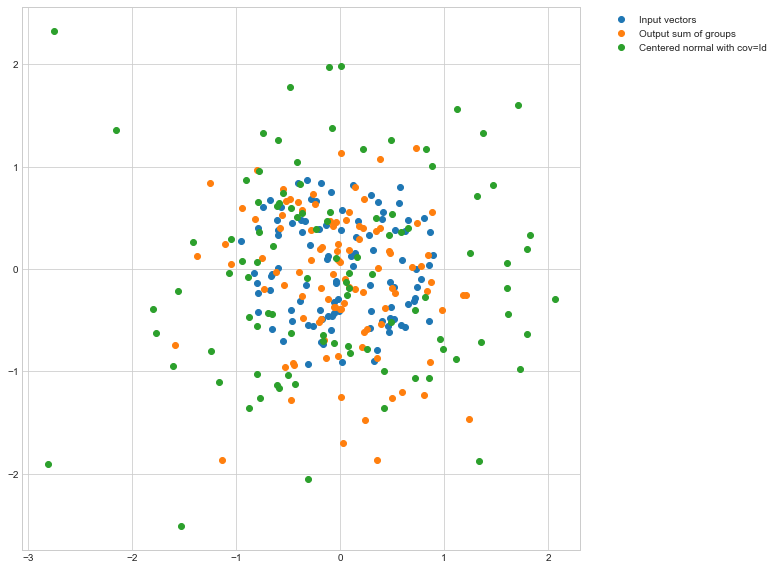

In [169]:
n=100
v=sample_from_sphere(n)
v=sample_from_ball(n)
print(f'v:{v}')
plt.plot([e[0] for e in v],[e[1] for e in v],'o',label='Input vector')
B=np.transpose(np.vstack(tuple([e for e in v])))
xs=[]
for i in range(n):
    xs.append(gram_schmidt_walk(v,np.zeros(n)))
plt.plot([np.matmul(B,x)[0] for x in xs],[np.matmul(B,x)[1] for x in xs],'o',label='Output sum of groups')
normals=np.random.multivariate_normal(np.zeros(2), np.diag(np.ones(2)), size=n)
plt.plot(normals[:,0],normals[:,1],'o',label='Centered normal with cov=Id')
plt.legend()
plt.legend(bbox_to_anchor=(1.35, 1))
tikzplotlib.save("3types.tex")

v:[array([8.812e-01, 6.664e-03]), array([-3.807e-02, 4.241e-01]), array([-2.442e-01, -8.201e-01]), array([3.342e-01, -6.714e-01]), array([-3.290e-01, -8.880e-01])]
det: -1.0401798462856079e-32
xs: [array([8.407e-02, 1.000e+00, 1.696e-01, 1.908e-01, 1.774e-01]), array([-8.407e-02, -1.000e+00, -1.696e-01, -1.908e-01, -1.774e-01])]
sum:[array([-7.633e-17, -2.776e-17]), array([7.633e-17, 2.776e-17])]


C:\Users\Ga Bo\Anaconda3\lib\site-packages\ipykernel_launcher.py:82: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


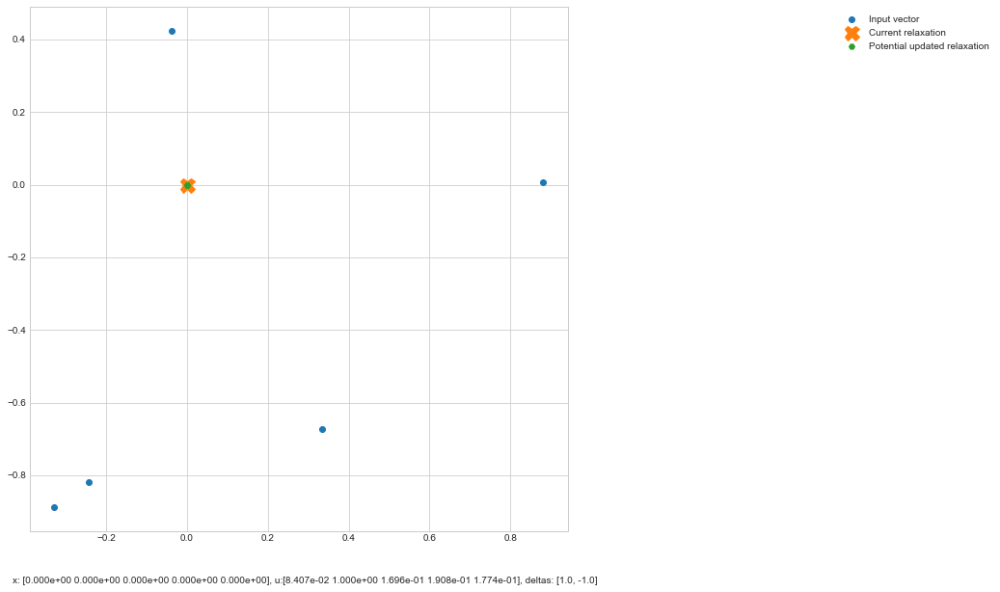

x:[8.407e-02 1.000e+00 1.696e-01 1.908e-01 1.774e-01]
det: 6.246071424173573e-17
xs: [array([8.415e-01, 1.000e+00, 6.490e-01, -1.000e+00, 6.406e-01]), array([-4.307e-01, 1.000e+00, -1.562e-01, 1.000e+00, -1.374e-01])]
sum:[array([2.776e-17, 0.000e+00]), array([-3.955e-16, 4.163e-17])]


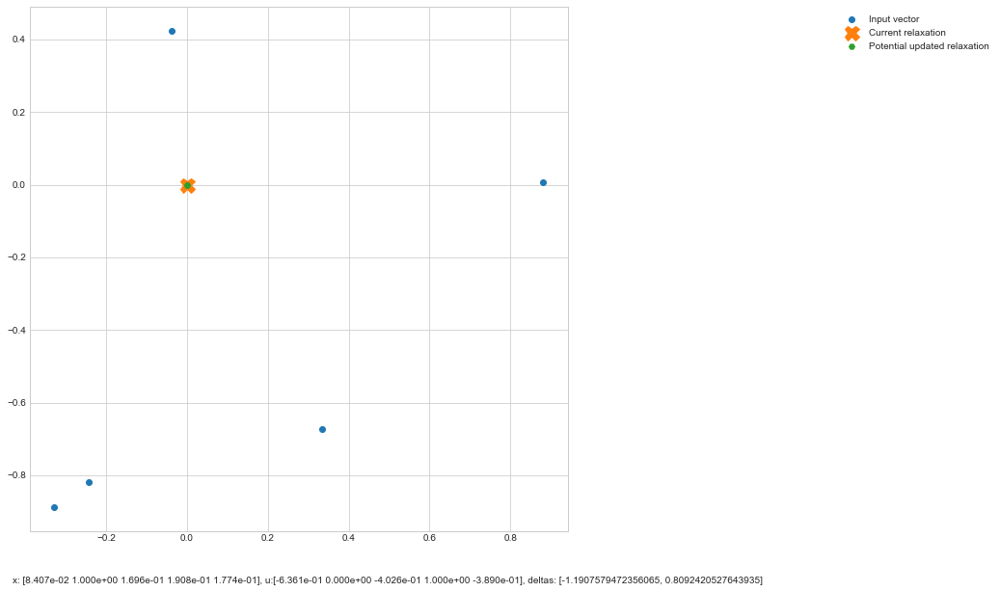

x:[8.415e-01 1.000e+00 6.490e-01 -1.000e+00 6.406e-01]
det: 0.6088840999625391
xs: [array([8.177e-01, 1.000e+00, 1.000e+00, -1.000e+00, 3.163e-01]), array([8.680e-01, 1.000e+00, 2.600e-01, -1.000e+00, 1.000e+00])]
sum:[array([1.665e-16, 5.551e-17]), array([0.000e+00, -1.110e-16])]


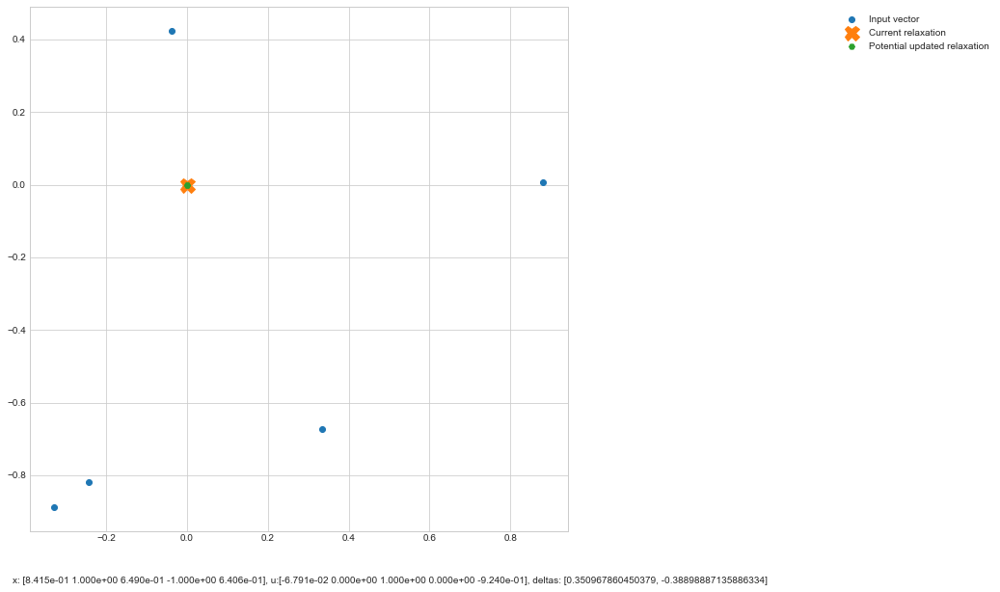

x:[8.177e-01 1.000e+00 1.000e+00 -1.000e+00 3.163e-01]
det: 0.8968532485269052
xs: [array([1.000e+00, 1.000e+00, 1.000e+00, -1.000e+00, 3.764e-01]), array([-1.000e+00, 1.000e+00, 1.000e+00, -1.000e+00, -2.833e-01])]
sum:[array([1.408e-01, -5.218e-02]), array([-1.404e+00, 5.203e-01])]


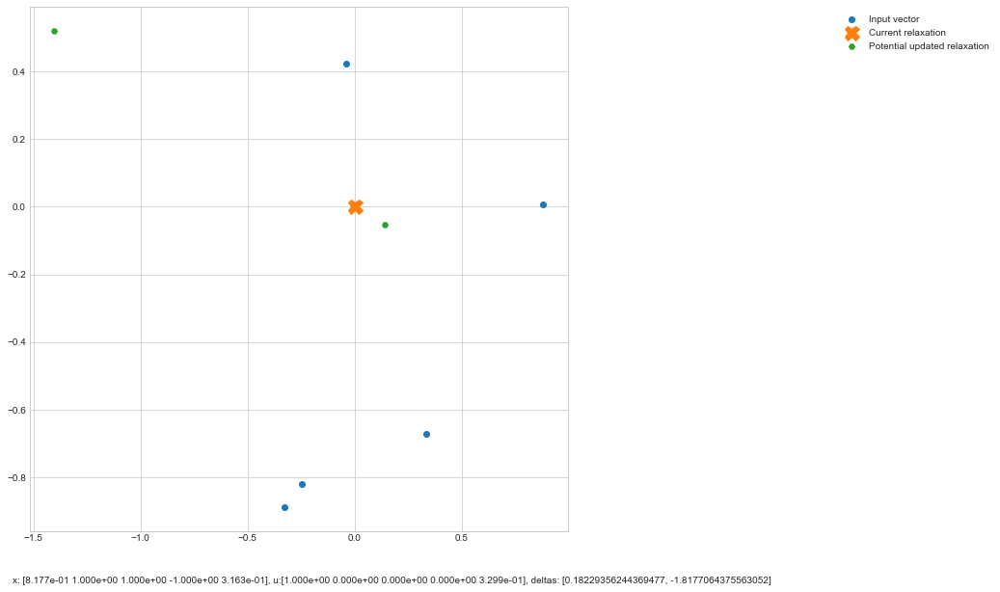

x:[1.000e+00 1.000e+00 1.000e+00 -1.000e+00 3.764e-01]
det: 1.0
xs: [array([1.000e+00, 1.000e+00, 1.000e+00, -1.000e+00, 1.000e+00]), array([1.000e+00, 1.000e+00, 1.000e+00, -1.000e+00, -1.000e+00])]
sum:[array([-6.432e-02, -6.059e-01]), array([5.937e-01, 1.170e+00])]


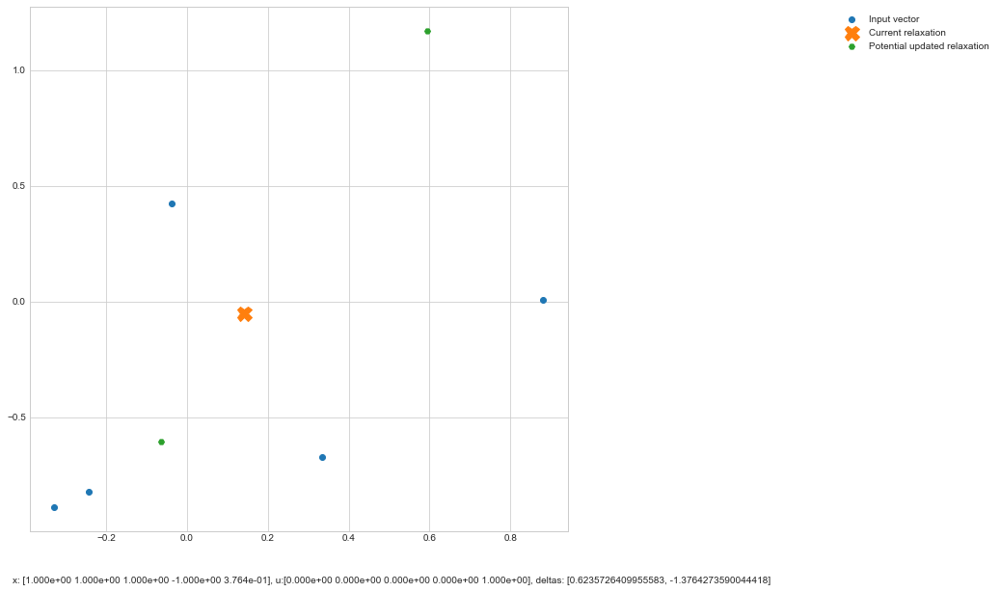

x:[1.000e+00 1.000e+00 1.000e+00 -1.000e+00 1.000e+00]
Every element is fixed


In [218]:
n=5
v=sample_from_sphere(n)
v=sample_from_ball(n)
print(f'v:{v}')
xs=[]
x=gram_schmidt_walk(v,np.zeros(n))